<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 5: ASHRAE - Great Energy Predictor III (Part 1 EDA)

 - [Problem Statement](#Problem-Statement)
 - [Executive Summary](#Executive-Summary)
 - [Methodology](#Methodology)
 - [Datasets](#Datasets)
 - [Data Import](#Data-Import)
 - [Exploratory Data Analysis](#Exploratory-Data-Analysis)

## Problem Statement

The Great Energy Predictor III from ASHRAE aims to develop counterfactual models for predicting energy across four energy types (electricity, chilledwater, steam, hotwater) based on historic usage rates and observed weather. Energy savings can then calculated by computing the new energy consumption after retrofit to the old building's modeled values. Findings of this study will be used to improve estimations of these energy-saving initiatives, allowing large-scale investors and financial institutions to be more willing to invest in building efficiencies.

The datasets contain 2,380 hourly energy meter readings from 1,448 buildings in 16 distinct locations throughout the world, with a total of 20 million observations (2016) in the train dataset and 41 million in the test dataset (2017-2019). The evaluation metric for this study will be Root Mean Squared Logarithmic Error (RMSLE), which is robust to outliers.

## Background Information

In the early days of artificial intelligence research for buildings, the Great Energy Predictor I and II contests paved the way for data-driven building energy prediction innovation. Many new ideas, tools, and data sources have emerged in the more over two decades after those early challenges, resulting in significantly more extensive datasets, which were the spark for the competition's revival. The goal of ASHRAE Great Energy Predictor III is to find the most effective data-driven building energy prediction techniques. The main technical goal was to figure out which model types, machine learning methods, and workflows worked best for this particular application of long-term meter prediction. 

In this project, we will approach this energy forecasting problem as a regression problem, and develop Decision Tree Ensemble models and deep learning GRUs models for each meter type that strikes the right balance in the bias-variance trade off.

Beyond technical considerations, the competition's primary goal was to bring the data science and building science communities closer together through the interchange of thoughts, terminologies, and approaches, according to the planning team. Building energy analysts often only employed the most basic machine learning techniques, while machine learning professionals knew little about buildings. The intention was for this competition to serve as a catalyst for post-competition exchange ([*source1*](https://www.ashrae.org/news/ashraejournal/searching-for-the-best-data-driven-energy-prediction-techniques)).

## Methodology 

Following Blitzstein & Pfister’s workflow ([*source2*](https://github.com/cs109/2015/blob/master/Lectures/01-Introduction.pdf)), a 5 steps framework was implemented to conduct this analysis. These 5 steps are:

**Step 1: Ask an interesting question**
- Defining a clear and concise problem statement.

**Step 2: Get the data**
- Import and clean raw data to ensure that all datatypes were accurate and any other errors were fixed.

**Step 3: Explore the data**
- Check for duplicated posts for datasets
- Plot visualization for distribution of posts of datasets
- Investigate correlation between target variable with feartures
- Feature engineering
- Feature transformation
- Removal of outliers

**Step 4: Model the data**
- Model 1: LGBM Regressor
- Conduct hyperparameters tuning and find best params
- Model 2: Deep learning GRU
- Ensemble model 1 and 2
- Data Visualization
  - lineplot
  - barplot / histograms
  - LOFO importance plot

**Step 5: Communicate and visualize the results**
- Present findings to a non-technical audience and provide recommendations

## Datasets

[`train.csv`](../datasets/raw/train.csv)
- building_id - Foreign key for the building metadata
- meter - The meter id code. Read as {0: electricity, 1: chilledwater, 2: steam, 3: hotwater}. Not every building has all meter types.
- timestamp - When the measurement was taken
- meter_reading - The target variable. Energy consumption in kWh (or equivalent). Note that this is real data with measurement error, which we expect will impose a baseline level of modeling error. UPDATE: as discussed here, the site 0 electric meter readings are in kBTU.


[`building_meta.csv`](../datasets/raw/building_meta.csv)
- site_id - Foreign key for the weather files.
- building_id - Foreign key for training.csv
- primary_use - Indicator of the primary category of activities for the building based on EnergyStar property type definitions
- square_feet - Gross floor area of the building
- year_built - Year building was opened
- floor_count - Number of floors of the building

[`weather_[train/test].csv`](../datasets/raw/weather_[train/test].csv)
Weather data from a meteorological station as close as possible to the site.
- site_id
- air_temperature - Degrees Celsius
- cloud_coverage - Portion of the sky covered in clouds, in oktas
- dew_temperature - Degrees Celsius
- precip_depth_1_hr - Millimeters
- sea_level_pressure - Millibar/hectopascals
- wind_direction - Compass direction (0-360)
- wind_speed - Meters per second

[`test.csv`](../datasets/raw/test.csv)
- row_id - Row id for your submission file
- building_id - Building id code
- meter - The meter id code
- timestamp - Timestamps for the test data period


## Data Import

#### Importing Libraries

In [1]:
# Importing the required libraries-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import datetime as dt
import plotly.express as px
import scipy

import warnings
warnings.filterwarnings('ignore')

In [3]:
test_df = pd.read_csv('../datasets/raw/test.csv', parse_dates=['timestamp'])
train_df = pd.read_csv('../datasets/raw/train.csv', parse_dates=['timestamp'])
weather_train_df = pd.read_csv('../datasets/raw/weather_train.csv', parse_dates=['timestamp'])
weather_test_df = pd.read_csv('../datasets/raw/weather_test.csv', parse_dates=['timestamp'])
building_df = pd.read_csv('../datasets/raw/building_metadata.csv')

## Exploratory Data Analysis

#### Basic  Shape, Null Values, Duplicate rows check on Train and Test Datasets

In [4]:
datasets = [(train_df,'train_df'), (test_df,'test_df'), (weather_train_df,'weather_train_df'), (weather_test_df,'weather_test_df'), (building_df, 'building_df')]

In [5]:
for dataset, name in datasets:
    print(f"Datasets Statstic for: {name}")
    print(f"Shape: {dataset.shape}")
    print(f"Null Values: {dataset.isnull().sum()}")
    print("Duplicated rows:")
    print(f"{dataset[dataset.duplicated()].count()}")
    print('--------------------------------------------------------------')

Datasets Statstic for: train_df
Shape: (20216100, 4)
Null Values: building_id      0
meter            0
timestamp        0
meter_reading    0
dtype: int64
Duplicated rows:
building_id      0
meter            0
timestamp        0
meter_reading    0
dtype: int64
--------------------------------------------------------------
Datasets Statstic for: test_df
Shape: (41697600, 4)
Null Values: row_id         0
building_id    0
meter          0
timestamp      0
dtype: int64
Duplicated rows:
row_id         0
building_id    0
meter          0
timestamp      0
dtype: int64
--------------------------------------------------------------
Datasets Statstic for: weather_train_df
Shape: (139773, 9)
Null Values: site_id                   0
timestamp                 0
air_temperature          55
cloud_coverage        69173
dew_temperature         113
precip_depth_1_hr     50289
sea_level_pressure    10618
wind_direction         6268
wind_speed              304
dtype: int64
Duplicated rows:
site_id        

#### Inspecting memory usage on Train and Test Datasets

In [6]:
for dataset,name in datasets:
    print(f"{name}")
    print(dataset.info(memory_usage='deep'))
    print('--------------------------------------------------------------')

train_df
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20216100 entries, 0 to 20216099
Data columns (total 4 columns):
 #   Column         Dtype         
---  ------         -----         
 0   building_id    int64         
 1   meter          int64         
 2   timestamp      datetime64[ns]
 3   meter_reading  float64       
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 616.9 MB
None
--------------------------------------------------------------
test_df
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41697600 entries, 0 to 41697599
Data columns (total 4 columns):
 #   Column       Dtype         
---  ------       -----         
 0   row_id       int64         
 1   building_id  int64         
 2   meter        int64         
 3   timestamp    datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 1.2 GB
None
--------------------------------------------------------------
weather_train_df
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139773 entries, 

In [7]:
# Compress trian, test, weather train and test datasets
# reduce_mem_usage function inspired from https://www.kaggle.com/code/gemartin/load-data-reduce-memory-usage/notebook
# This function uses the following approach:
# - Iterate over every column
# - Determine if the column is numeric
# - Determine if the column can be represented by an integer
# - Find the min and the max value
# - Determine and apply the smallest datatype that can fit the range of values

def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [8]:
#set timestamp as index
train_df.set_index('timestamp', inplace=True)
test_df.set_index('timestamp', inplace=True)
weather_train_df.set_index('timestamp', inplace=True)
weather_test_df.set_index('timestamp', inplace=True)

In [9]:
print('Compressed Test Dataframe')
compressed_test_df = reduce_mem_usage(test_df)
print('--------------------------------------------------------------')

Compressed Test Dataframe
Memory usage of dataframe is 1272.51 MB
Memory usage after optimization is: 596.49 MB
Decreased by 53.1%
--------------------------------------------------------------


In [10]:
print('Compressed Train Dataframe')
compressed_train_df = reduce_mem_usage(train_df)
print('--------------------------------------------------------------')
print('Compressed Weather Train Dataframe')
compressed_weather_train_df = reduce_mem_usage(weather_train_df)
print('--------------------------------------------------------------')
print('Compressed Weather Test Dataframe')
compressed_weather_test_df = reduce_mem_usage(weather_test_df)
print('--------------------------------------------------------------')

Compressed Train Dataframe
Memory usage of dataframe is 616.95 MB
Memory usage after optimization is: 289.19 MB
Decreased by 53.1%
--------------------------------------------------------------
Compressed Weather Train Dataframe
Memory usage of dataframe is 9.60 MB
Memory usage after optimization is: 3.07 MB
Decreased by 68.1%
--------------------------------------------------------------
Compressed Weather Test Dataframe
Memory usage of dataframe is 19.04 MB
Memory usage after optimization is: 6.08 MB
Decreased by 68.1%
--------------------------------------------------------------


#### Merging building metainfo and weather with trian and test datasets 

In [11]:
#check first if all building_id in train dataset exist in test dataset, if true check if all building_id exist in building metadata dataframe
print(pd.concat([compressed_train_df['building_id'],compressed_test_df['building_id']]).drop_duplicates(keep=False))

Series([], Name: building_id, dtype: int16)


In [12]:
print(pd.concat([compressed_train_df['building_id'],building_df['building_id']]).drop_duplicates(keep=False))

Series([], Name: building_id, dtype: int64)


In [16]:
compressed_test_df.reset_index(inplace=True)
compressed_train_df.reset_index(inplace=True)
compressed_weather_train_df.reset_index(inplace=True)
compressed_weather_test_df.reset_index(inplace=True)

In [18]:
#merge train and test sets with building metainfo based on unique building_id
merged_train_df = compressed_train_df.merge(building_df, on='building_id', how='left')
merged_test_df = compressed_test_df.merge(building_df, on='building_id', how='left')

In [19]:
# check if all site_id, timetamp in merged_train_df/merged_test_df exist in weather train/test datasets
print(pd.concat([merged_train_df[['site_id','timestamp']],compressed_weather_train_df[['site_id','timestamp']]]).drop_duplicates(keep=False))

         site_id           timestamp
2316357       15 2016-02-12 03:00:00
2324621       15 2016-02-12 07:00:00
2421813       15 2016-02-14 06:00:00
2438385       15 2016-02-14 14:00:00
2554294       15 2016-02-16 22:00:00
...          ...                 ...
133329        15 2016-03-29 10:00:00
133330        15 2016-03-29 12:00:00
133331        15 2016-03-29 13:00:00
133332        15 2016-03-29 14:00:00
133333        15 2016-03-29 15:00:00

[162 rows x 2 columns]


In [20]:
print(pd.concat([merged_test_df[['site_id','timestamp']],compressed_weather_test_df[['site_id','timestamp']]]).drop_duplicates(keep=False))

Empty DataFrame
Columns: [site_id, timestamp]
Index: []


In [21]:
#162 missing records in our weather train dataset when comparing merged_train_df with our training weather dataset, let's dive deeper on the missing data
missing_df = pd.concat([merged_train_df[['site_id','timestamp']],compressed_weather_train_df[['site_id','timestamp']]]).drop_duplicates(keep=False)

In [22]:
missing_df['year_month_day'] = missing_df['timestamp'].dt.strftime("%Y-%m-%d")

In [23]:
print(f"List of unique sites_id with missing data: {missing_df.site_id.unique()}")
print(f"List of unique year_month_day with missing data: {missing_df.year_month_day.unique()}")

List of unique sites_id with missing data: [15  4  6  8  9 10 11]
List of unique year_month_day with missing data: ['2016-02-12' '2016-02-14' '2016-02-16' '2016-02-19' '2016-02-20'
 '2016-02-22' '2016-02-23' '2016-02-26' '2016-03-01' '2016-03-05'
 '2016-03-06' '2016-03-07' '2016-03-10' '2016-03-14' '2016-03-15'
 '2016-03-16' '2016-03-17' '2016-03-18' '2016-03-19' '2016-03-23'
 '2016-03-24' '2016-03-13' '2016-10-09' '2016-12-23' '2016-01-27'
 '2016-01-31' '2016-03-25' '2016-03-26' '2016-03-27' '2016-03-28'
 '2016-03-29']


Observation: Most of the missing data exist between Jan 2016 - Mar 2016

In [26]:
#merge train and test sets with weather datasets based on unique site_id, timestamp
final_train_df = merged_train_df.merge(compressed_weather_train_df, on=['site_id', 'timestamp'], how='left')
final_test_df = merged_test_df.merge(compressed_weather_test_df, on=['site_id', 'timestamp'], how='left')

In [27]:
def check_null_percentrage(df):
    for col in df.columns:
        n_nan = df[col].isnull().sum()
        if n_nan > 0:
            print(f"{col} has {n_nan} NaNs, this represents {round(n_nan/len(df)*100,2)}% of the data")
    return

In [28]:
check_null_percentrage(final_train_df)

year_built has 12127645 NaNs, this represents 59.99% of the data
floor_count has 16709167 NaNs, this represents 82.65% of the data
air_temperature has 96658 NaNs, this represents 0.48% of the data
cloud_coverage has 8825365 NaNs, this represents 43.66% of the data
dew_temperature has 100140 NaNs, this represents 0.5% of the data
precip_depth_1_hr has 3749023 NaNs, this represents 18.54% of the data
sea_level_pressure has 1231669 NaNs, this represents 6.09% of the data
wind_direction has 1449048 NaNs, this represents 7.17% of the data
wind_speed has 143676 NaNs, this represents 0.71% of the data


Observation: Top features with missing values are year_built, floor_count and cloud coverage

#### Overview of consumption; timeseries and distribution chart

Text(0, 0.5, 'meter_reading')

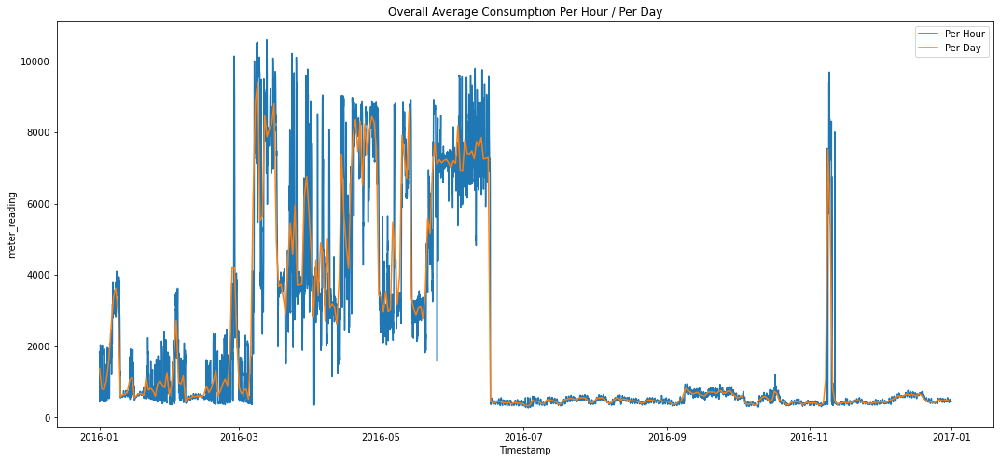

In [29]:
# plot time series of avearge consumption (per hour / per day) 
plt.figure(figsize=(18,8))
sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=train_df[['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=train_df[['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
plt.title(f'Overall Average Consumption Per Hour / Per Day')
plt.xlabel('Timestamp')
plt.ylabel(f'meter_reading')

<AxesSubplot:title={'center':'Overall Energy Consumption Distribution Plot'}, xlabel='meter_reading', ylabel='Density'>

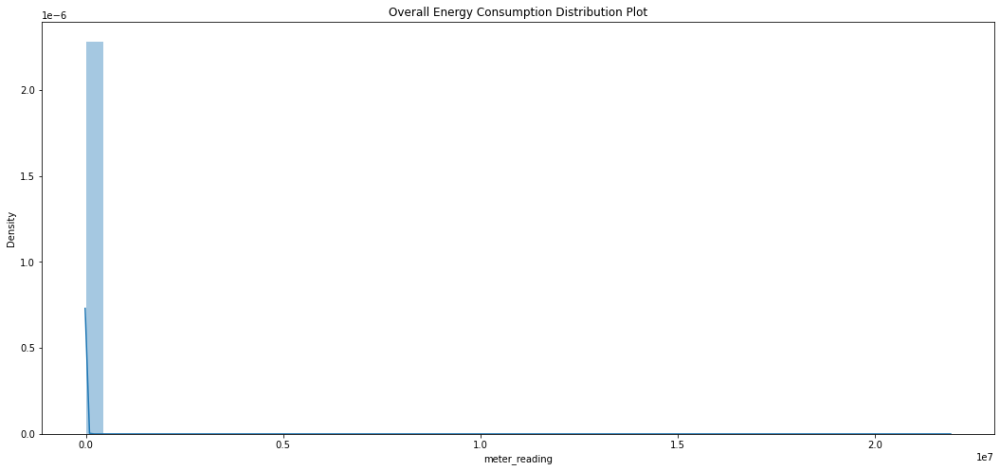

In [30]:
# plot distribution of energy consumption to check if data transformation is required; i.e. logarithmic transformation
plt.figure(figsize=(18,8))
plt.title(f'Overall Energy Consumption Distribution Plot')
sns.distplot(train_df['meter_reading'])

In [85]:
fig = px.scatter(final_train_df[final_train_df['meter_reading']>100_000], x="timestamp", y="meter_reading",color='building_id', title="Energy consumed by Building_id")
fig.show()

Observations:

- The time series reveals a high variance in overall consumption pattern, with meter reading spikes in the months of March to June and November.

- The distribution figure reveals a right-skewed histogram, implying that data transformation for the targeted variable- energy consumption may be required.

- Plotly chart also revealed that building 1099 is an obvious outlier in energ yconsumption.

- Let's dig deeper on what's are the facilities / sites / affecting the overall trend. 

#### Average energy consumption (kWh) usage for different facilities

In [23]:
final_train_df.groupby('primary_use')['meter_reading'].mean().sort_values(ascending=False)

primary_use
Education                        4585.091797
Services                         4113.468262
Healthcare                        738.597595
Office                            526.504395
Utility                           512.736877
Entertainment/public assembly     473.880676
Food sales and service            304.908020
Public services                   288.237854
Manufacturing/industrial          285.897003
Lodging/residential               279.710449
Parking                           169.386795
Retail                            139.782394
Other                             138.703781
Technology/science                138.204254
Warehouse/storage                  54.362312
Religious worship                   5.375846
Name: meter_reading, dtype: float32

Observation: Because different building types will have varying operating hours, some variance in energy use is expected. Out of all the facilities, education and services have the highest consumptions.

#### Number of unique buildings for different facilities in train dataset

In [24]:
final_train_df.groupby(by='primary_use').agg({'building_id':pd.Series.nunique}).rename(columns={'building_id':'Num_of_buildings'})

,Num_of_buildings
primary_use,
Education,549
Entertainment/public assembly,184
Food sales and service,5
Healthcare,23
Lodging/residential,147
Manufacturing/industrial,12
Office,279
Other,25
Parking,22


In [25]:
facilities = final_train_df.primary_use.unique()

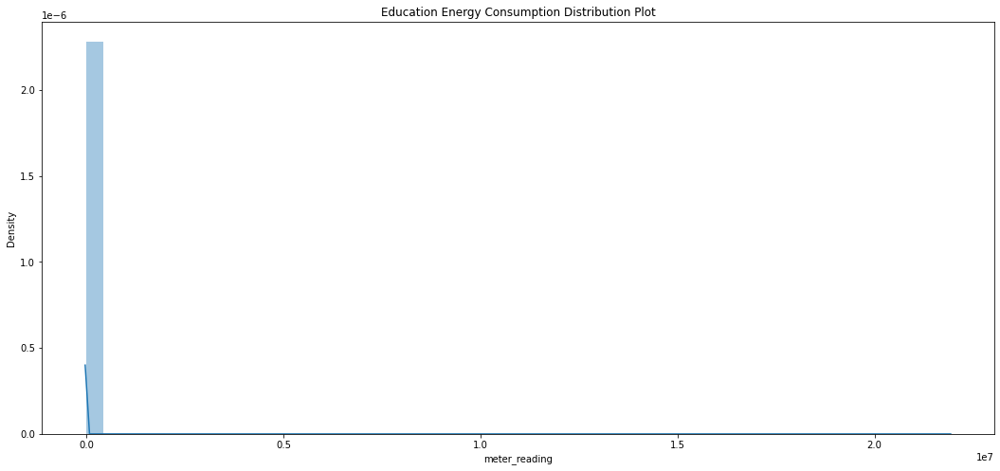

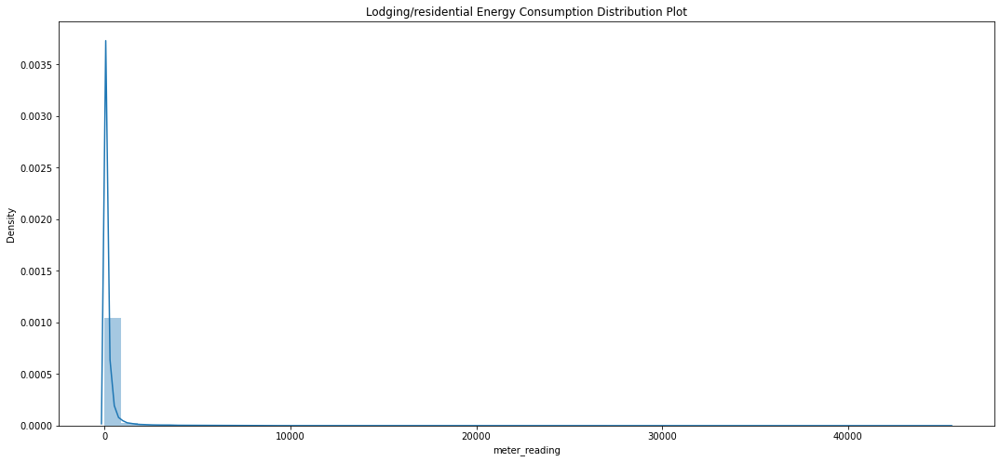

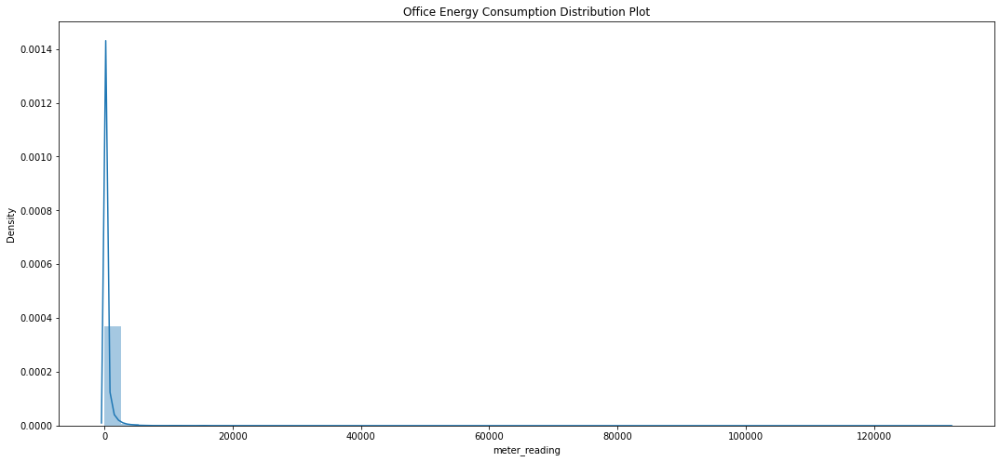

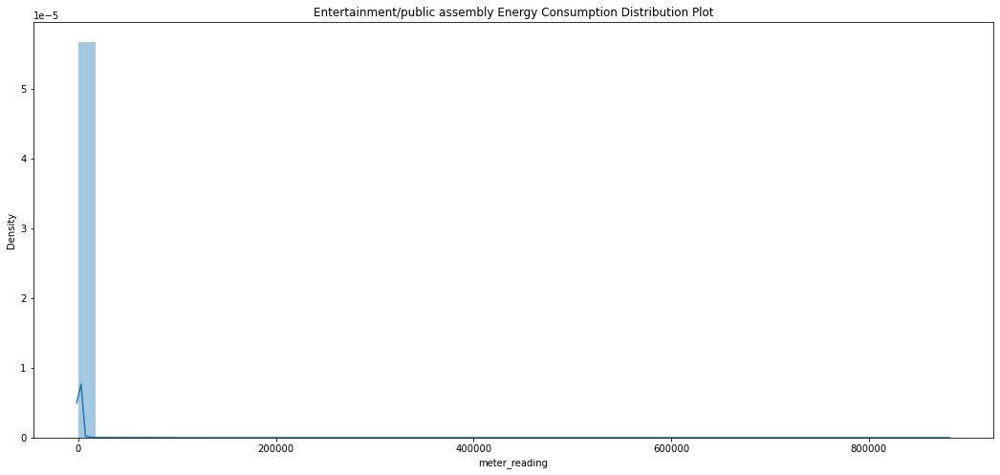

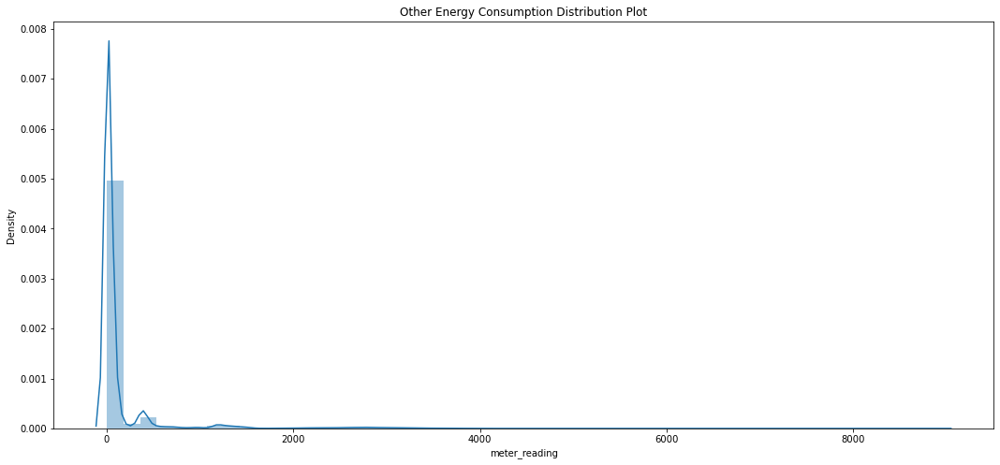

...

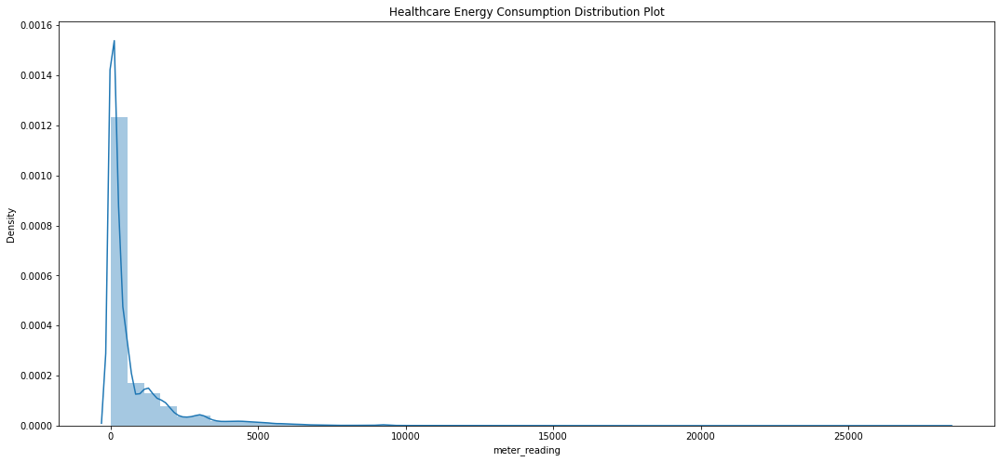

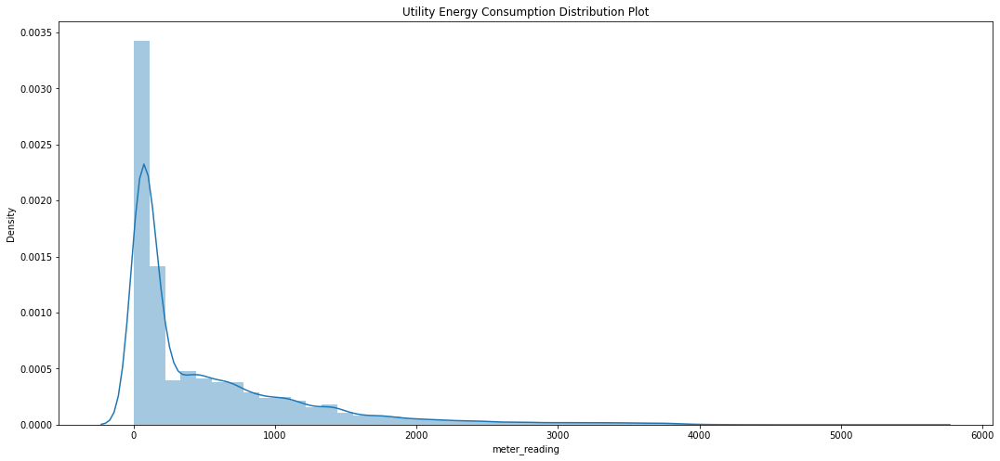

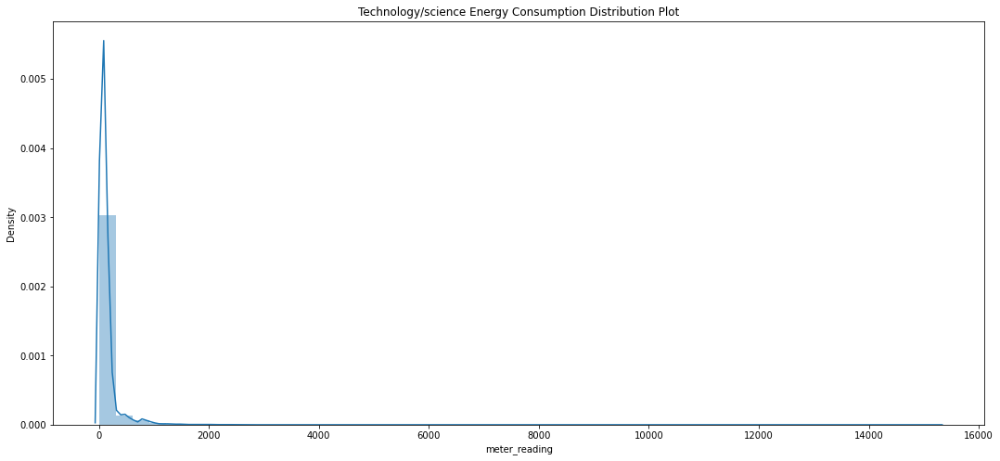

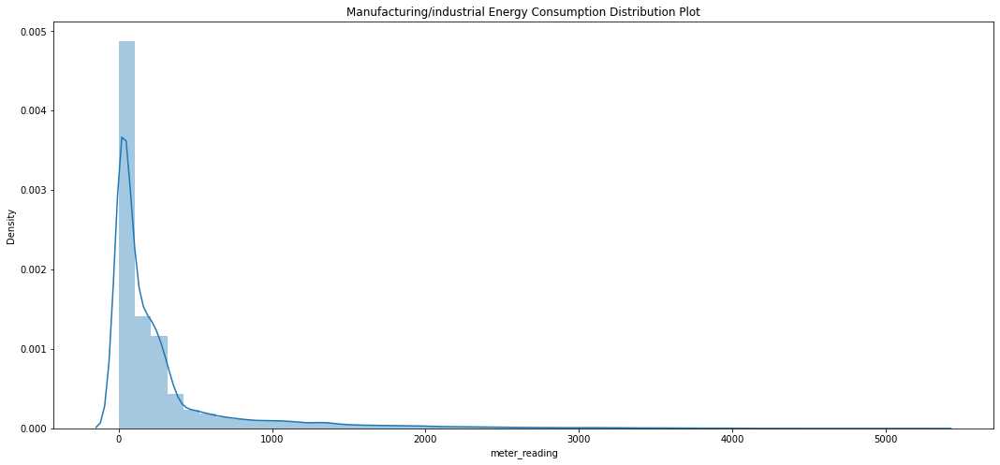

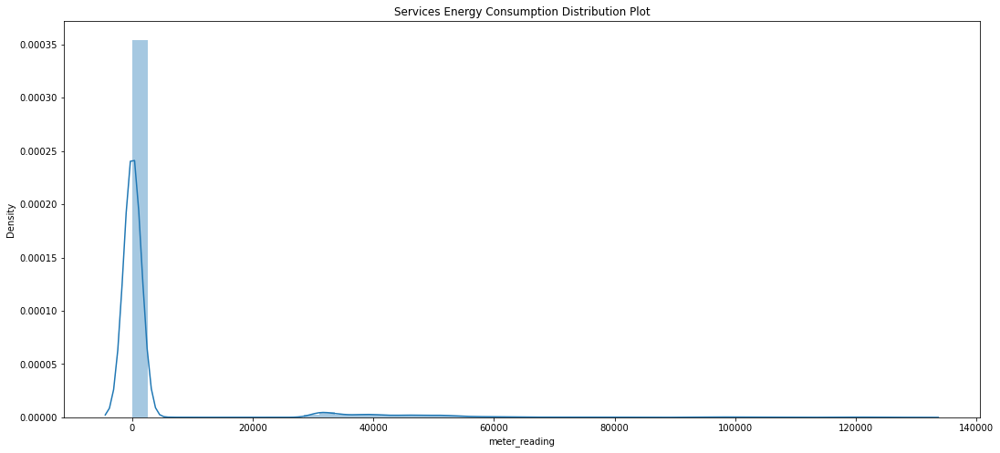

In [26]:
#let's plot the energy consumption distribution for each of all the facilities to check for any trends
for facility in facilities:
    plt.figure(figsize=(18,8))
    plt.title(f'{facility} Energy Consumption Distribution Plot')
    sns.distplot(final_train_df[(final_train_df['primary_use']==facility)]['meter_reading'])

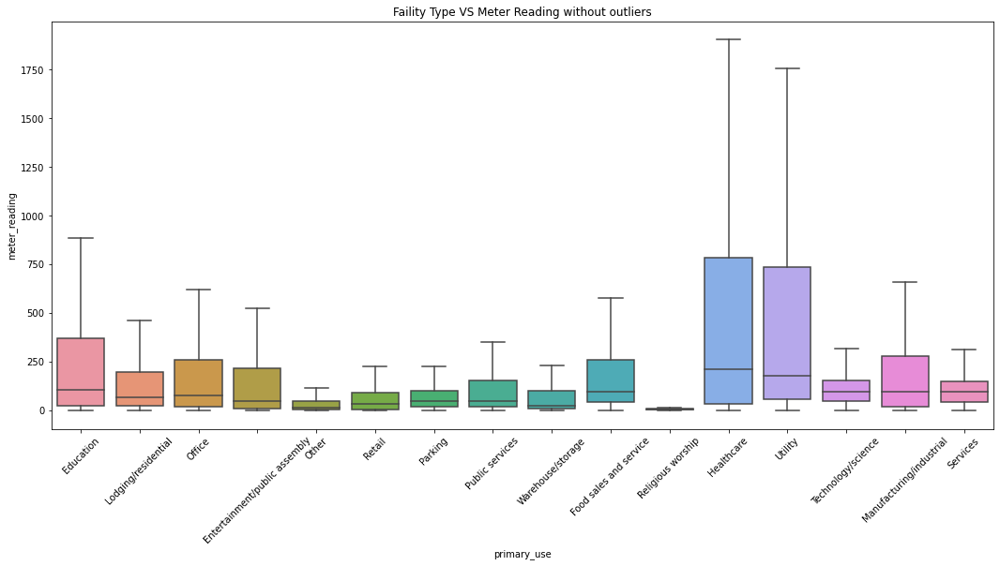

In [71]:
#box plot for all facilities vs meter readings without outliers
plt.figure(figsize = (18,8))
plt.xticks(rotation=45)
sns.boxplot(x='primary_use', y='meter_reading', data=final_train_df, showfliers=False).set_title("Faility Type VS Meter Reading without outliers");

Observation: Both healthcare and utlity facilities show the highest variations in meter_reading without outliers.

In [28]:
# plot time series of avearge consumption (per hour / per day) for the different facilities 
def plot_consumption(df,columns):
   
    for facility in columns:
        
        plt.figure(figsize=(18,8))
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['primary_use'] == facility][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['primary_use'] == facility][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
        plt.title(f'{facility} Average Consumption Per Hour / Per Day')
        plt.xlabel('Timestamp')
        plt.ylabel(f'meter_reading')
    
    return

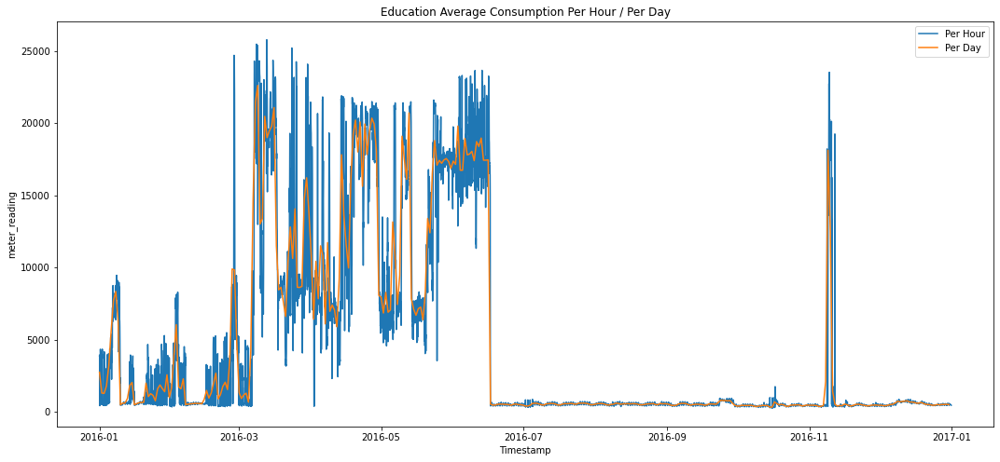

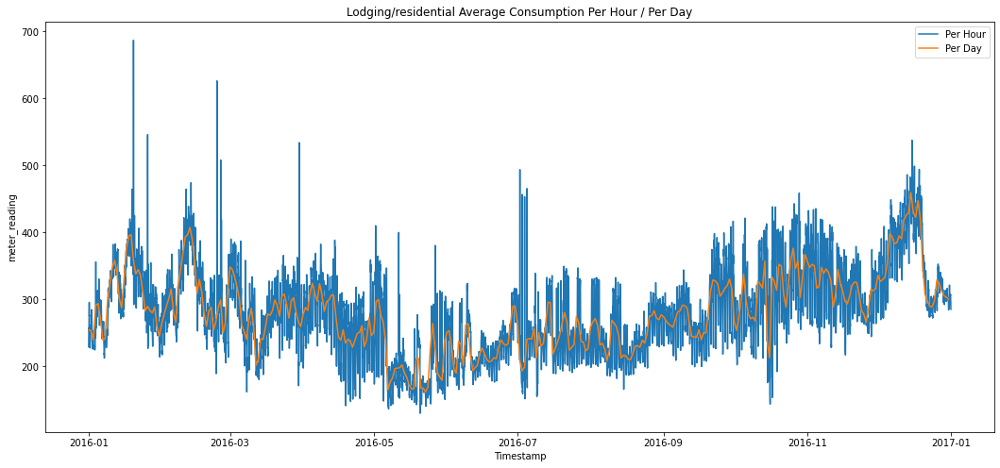

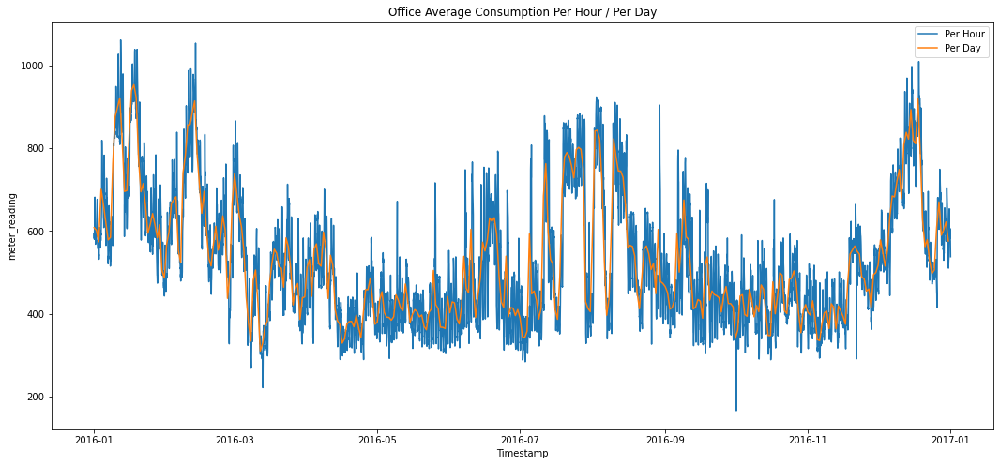

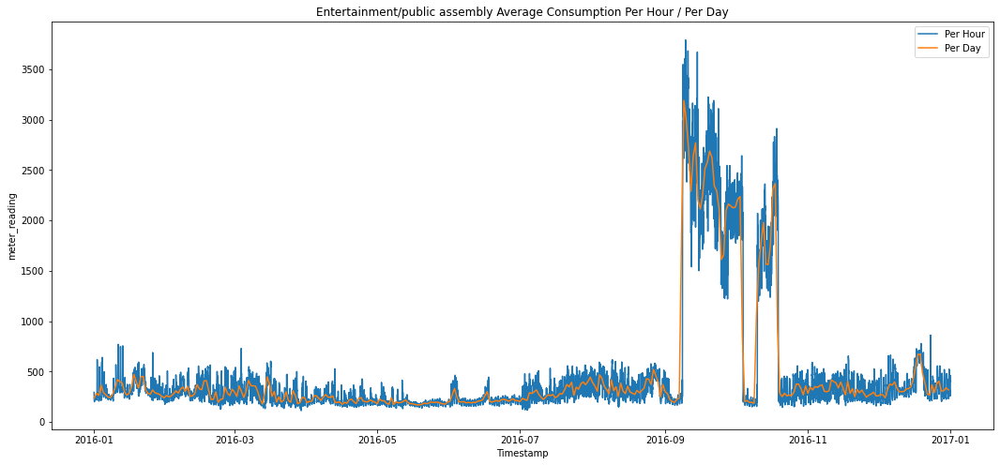

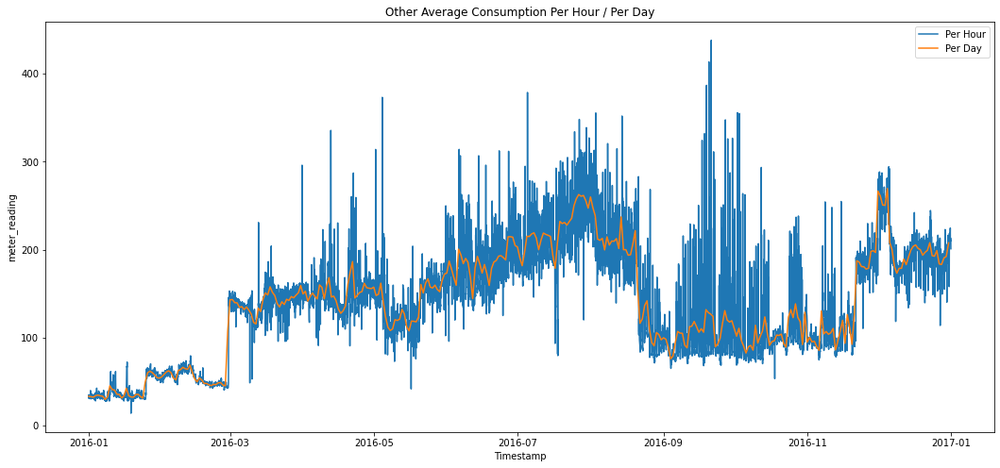

...

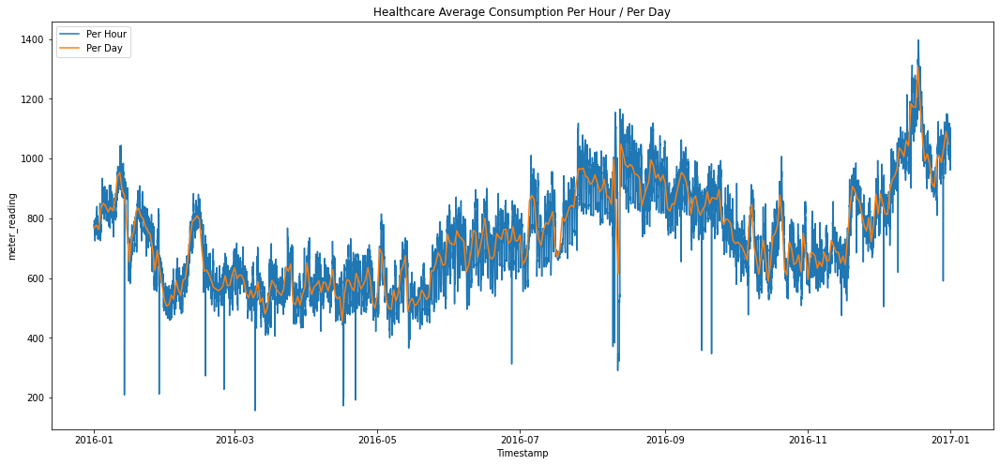

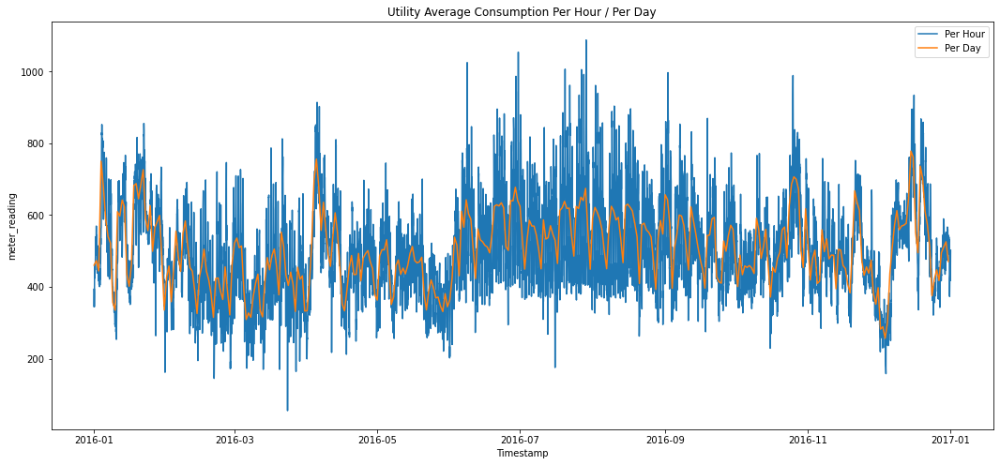

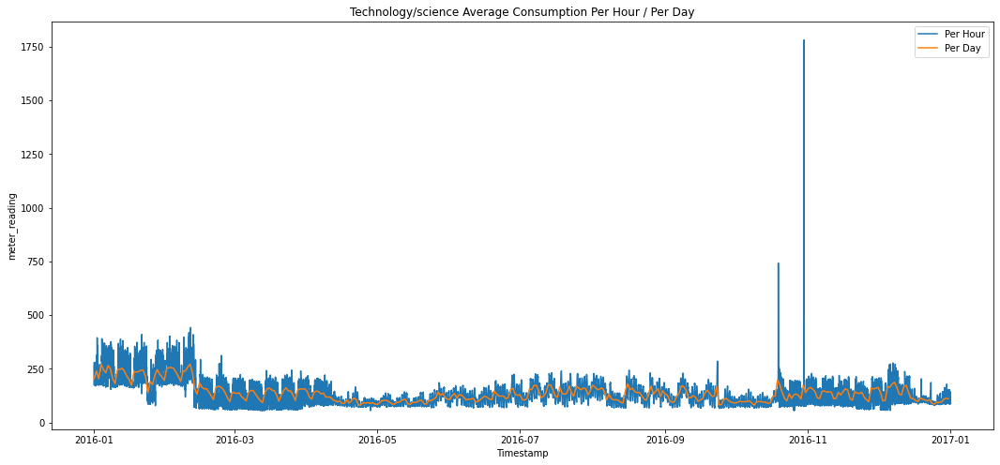

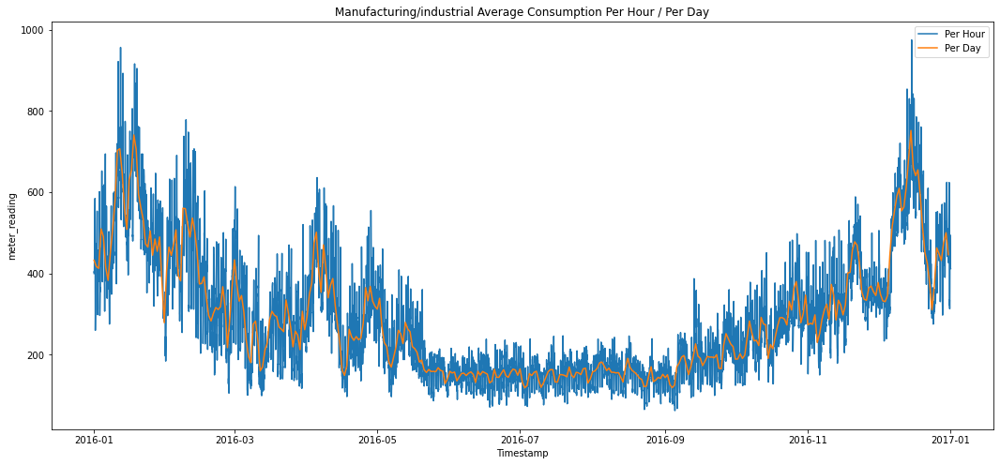

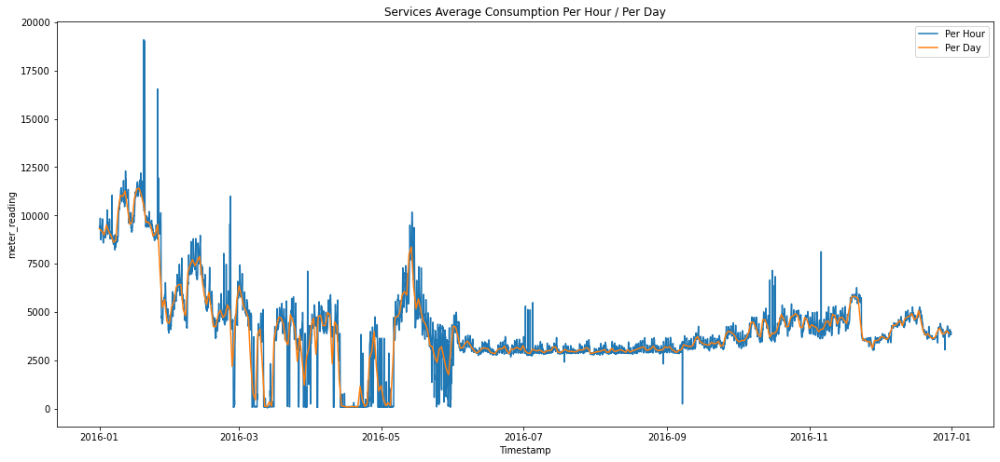

In [29]:
plot_consumption(final_train_df,facilities)

Observation: Out of these facilities, education, entertainment and retail stood out for their inconsistent readings throughout the year 

#### Investigate Outliers for Education, Entertainment and Retail

In [30]:
masked_df = final_train_df[(final_train_df['primary_use']=='Education') | (final_train_df['primary_use']=='Entertainment/public assembly') | (final_train_df['primary_use']=='Retail')]

In [31]:
masked_df.groupby('primary_use')['meter_reading'].describe()

,count,mean,std,min,25%,50%,75%,max
primary_use,,,,,,,,
Education,8165504.0,4447.462402,240971.265625,0.0,25.120825,106.750000,368.248993,21904700.0
Entertainment/public assembly,2264917.0,472.817261,10473.013672,0.0,7.833300,46.072800,213.942001,880374.0
Retail,112657.0,139.780548,325.839783,0.0,3.620000,31.933001,91.440002,3202.0


In [32]:
print(f"Education buildings more than average 100,000 kWh: {masked_df[(masked_df['meter_reading']>100000) & (masked_df['primary_use']=='Education')]['building_id'].nunique()}")
print(f"Entertainment/Public Assembly buildings more than average 100,000 kWh: {masked_df[(masked_df['meter_reading']>100000) & (masked_df['primary_use']=='Entertainment/public assembly')]['building_id'].nunique()}")
print(f"Retail buildings more than average 1000 kWh: {masked_df[(masked_df['meter_reading']>1000) & (masked_df['primary_use']=='Retail')]['building_id'].nunique()}")

Education buildings more than average 100,000 kWh: 5
Entertainment/Public Assembly buildings more than average 100,000 kWh: 2
Retail buildings more than average 1000 kWh: 2


In [33]:
outliers_education = masked_df[(masked_df['meter_reading']>100000) & (masked_df['primary_use']=='Education')]['building_id'].unique()
outliers_entertainment = masked_df[(masked_df['meter_reading']>100000) & (masked_df['primary_use']=='Entertainment/public assembly')]['building_id'].unique()
outliers_retail = masked_df[(masked_df['meter_reading']>1000) & (masked_df['primary_use']=='Retail')]['building_id'].unique()

In [34]:
def outlier_buildings(df,ls):
    for building in list(ls):
        plt.figure(figsize=(18,8))
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['building_id'] == building][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['building_id'] == building][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
        plt.title(f'Building {building} Average Consumption Per Hour / Per Day')
        plt.xlabel('Timestamp')
        plt.ylabel(f'meter_reading')
    return

#### Building Outliers in the Education Facility

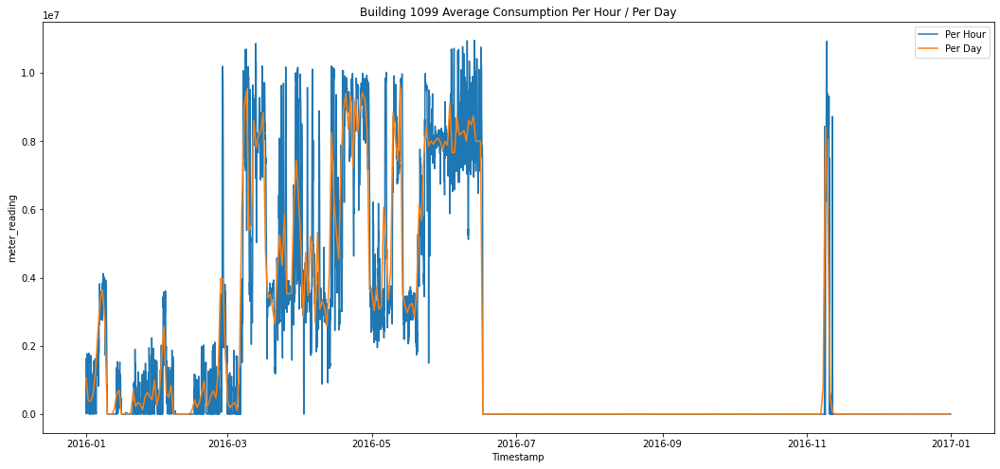

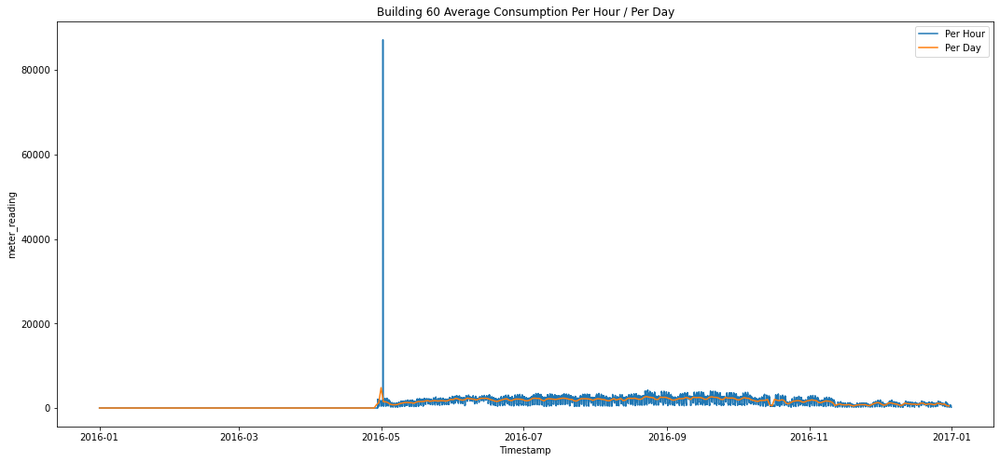

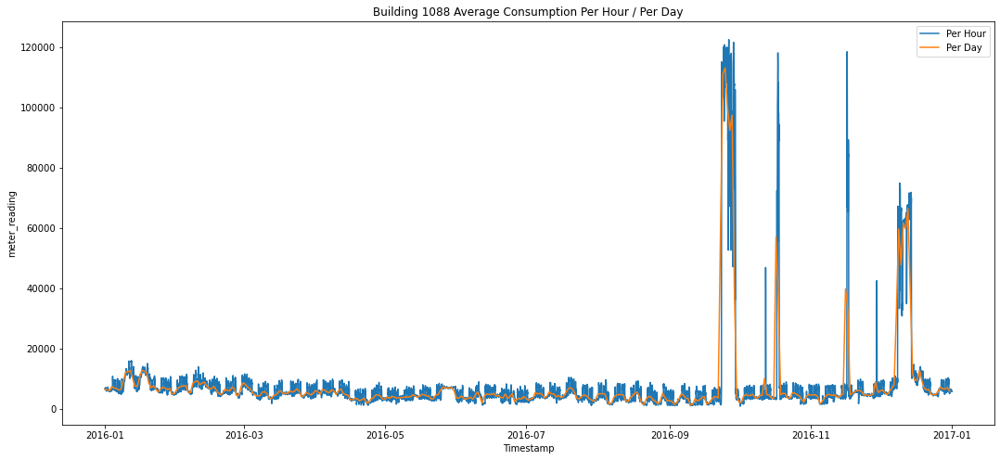

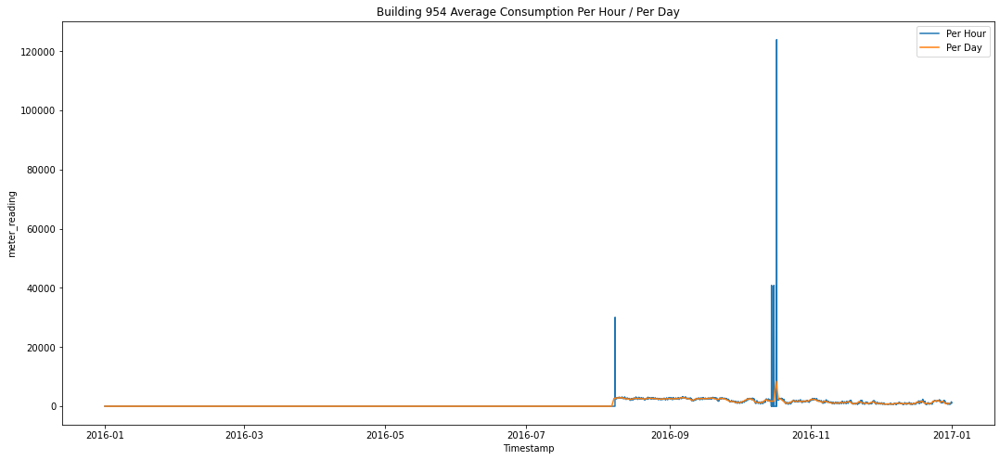

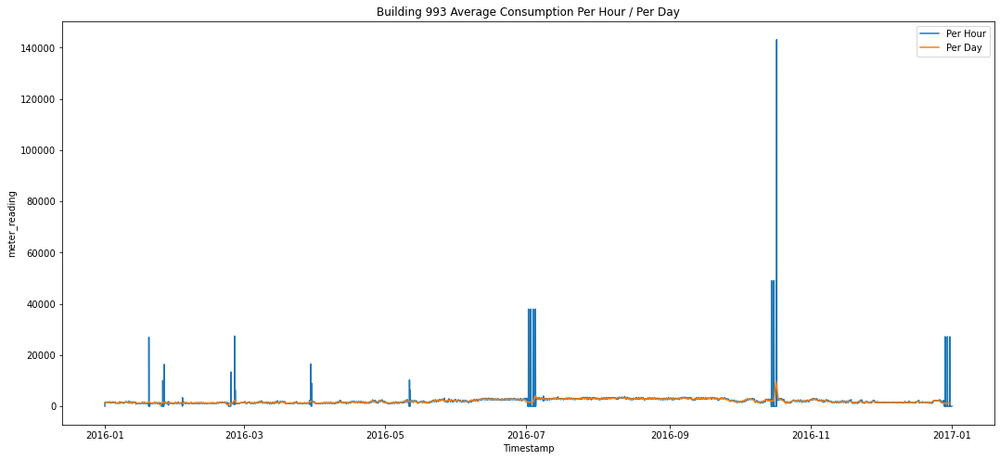

In [35]:
outlier_buildings(masked_df,outliers_education)

#### Building Outliers in the Entertainment Facility

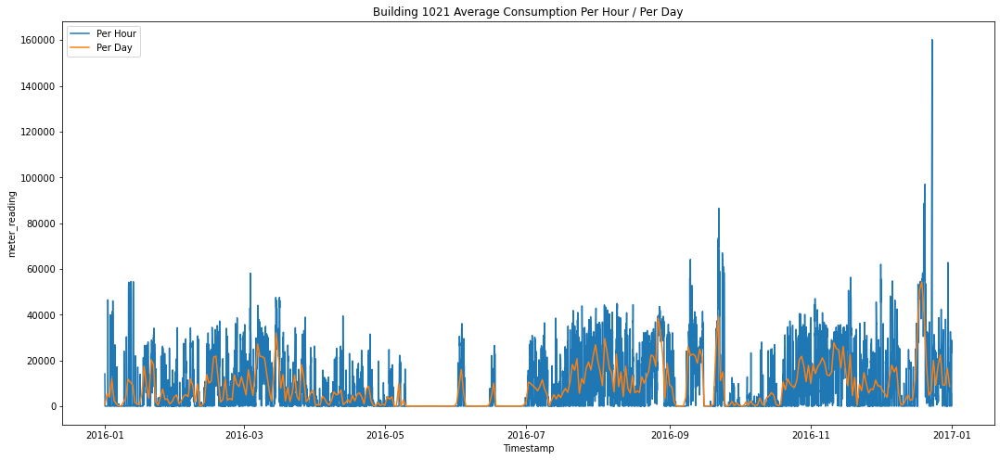

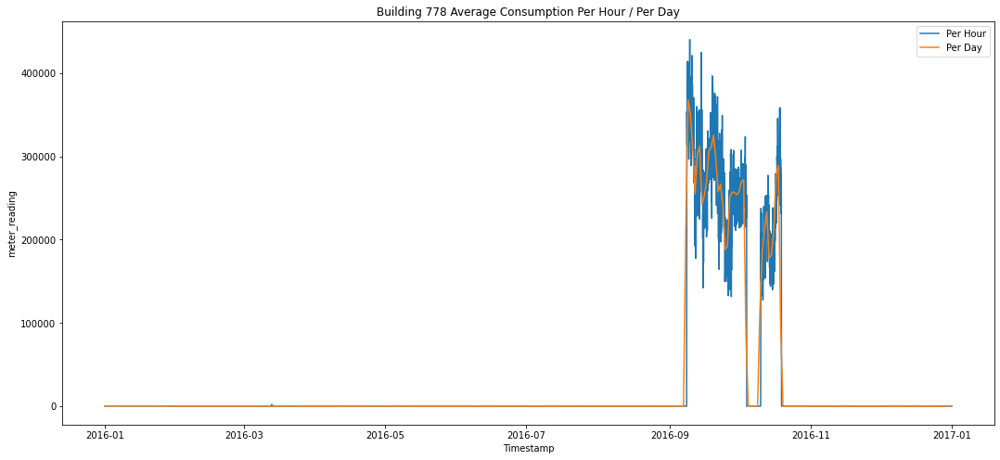

In [36]:
outlier_buildings(masked_df,outliers_entertainment)

#### Building Outliers in the Retail Facility

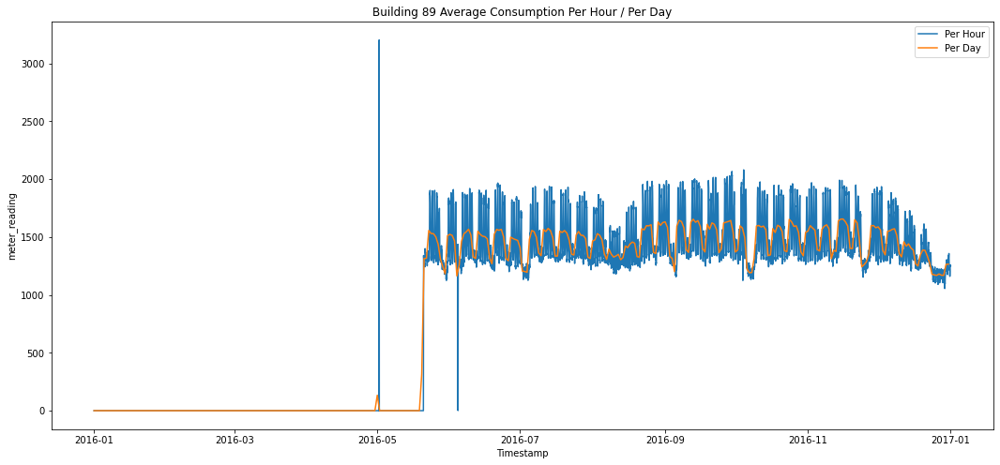

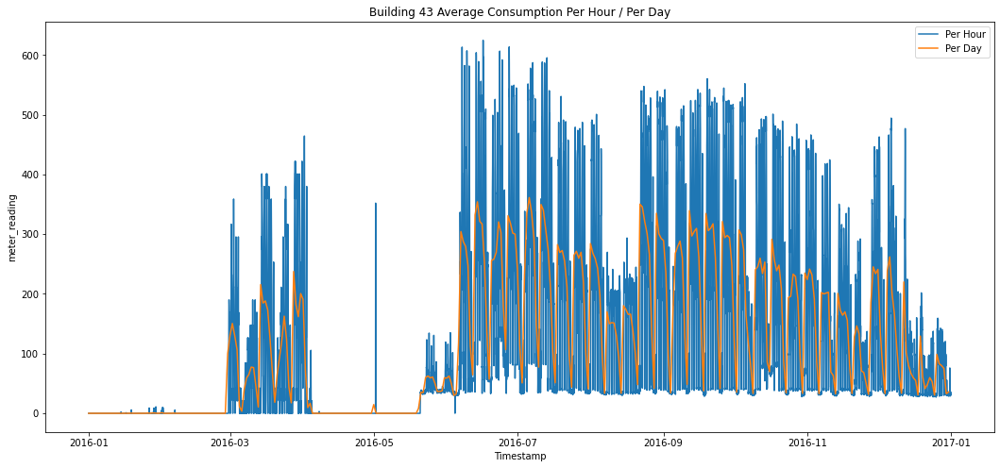

In [37]:
outlier_buildings(masked_df,outliers_retail)

Observations: 
- The majority of the outliers saw frequent spikes in meter readings, resulting in high overall usage per hour/day.
- Buildings 1099, 778 and 89 are similar to the previously aggregated line chart for education, entertainment and retail buildings, implying that they have a significant influence on the overall meter reading. 

#### Investigating GFA for these 3 outlier buildings

In [38]:
final_train_df[(final_train_df['building_id']== 1099) | (final_train_df['building_id']== 778) | (final_train_df['building_id']== 89)][['building_id', 'primary_use','square_feet']].drop_duplicates(subset='primary_use')

,building_id,primary_use,square_feet
87,89,Retail,161755
946,778,Entertainment/public assembly,108339
1533,1099,Education,332884


In [39]:
masked_df.groupby('primary_use')['square_feet'].describe()

,count,mean,std,min,25%,50%,75%,max
primary_use,,,,,,,,
Education,8165504.0,119998.782690,104900.033882,2010.0,50567.0,91254.0,157723.0,764237.0
Entertainment/public assembly,2264917.0,106256.004265,137022.610323,356.0,15715.0,53194.0,149704.0,875000.0
Retail,112657.0,41034.131106,40121.396431,283.0,15304.0,44218.0,45305.0,161755.0


Observations: 
- Retail Building 89 has a GFA of 161,755 square feet, which corresponds to the highest GFA in the retail buildings cluster, which could explain why it consumes more energy than the other ten retail buildings.

- The GFA of Education Building 1099 and Entertainment Building 778 is nowhere near the maximum GFA, and it's unlikely that they'll use so much energy with that GFA. It's possible that the meters are malfunctioning or that the results from the meters are cumulative.

#### Replot Education and Entertainment consumption without Building 1099 and 778

In [40]:
# plot time series of avearge consumption (per hour / per day) for the education and entertainment
def plot_consumption_without_outliers(df,columns):
   
    for facility in columns:
        
        plt.figure(figsize=(18,8))
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[(df['primary_use'] == facility) & (df['building_id'] != 1099) & (df['building_id'] != 778)][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[(df['primary_use'] == facility) & (df['building_id'] != 1099) & (df['building_id'] != 778)][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
        plt.title(f'{facility} Average Consumption Per Hour / Per Day')
        plt.xlabel('Timestamp')
        plt.ylabel(f'meter_reading')
    
    return

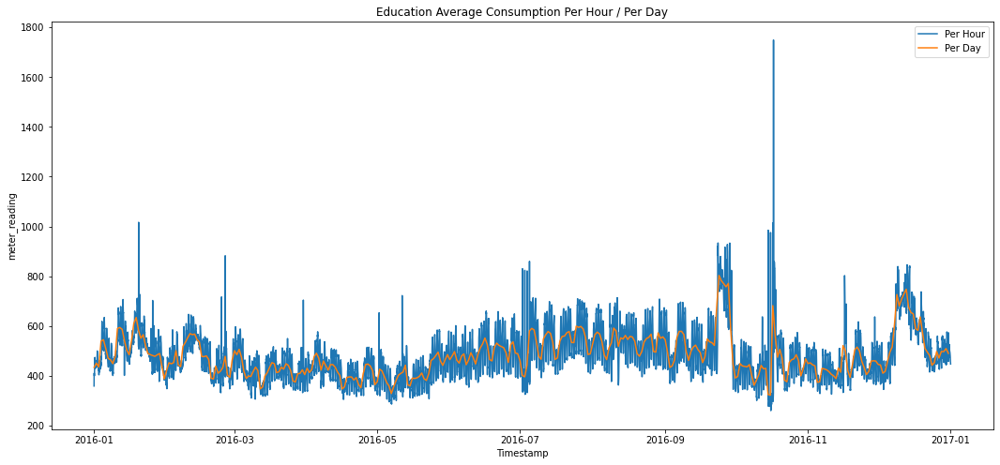

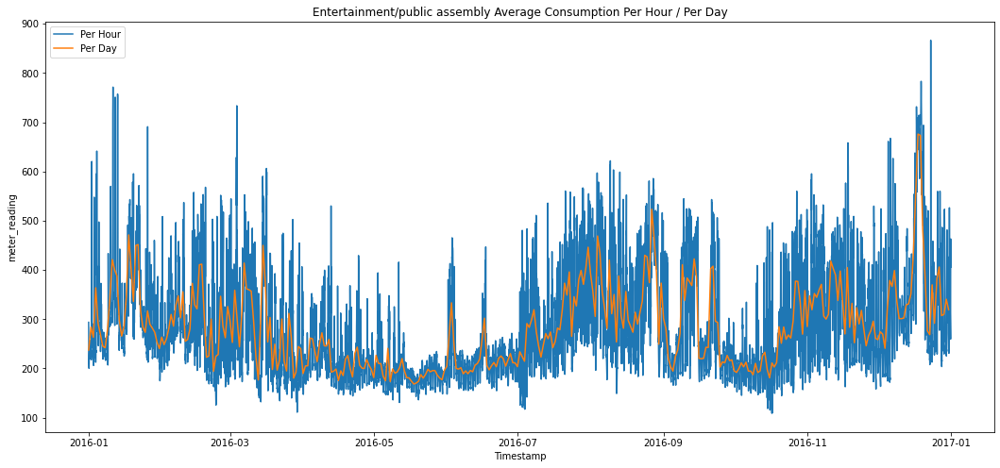

In [41]:
plot_consumption_without_outliers(masked_df, ['Education', 'Entertainment/public assembly'])

Observations: So much more consistent now without the outliers

#### Average energy consumption (kWh) usage for different sites

In [42]:
#Finding the number of buildings for each site_id and their average consumption
site_df_compare = final_train_df.groupby(by='site_id').agg({'building_id':pd.Series.nunique, 'meter_reading':'mean'}).rename(columns={'building_id':'Num_of_buildings', 'meter_reading':'avg_meter_reading'}).sort_values(by='Num_of_buildings',ascending=False)
site_df_compare

,Num_of_buildings,avg_meter_reading
site_id,,
3,274,125.919304
13,154,13612.172852
2,135,183.787949
9,124,263.069397
15,124,301.580292
0,105,549.860779
14,102,659.994019
4,91,181.087799
5,89,31.298845


In [43]:
from scipy.stats import pearsonr

corr, _ = pearsonr(site_df_compare['Num_of_buildings'], site_df_compare['avg_meter_reading'])
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.222


Observation: Relatively weak correlation between the number of buildings in each site with the average meter readings 

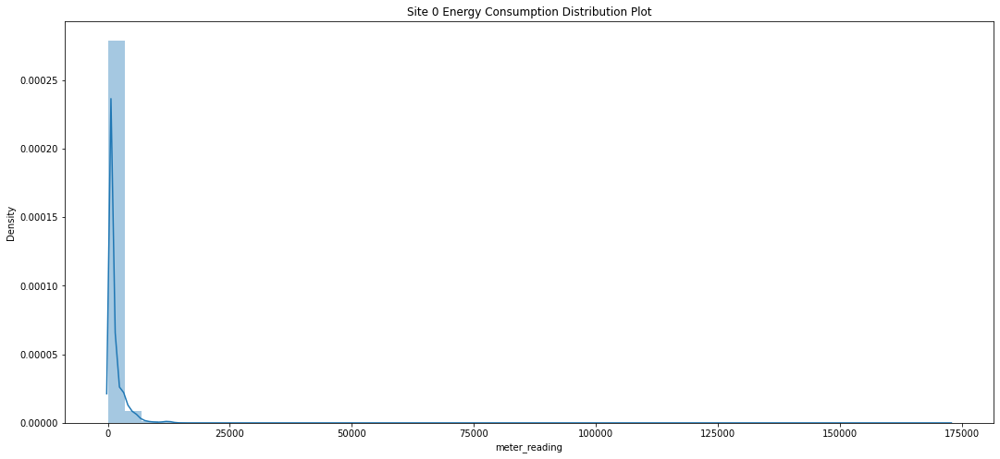

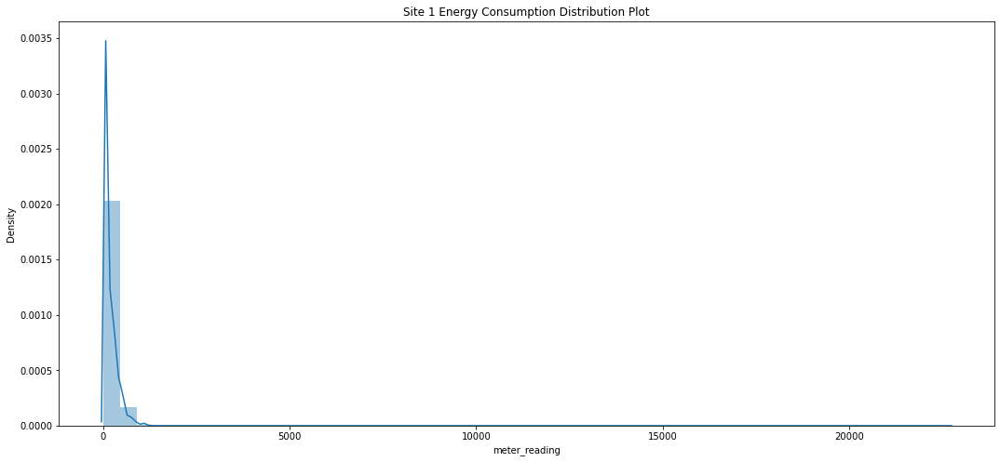

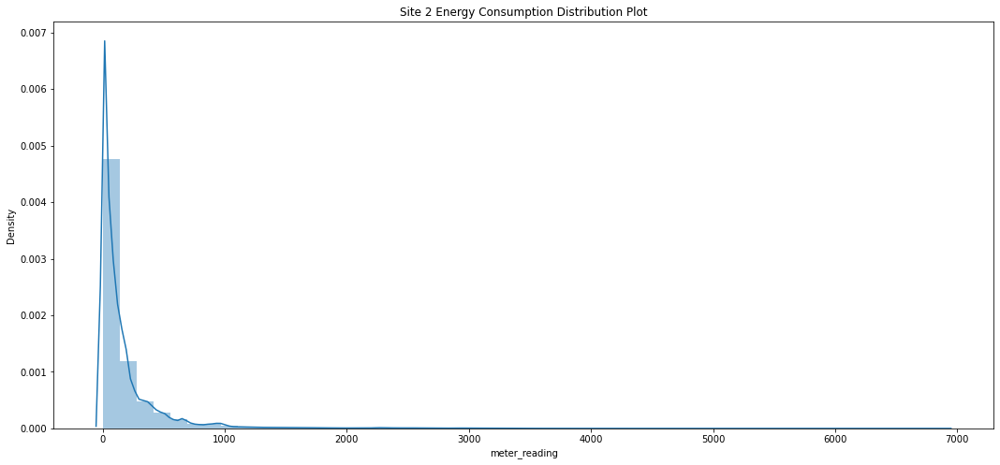

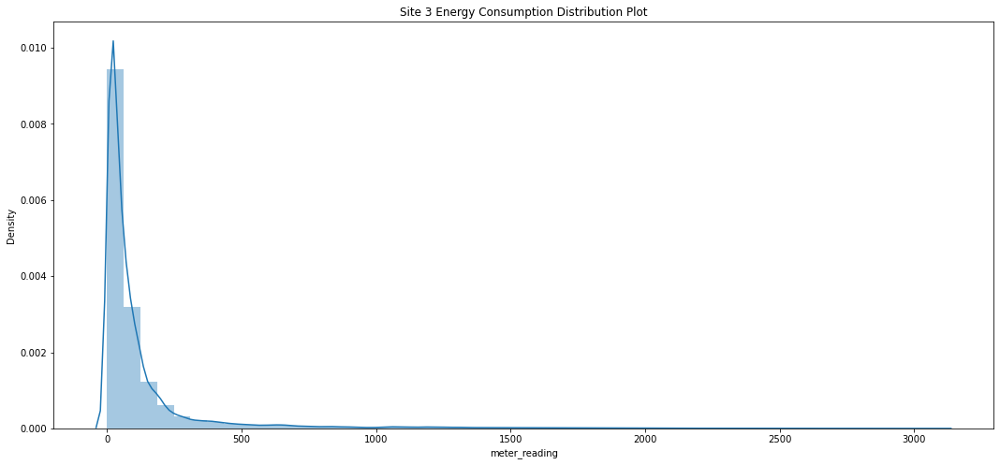

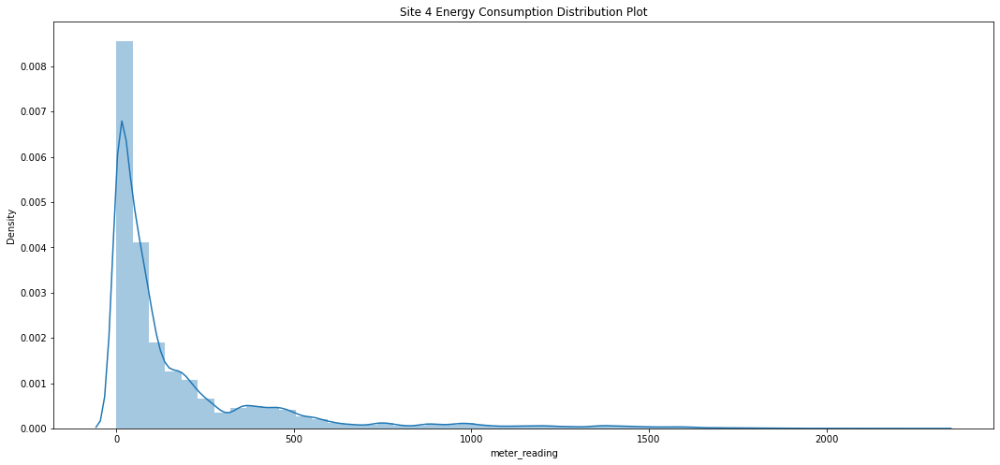

...

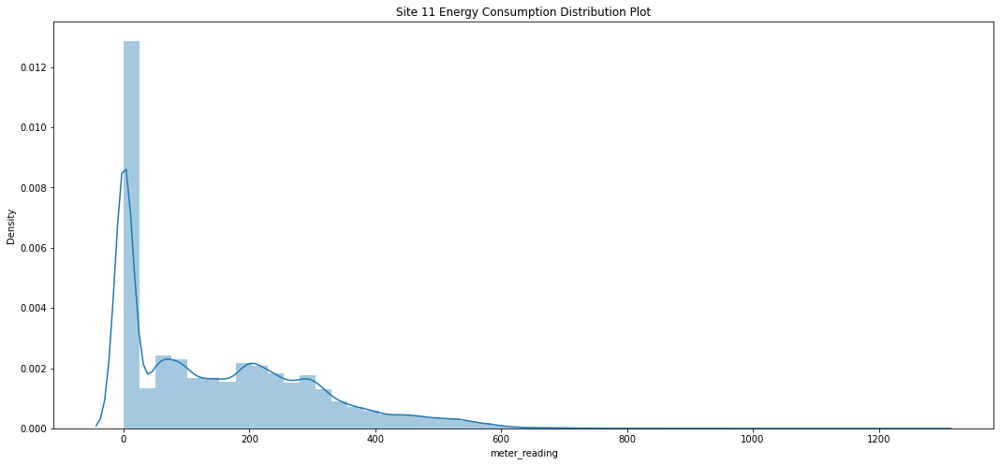

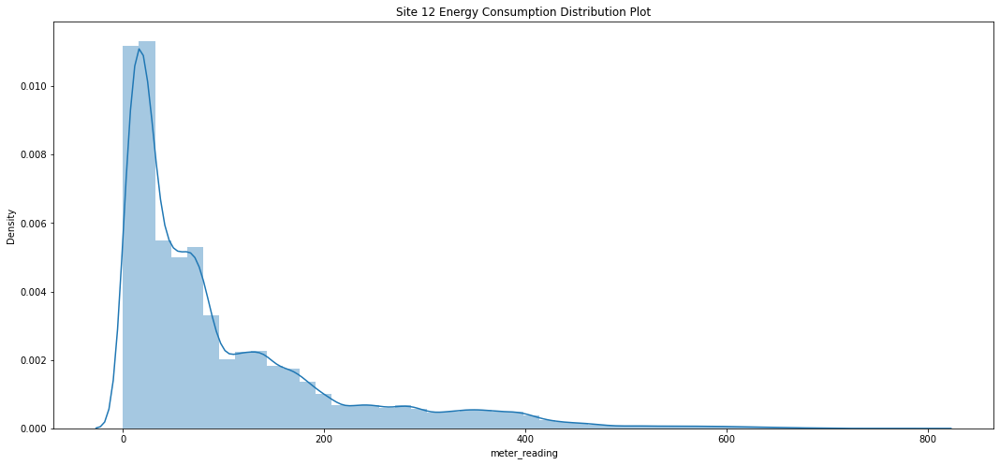

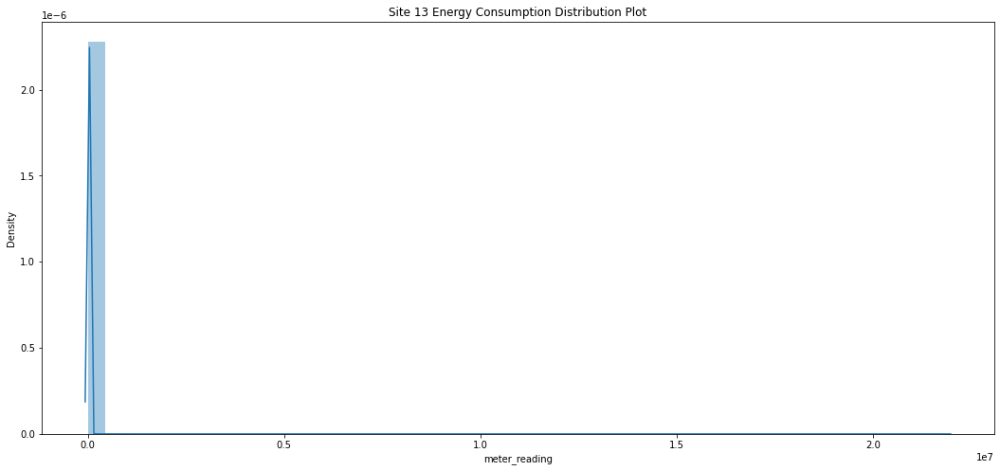

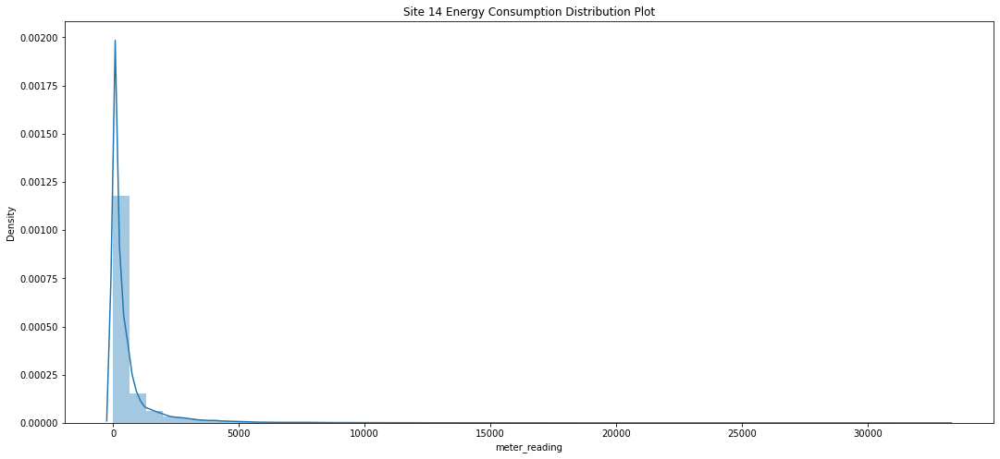

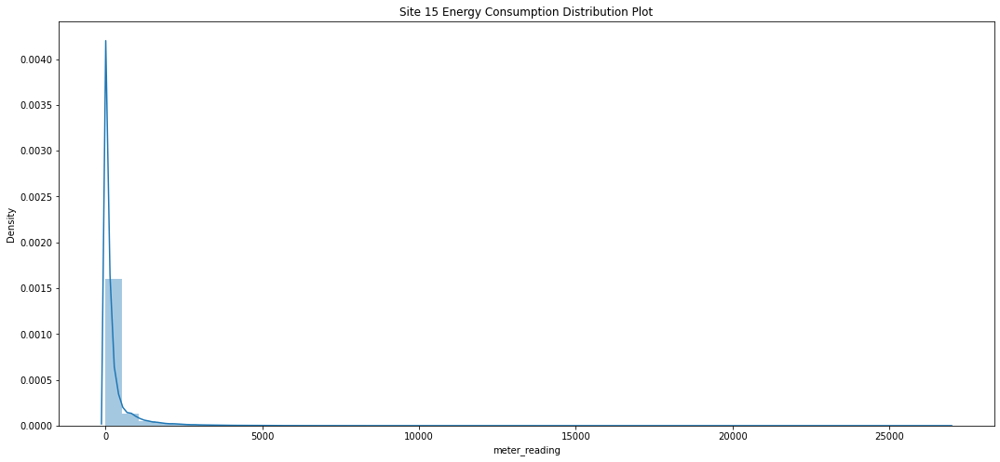

In [44]:
#let's plot the distribution for each of all the 16 sites to check for any trends
for site in range(final_train_df.site_id.nunique()):
    plt.figure(figsize=(18,8))
    plt.title(f'Site {site} Energy Consumption Distribution Plot')
    sns.distplot(final_train_df[(final_train_df['site_id']==site)]['meter_reading'])

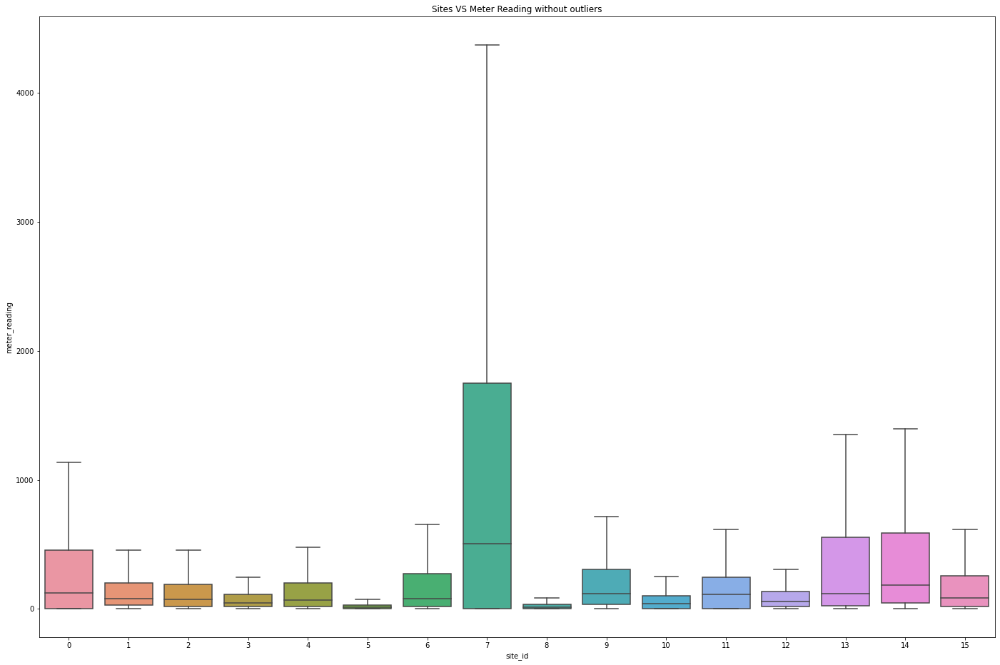

In [45]:
#box plot for all 16 sites 
plt.figure(figsize = (24,16))
sns.boxplot(x='site_id', y='meter_reading', data=final_train_df, showfliers=False).set_title("Sites VS Meter Reading without outliers");

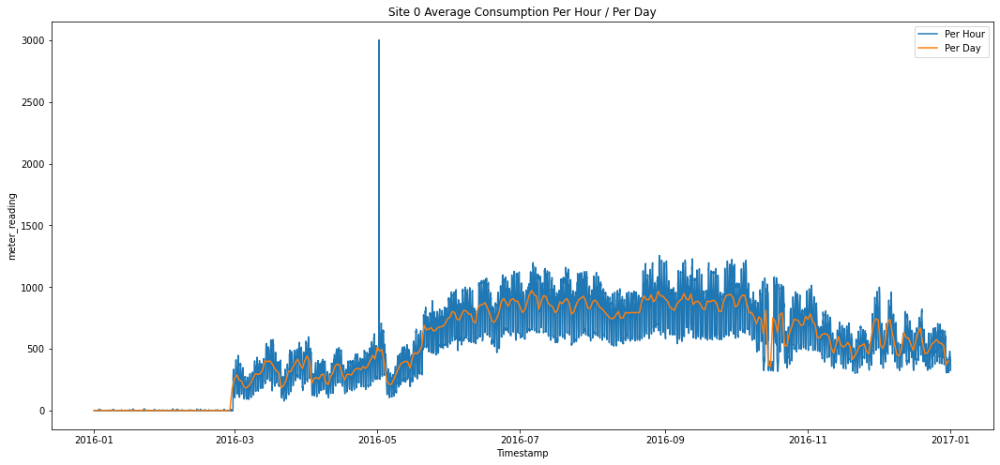

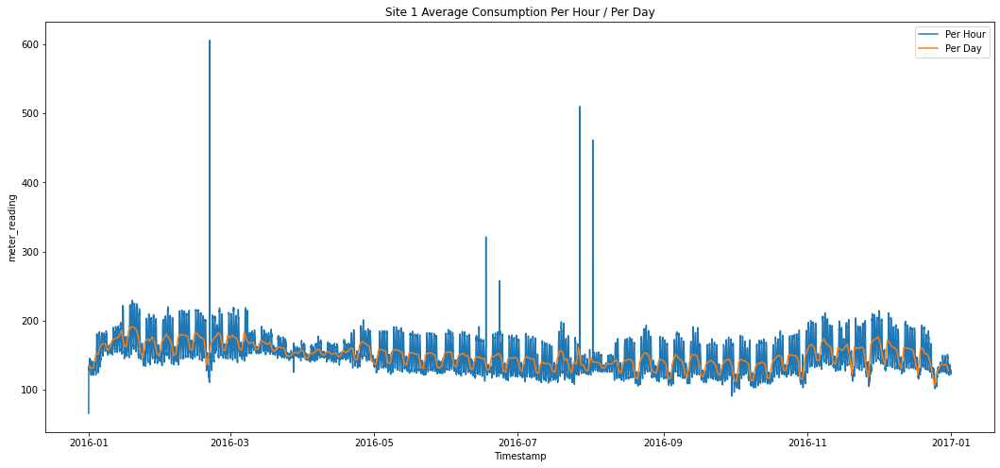

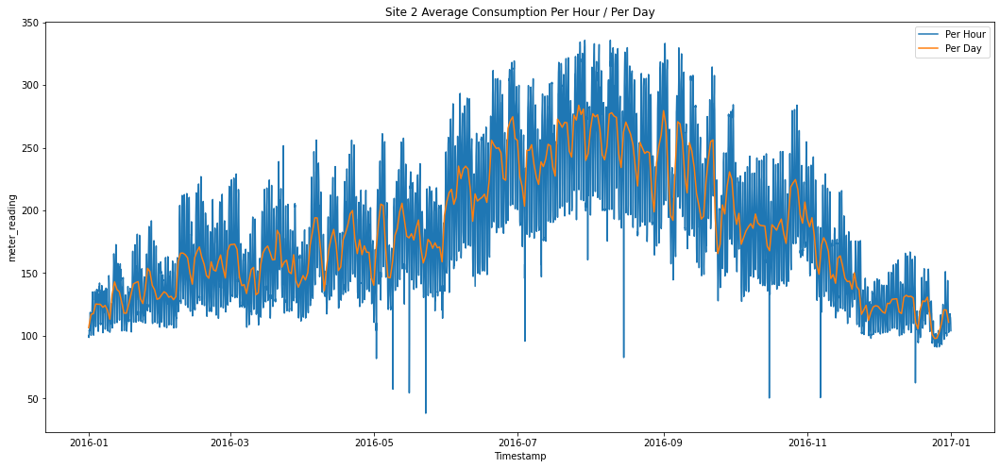

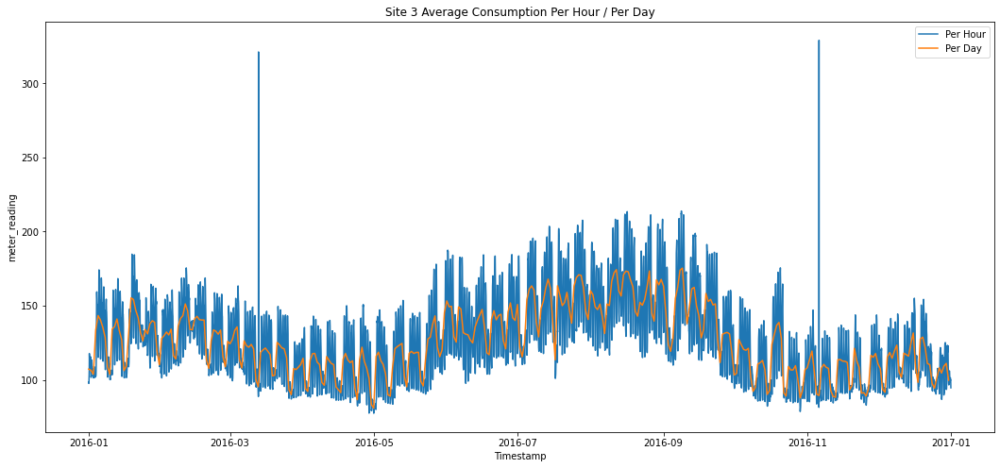

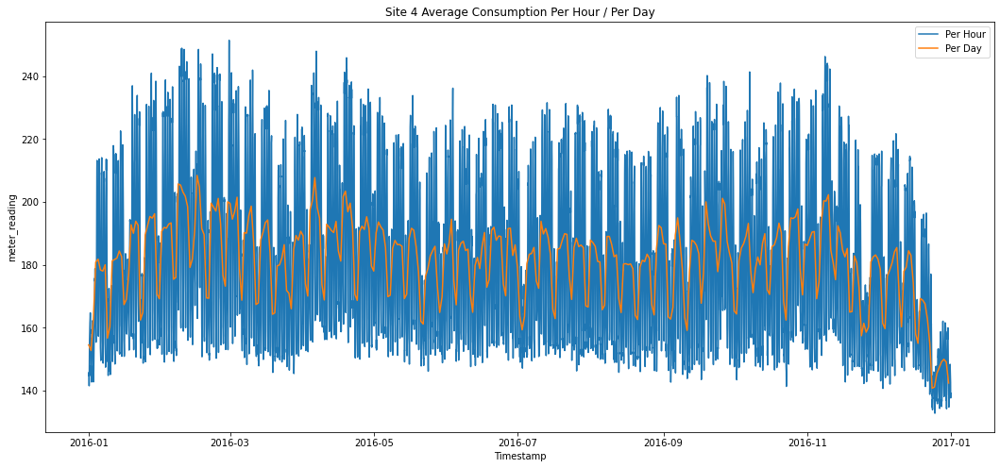

...

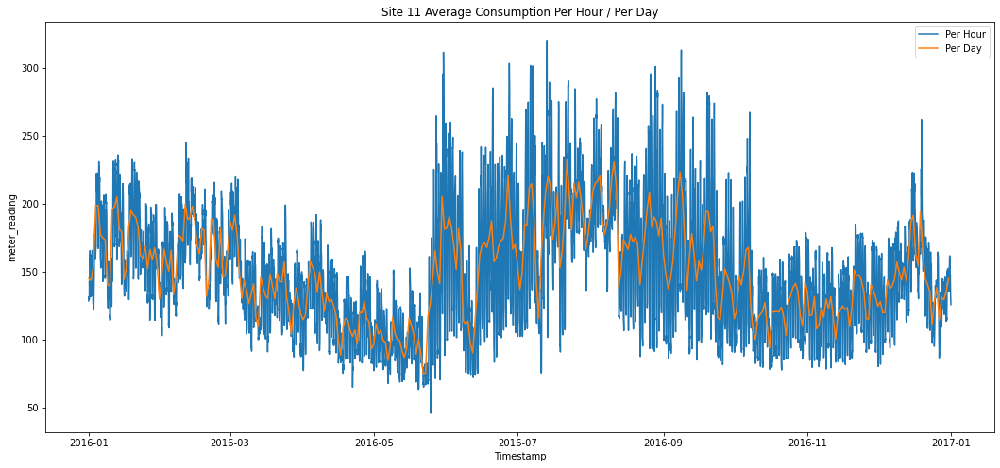

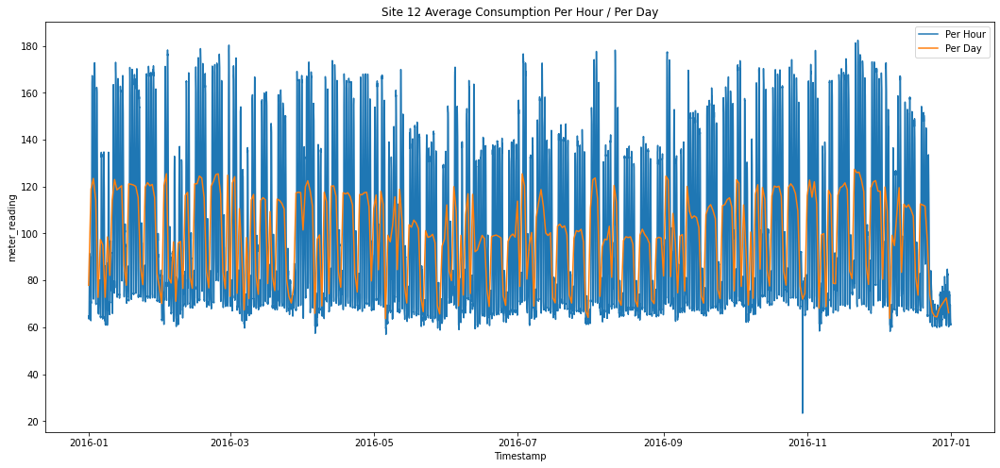

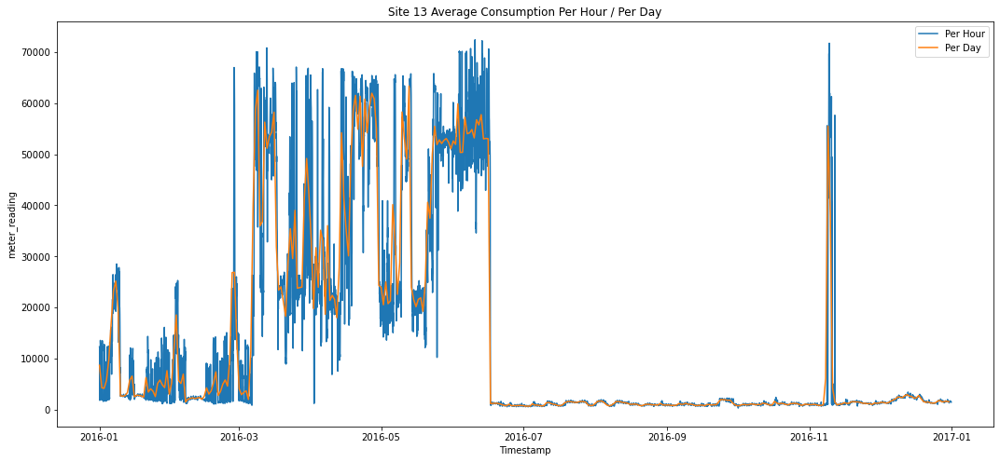

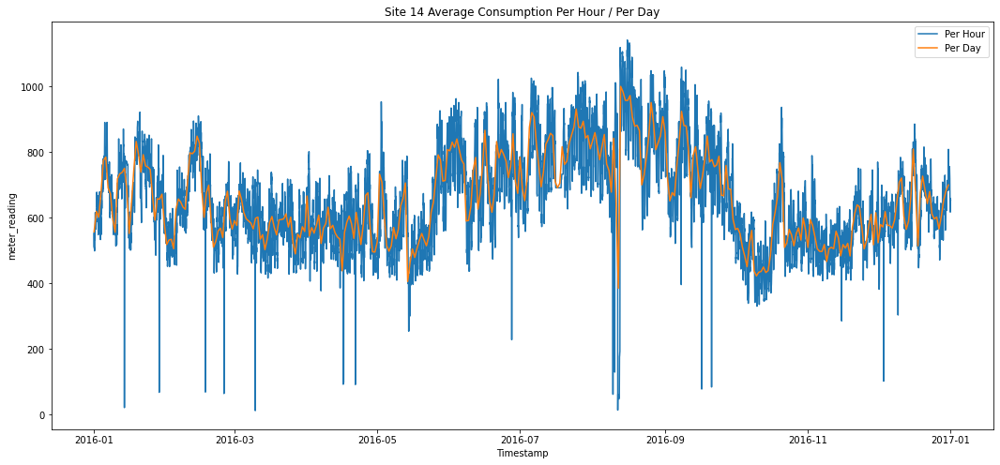

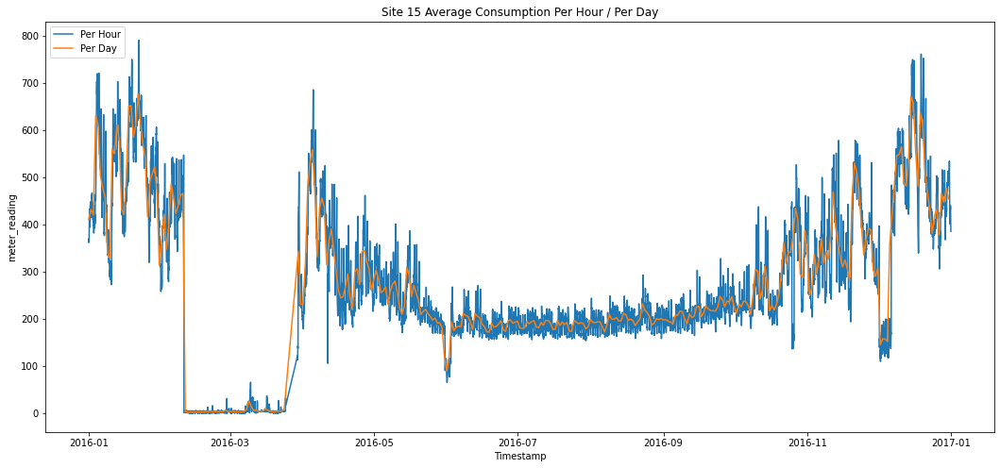

In [46]:
#plot the different comsumptions for all 16 sites
for site in range(final_train_df.site_id.nunique()):
    plt.figure(figsize=(18,8))
    sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[final_train_df['site_id'] == site][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
    sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[final_train_df['site_id'] == site][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
    plt.title(f'Site {site} Average Consumption Per Hour / Per Day')
    plt.xlabel('Timestamp')
    plt.ylabel(f'meter_reading')

In [47]:
final_train_df.groupby('site_id')['meter_reading'].describe()

,count,mean,std,min,25%,50%,75%,max
site_id,,,,,,,,
0,1076662.0,549.792175,1259.610352,0.0,0.000000,125.044998,453.561005,1.726110e+05
1,553357.0,149.531082,185.466171,0.0,30.000000,78.199997,200.600006,2.270000e+04
2,2530312.0,183.550552,344.852448,0.0,17.584299,76.050003,192.339996,6.895630e+03
3,2370097.0,125.717102,259.717773,0.0,18.500000,46.660000,110.089996,3.095440e+03
4,746746.0,181.032043,285.280701,0.0,18.000000,70.475651,201.799751,2.293880e+03
5,781776.0,31.302164,62.084557,0.0,3.800000,10.745000,31.200001,9.541000e+02
6,668133.0,990.770020,18981.078125,0.0,16.637199,81.083298,272.049988,8.803740e+05
7,366681.0,1217.426025,1682.417358,0.0,0.120000,505.160004,1749.770020,1.750210e+04
8,567915.0,65.715515,217.237244,0.0,2.833300,13.333300,36.791698,4.373170e+03


observation: Of all these sites, site 0 and 6 stood out for their inconsistency, site 13 also stood out as it looks alot like the aggregated consumption for educaiton buildings.

#### Let's explore the type of facility that influences the shape of the consumption for site 0, 6 and 13

In [48]:
site_0 = final_train_df[final_train_df['site_id'] == 0]
site_6 = final_train_df[final_train_df['site_id'] == 6]
site_13 = final_train_df[final_train_df['site_id'] == 13]

In [49]:
# plot time series of avearge consumption (per hour / per day) for the respective site
def plot_site_outliers(df):
    
    print(df.groupby('primary_use')['meter_reading'].mean())
    columns = list(df.groupby('primary_use')['meter_reading'].mean().reset_index().primary_use)
    
    for facility in columns:

        plt.figure(figsize=(18,8))
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['primary_use']==facility][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
        sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=df[df['primary_use']==facility][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
        plt.title(f'{facility} Average Consumption Per Hour / Per Day')
        plt.xlabel('Timestamp')
        plt.ylabel(f'meter_reading')
        
    return

#### Site 0 Energy Consumption by Facility Type 

primary_use
Education                        992.299194
Entertainment/public assembly    367.402985
Lodging/residential              471.382385
Office                           285.445923
Other                            455.341278
Parking                           64.959297
Retail                           208.712418
Name: meter_reading, dtype: float32


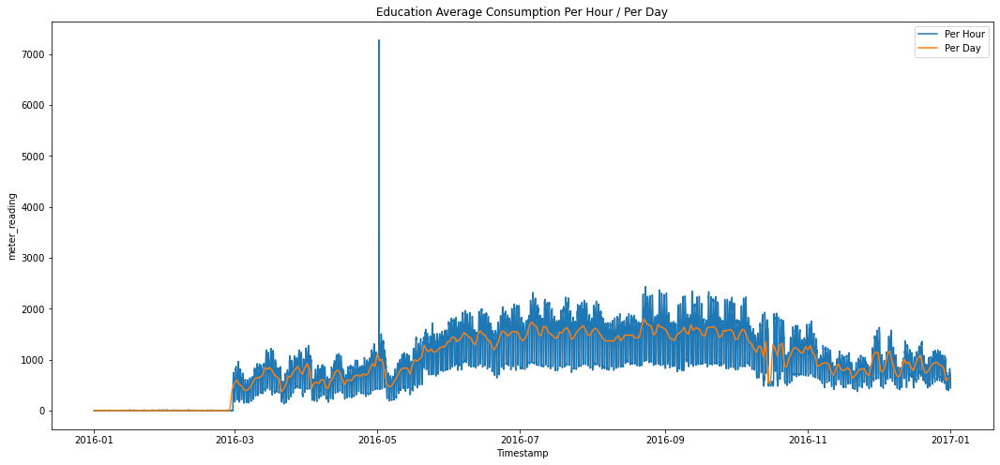

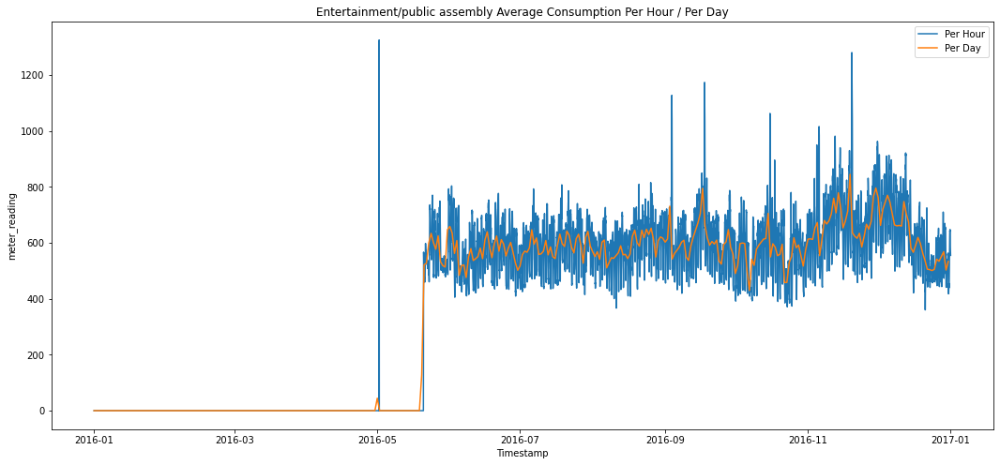

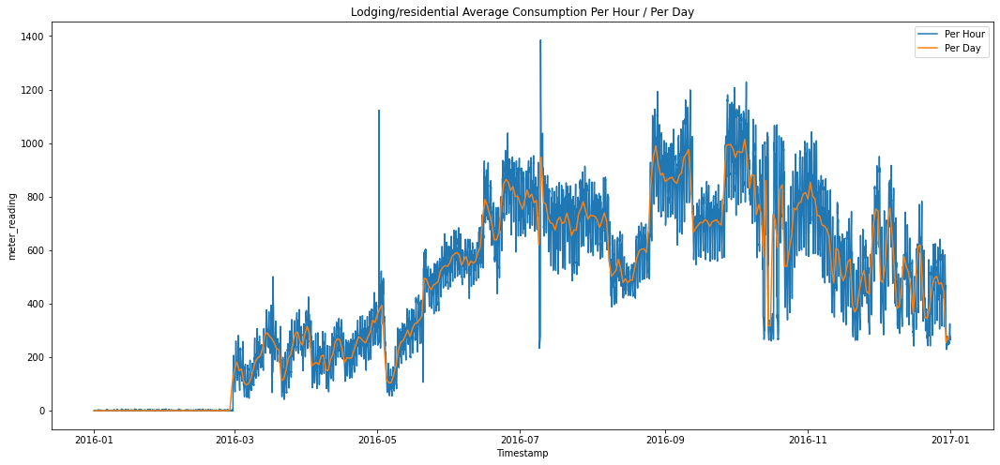

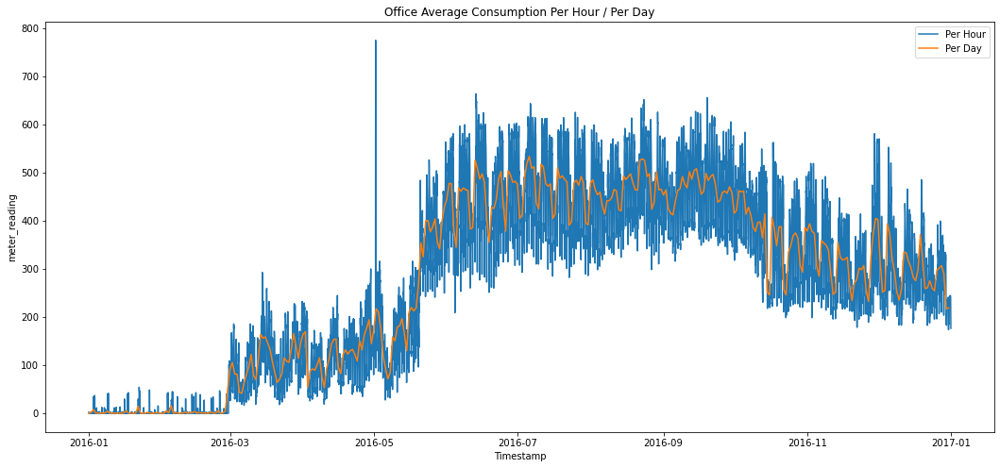

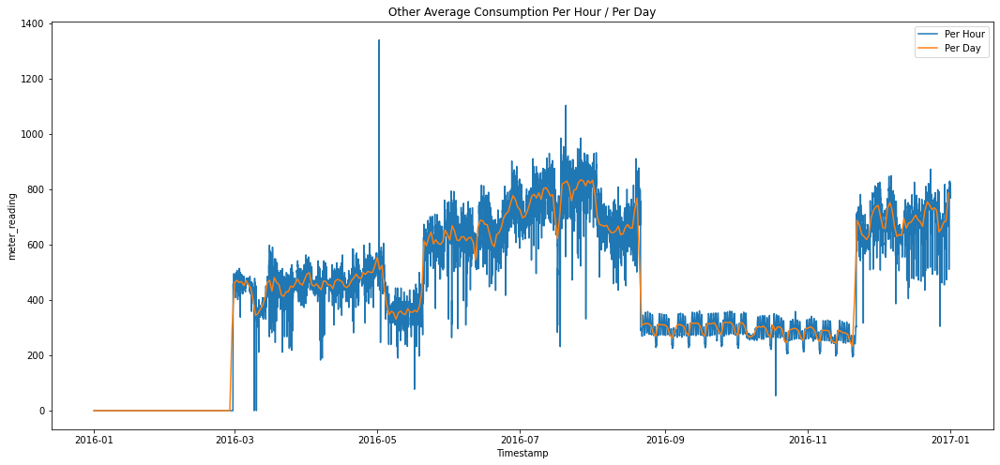

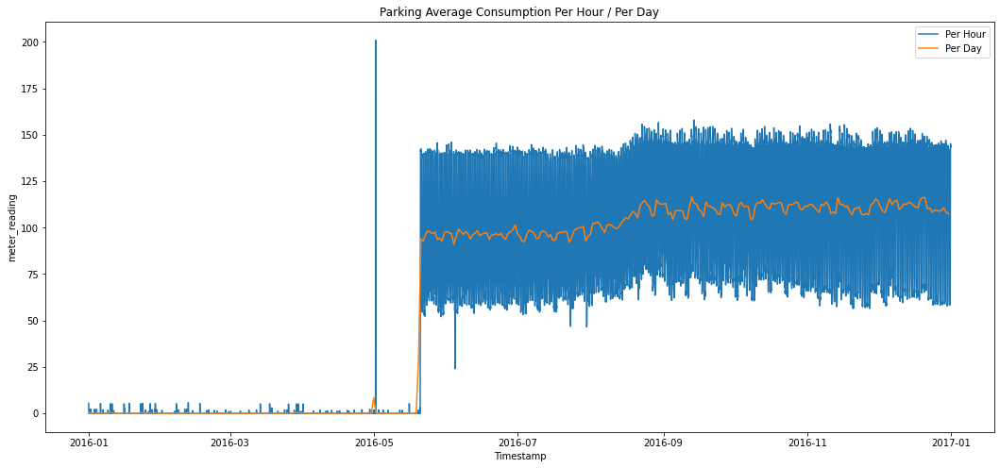

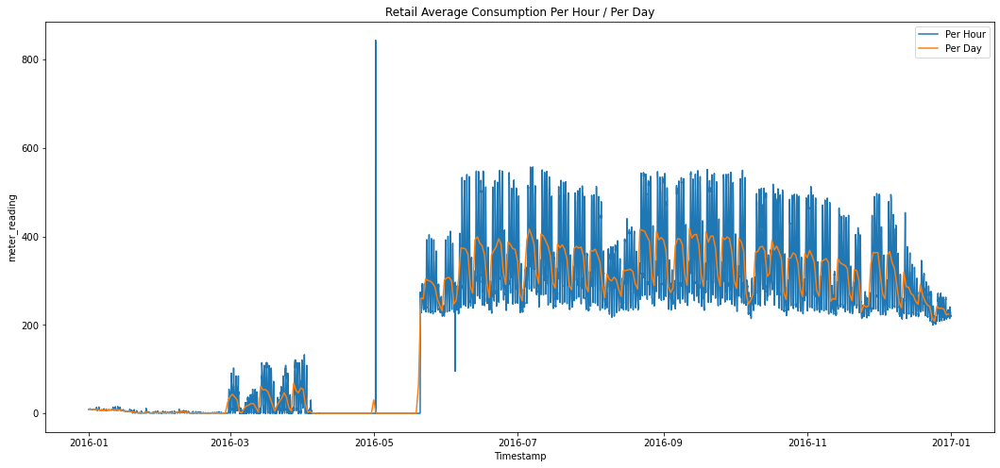

In [50]:
plot_site_outliers(site_0)

Observation: From January to March 2016, most of the facilities in site 0 had no consumption readings, indicating that the site was newly erected and under development at the time.

#### Site 6 Energy Consumption group by Facility Type 

primary_use
Education                         622.886353
Entertainment/public assembly    8259.382812
Lodging/residential               132.572006
Office                            149.923035
Public services                   260.118805
Name: meter_reading, dtype: float32


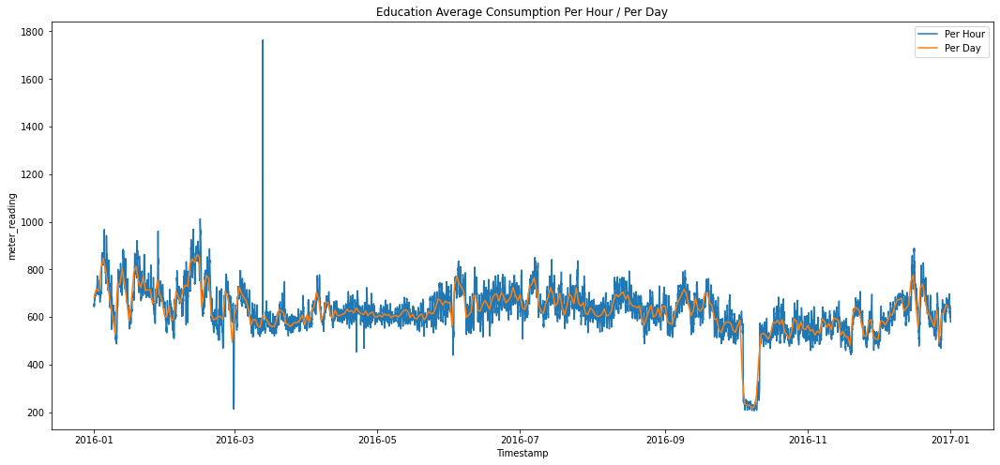

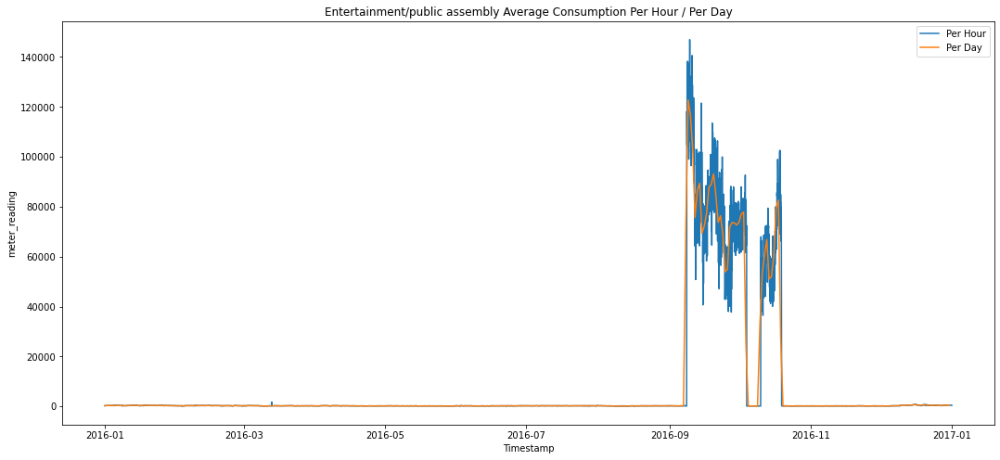

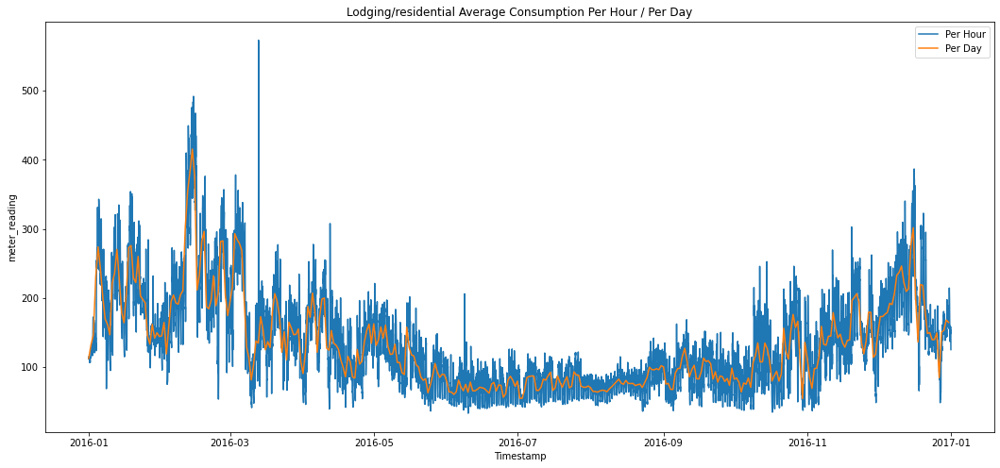

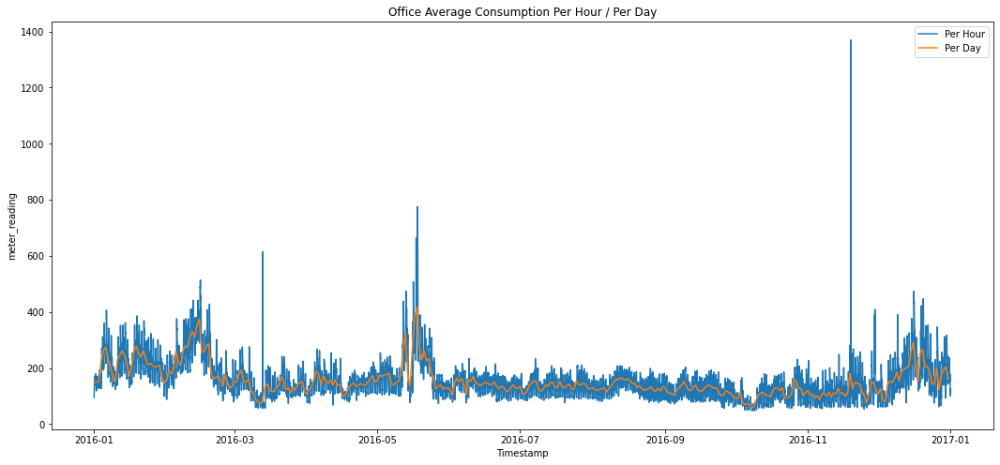

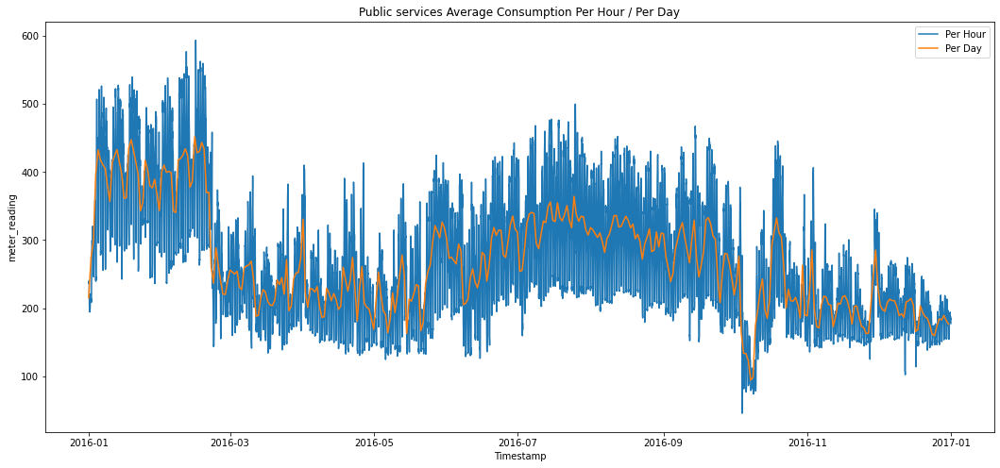

In [51]:
plot_site_outliers(site_6)

Observation: Entertainment facility in site 6 energy consumption looks alot like the outlier building_id '778' we have identified earlier.

In [52]:
site_6[site_6['building_id']==778]

,timestamp,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
946,2016-01-01 00:00:00,778,0,171.632996,6,Entertainment/public assembly,108339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3245,2016-01-01 01:00:00,778,0,170.699997,6,Entertainment/public assembly,108339,NaN,NaN,10.000000,0.0,8.898438,0.0,1020.0,0.0,0.000000
5540,2016-01-01 02:00:00,778,0,171.399994,6,Entertainment/public assembly,108339,NaN,NaN,10.000000,NaN,8.296875,0.0,NaN,50.0,3.599609
7838,2016-01-01 03:00:00,778,0,171.000000,6,Entertainment/public assembly,108339,NaN,NaN,9.398438,NaN,4.398438,0.0,1020.5,30.0,3.099609
10133,2016-01-01 04:00:00,778,0,170.649994,6,Entertainment/public assembly,108339,NaN,NaN,7.800781,2.0,3.900391,0.0,1020.5,50.0,2.099609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20209996,2016-12-31 21:00:00,778,1,0.000000,6,Entertainment/public assembly,108339,NaN,NaN,8.898438,NaN,-7.800781,0.0,1016.5,210.0,6.699219
20212361,2016-12-31 22:00:00,778,0,168.350006,6,Entertainment/public assembly,108339,NaN,NaN,7.800781,NaN,-8.296875,0.0,1016.0,210.0,7.699219
20212362,2016-12-31 22:00:00,778,1,0.000000,6,Entertainment/public assembly,108339,NaN,NaN,7.800781,NaN,-8.296875,0.0,1016.0,210.0,7.699219
20214727,2016-12-31 23:00:00,778,0,168.600006,6,Entertainment/public assembly,108339,NaN,NaN,7.199219,NaN,-7.199219,0.0,1016.0,200.0,6.699219


Observation: Building_id '778' is indeed in site_id '6', hence the high influence in the energy consumption for that site. 

#### Site 6 and 13 Energy Consumption Groupby Facility Type without Outliers (Building 778/1099) 

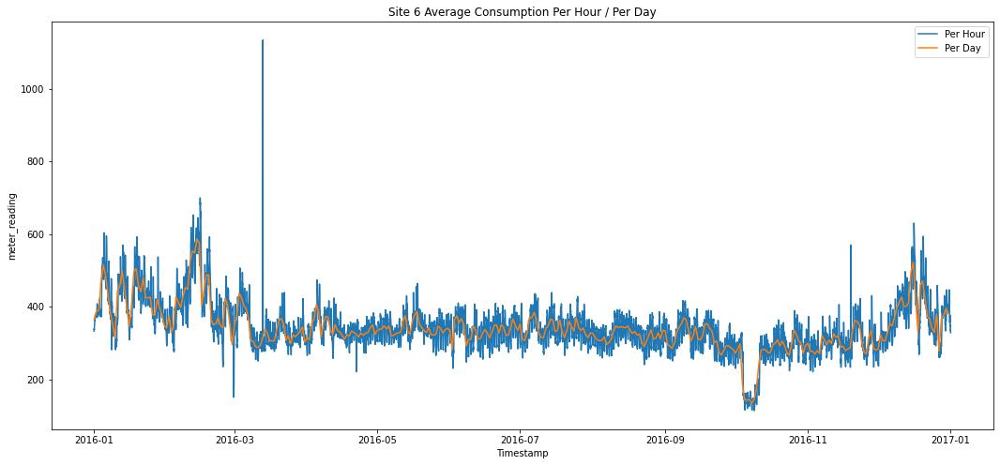

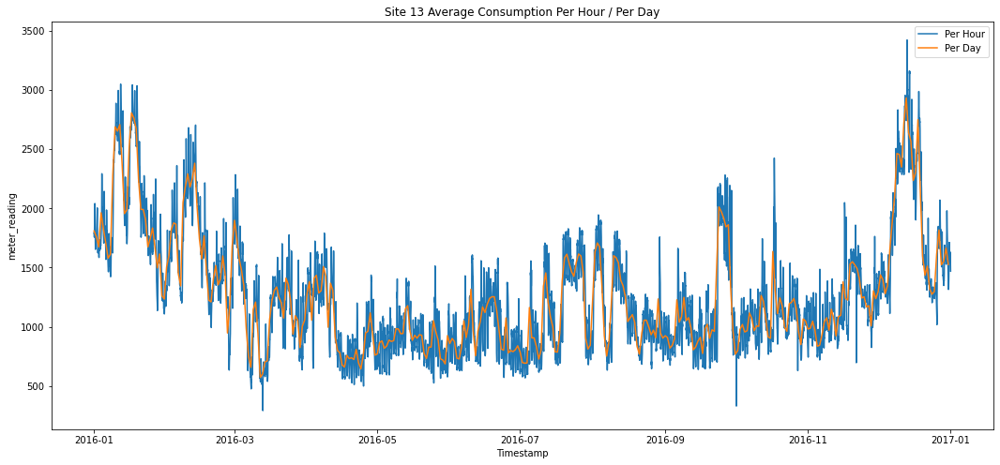

In [53]:
# plot time series of avearge consumption (per hour / per day) for site 0 and 13 without outliers 
ls = [6,13] 
for site in ls:
    plt.figure(figsize=(18,8))
    sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[(final_train_df['site_id'] == site) & (final_train_df['building_id'] != 778) & (final_train_df['building_id'] != 1099)][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
    sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[(final_train_df['site_id'] == site) & (final_train_df['building_id'] != 778) & (final_train_df['building_id'] != 1099)][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
    plt.title(f'Site {site} Average Consumption Per Hour / Per Day')
    plt.xlabel('Timestamp')
    plt.ylabel(f'meter_reading')

Observation: Without the outliers (Building 778 / Building 1099), the energy consumption for sites 6 and 13 appears to be more consistent.

#### Average energy consumption (kWh) usage for meter types

In [54]:
# From kaggle, there are 3 meter types {0: electricity, 1: chilledwater, 2: steam, 3: hotwater}. Not every building has all meter types.
final_train_df.groupby('meter')['meter_reading'].describe()

,count,mean,std,min,25%,50%,75%,max
meter,,,,,,,,
0,12060910.0,167.133789,371.017456,0.0,19.5000,62.831900,170.074997,79769.0
1,4182440.0,630.223145,7981.263672,0.0,11.3288,120.487000,464.313995,880374.0
2,2708713.0,13725.946289,418120.062500,0.0,45.7500,257.812012,1035.319946,21904700.0
3,1264037.0,385.561462,2505.033936,0.0,0.0000,39.623699,241.285004,160187.0


Observation: Of all the meter types, meter 2 (steam energy usage) seems to have the largest consumption record. Let's explore the outliers identified earlier -> Building 1099 and 778 and check which meters registered the highest consumption.
    

In [55]:
final_train_df[final_train_df['building_id']==1099].groupby('meter')['meter_reading'].describe()

,count,mean,std,min,25%,50%,75%,max
meter,,,,,,,,
0,8782.0,5.755680e+02,2.189862e+02,162.925003,402.250504,520.839478,7.303788e+02,1.420830e+03
2,8784.0,3.813982e+06,6.282386e+06,144.000000,1608.000000,7008.000000,6.340610e+06,2.190470e+07


In [56]:
final_train_df[final_train_df['building_id']==778].groupby('meter')['meter_reading'].describe()

,count,mean,std,min,25%,50%,75%,max
meter,,,,,,,,
0,8775.0,242.083130,75.054337,0.0,166.675003,224.75,315.483505,406.950012
1,8085.0,54209.863281,163960.156250,0.0,0.000000,0.00,0.000000,880374.000000


Observation: The biggest consumption is recorded by meter 2 (steam energy usage) in Building 1099, while the largest consumption is recorded by meter 1 (chilled water usage) in Building 778. Both buildings heavily infuence the overall energy meter readings.

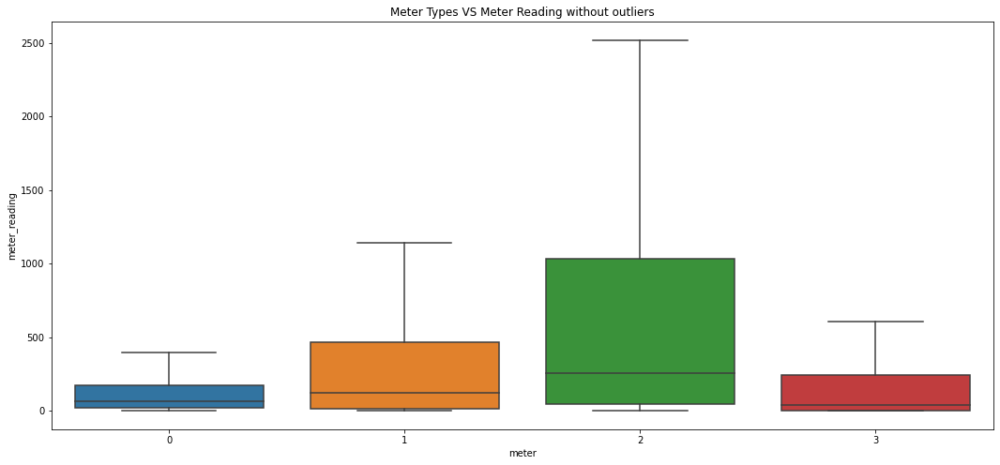

In [57]:
#box plot for all 4 meters type without outliers; meter type 2 used to measure steam energy usage seems to have the highest variance
plt.figure(figsize = (18,8))
sns.boxplot(x='meter', y='meter_reading', data=final_train_df, showfliers=False).set_title("Meter Types VS Meter Reading without outliers");

#### Replot overall energy consumption without Building 1099 and 778

Text(0, 0.5, 'meter_reading')

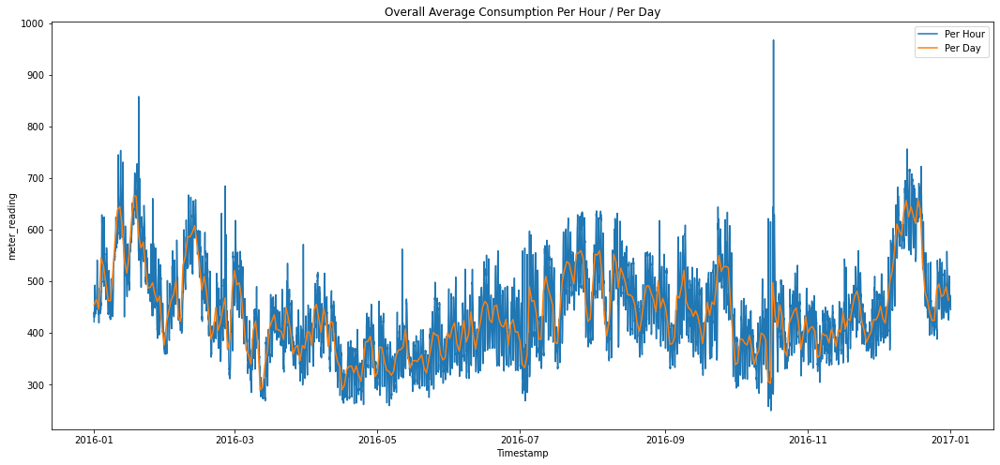

In [58]:
# plot time series of avearge consumption (per hour / per day) 
plt.figure(figsize=(18,8))
sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[(final_train_df['building_id']!=1099) & (final_train_df['building_id']!=778)][['timestamp', 'meter_reading']].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = "Per Hour")
sns.lineplot(x = 'timestamp',y = 'meter_reading', palette= 'Spectral', data=final_train_df[(final_train_df['building_id']!=1099) & (final_train_df['building_id']!=778)][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Per Day")
plt.title(f'Overall Average Consumption Per Hour / Per Day')
plt.xlabel('Timestamp')
plt.ylabel(f'meter_reading')

Observation: Overall consumption looks more consistent across the timeframe without the 2 outliers

#### Number of observations in train and test datasets

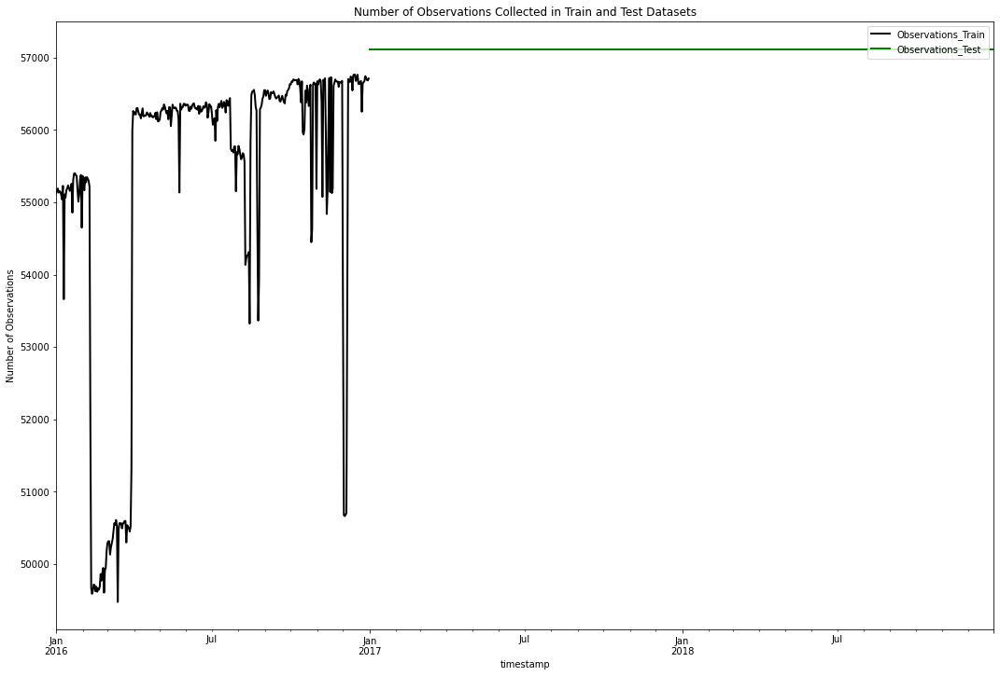

In [59]:
fig, ax1 = plt.subplots(figsize=(18,12))
final_train_df.set_index('timestamp').resample('D').count()['building_id'].plot(color="k", linewidth=2,ax=ax1, title = 'Number of Observations Collected in Train and Test Datasets', label='Observations_Train')
final_test_df.set_index('timestamp').resample('D').count()['building_id'].plot(color="g", linewidth=2,ax=ax1, label='Observations_Test')
plt.ylabel('Number of Observations')
plt.legend(loc = "upper right")

Observation: The number of records in our train dataset is inconsistent, while test dataset is fairly consistent. Let's double-check that the normalized observations for the various features (facilities/site id/meter type) investigated in the train dataset are well represented in our test dataset.

In [60]:
# Let's define a function to count the number of observations in our train and test datasets for various facility, site id and meter types

def count_observations(df_train, df_test, cols):

    for col in cols:
        
        df1 = df_train.groupby(col)['meter_reading'].mean().reset_index().rename(columns={'primary_use':'index', 'site_id':'index', 'meter':'index'})
        df2 = df_train[col].value_counts(normalize=True).reset_index().rename(columns={'primary_use':'training_observations', 'meter':'training_observations', 'site_id':'training_observations'})
        df3 = df_test[col].value_counts(normalize=True).reset_index().rename(columns={'primary_use':'testing_observations', 'meter':'testing_observations', 'site_id':'testing_observations'})
        merged_df = df1.merge(df2,on='index').merge(df3,on='index')
        merged_df.set_index('index',inplace=True)
        
        # plot visualizations
        fig, ax1 = plt.subplots(figsize=(18,12))

        merged_df[['training_observations','testing_observations']].plot(kind='bar', title = f'Normalized Number of Observation for various {col}', ax= ax1)
        plt.legend(loc = "upper right")
        plt.ylabel('Normalized Number of Observations (%)')
        plt.xlabel(col)
        plt.ticklabel_format(style='plain', useOffset=False, axis='y')

        ax2 = ax1.twinx()
        merged_df['meter_reading'].plot(color="k", linewidth=2,secondary_y=True, ax=ax2)
        plt.legend(loc = "upper left")
        plt.ylabel('Mean Meter Reading')
        ax2.tick_params(axis='x', labelrotation=90)
        plt.show();
        
    return

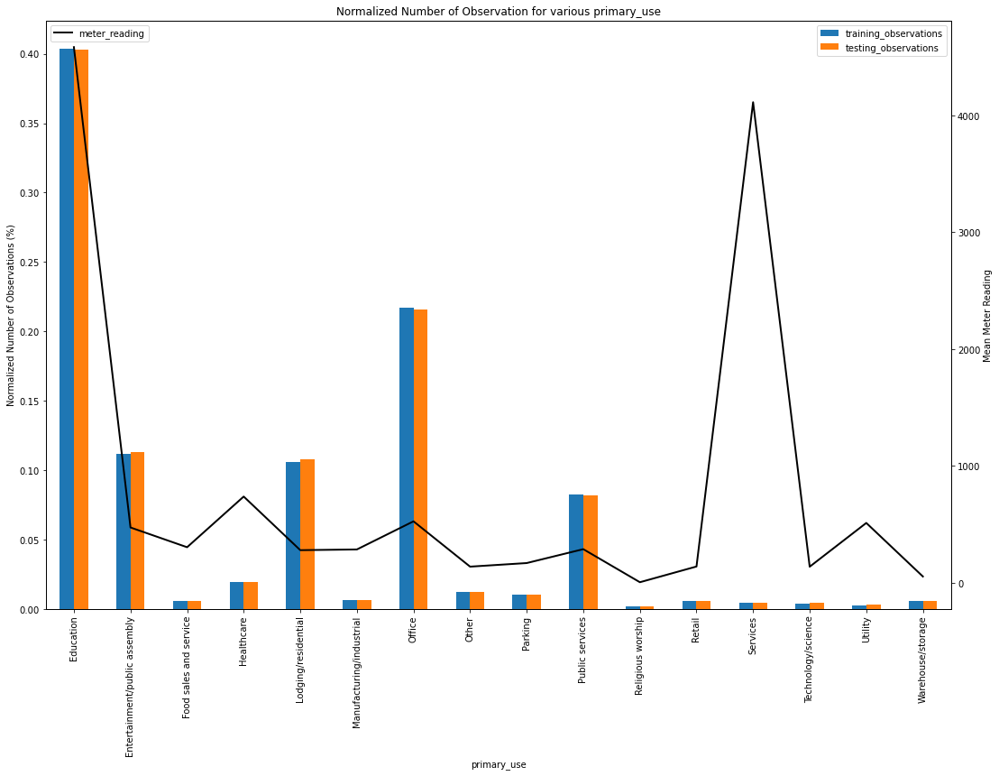

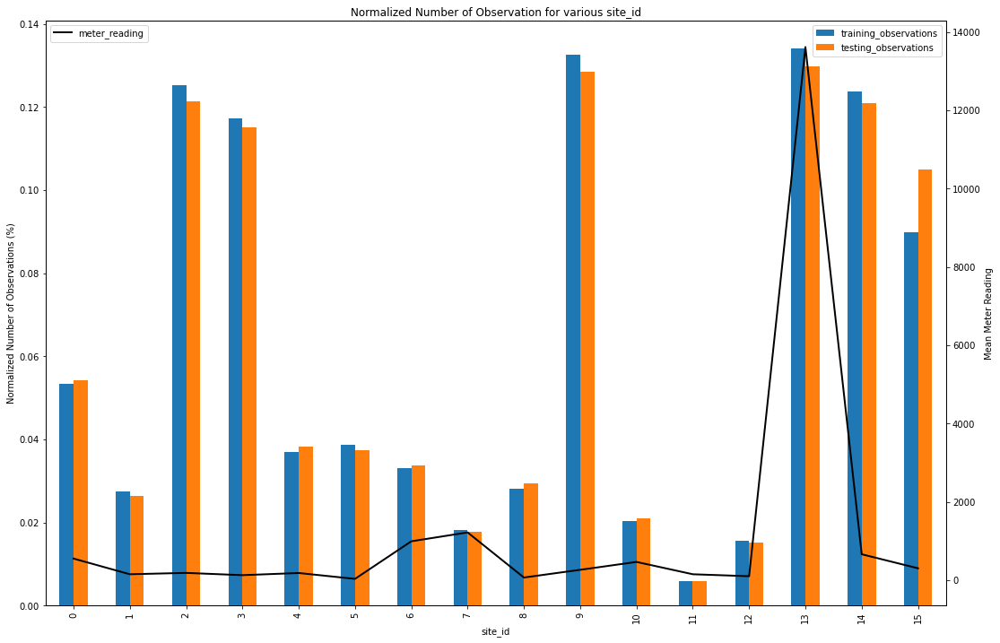

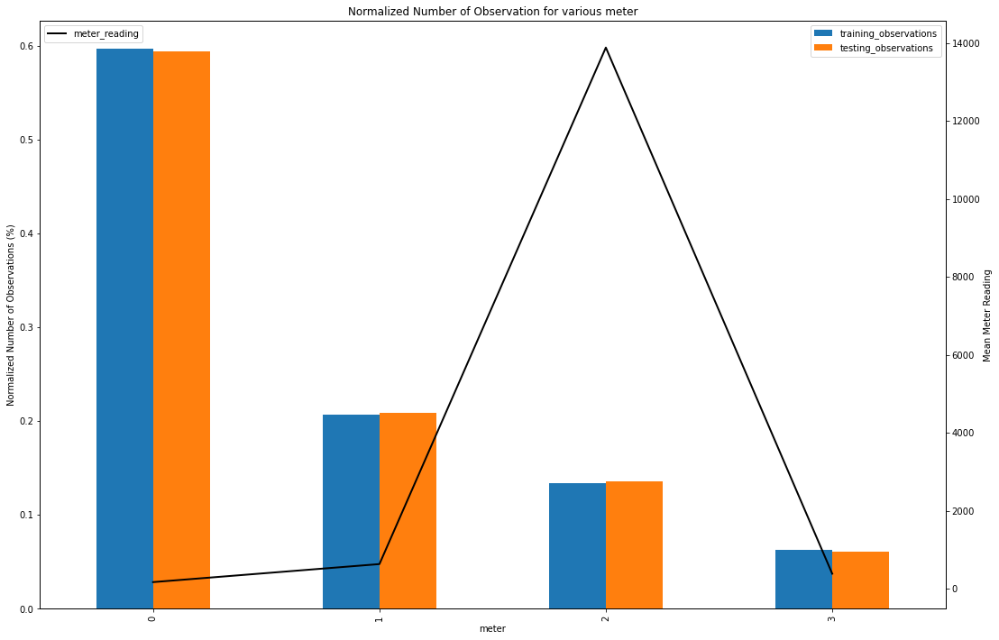

In [61]:
count_observations(final_train_df,final_test_df,['primary_use','site_id','meter'])

Observations: 

- There are nearly the same number of normalized observations in the testing dataset VS training dataset, indicating that the variance for the various features is well-represented.

- Education and facilities has the highest energy consumptions, as seen in the previous EDA phases. When aggregated by site, site 13 spends the most energy (due to building 1099), and meter 2 consumes the most energy when grouped by meter type (also because of building 1099).

In [62]:
# Let's define another function to count the number of observations in our train and test datasets for built year and floor count

def count_observations_modified(df_train, df_test, cols):

    for col in cols:
        
        df1 = df_train.groupby(col)['meter_reading'].mean().reset_index().rename(columns={'year_built':'index', 'floor_count':'index'})
        df2 = df_train[col].value_counts(normalize=True).reset_index().rename(columns={'year_built':'training_observations', 'floor_count':'training_observations'})
        df3 = df_test[col].value_counts(normalize=True).reset_index().rename(columns={'year_built':'testing_observations', 'floor_count':'testing_observations'})
        merged_df = df1.merge(df2,on='index').merge(df3,on='index')
        merged_df.set_index('index',inplace=True)
        
        # plot visualizations
        fig, ax1 = plt.subplots(figsize=(18,12))

        merged_df[['training_observations','testing_observations']].plot(kind='line', title = f'Number of Observation for various {col}', ax= ax1)
        plt.legend(loc = "upper right")
        plt.ylabel('Number of Observations')
        plt.xlabel(col)
        plt.ticklabel_format(style='plain', useOffset=False, axis='y')
        plt.ticklabel_format(style='plain', useOffset=False, axis='x')

        ax2 = ax1.twinx()
        merged_df['meter_reading'].plot(color="k", linewidth=2,secondary_y=True, ax=ax2)
        plt.legend(loc = "upper left")
        plt.ylabel('Mean Meter Reading')
        ax2.tick_params(axis='x', labelrotation=90)
        plt.show();
        
    return

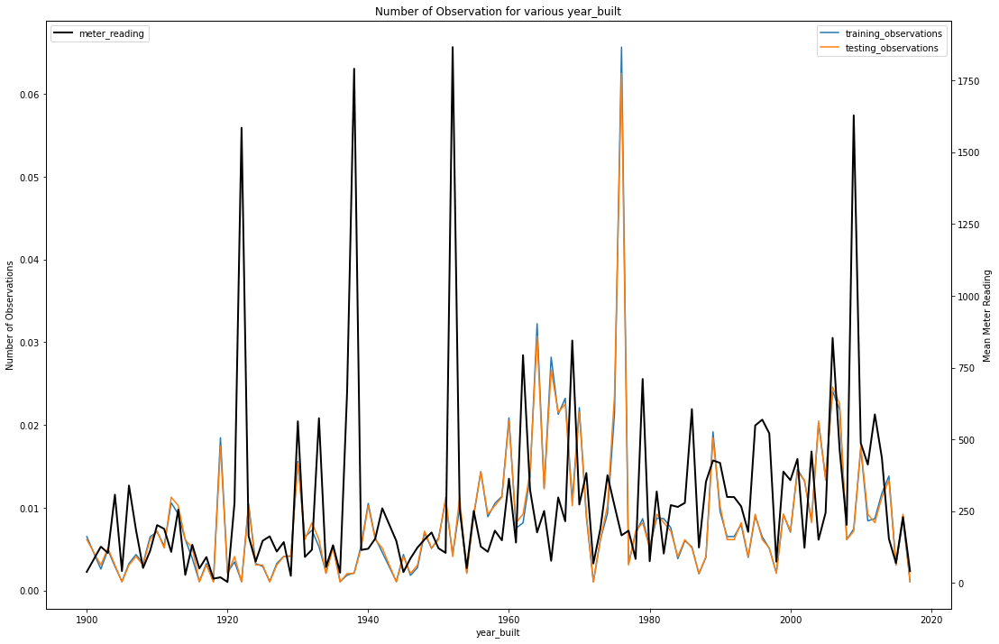

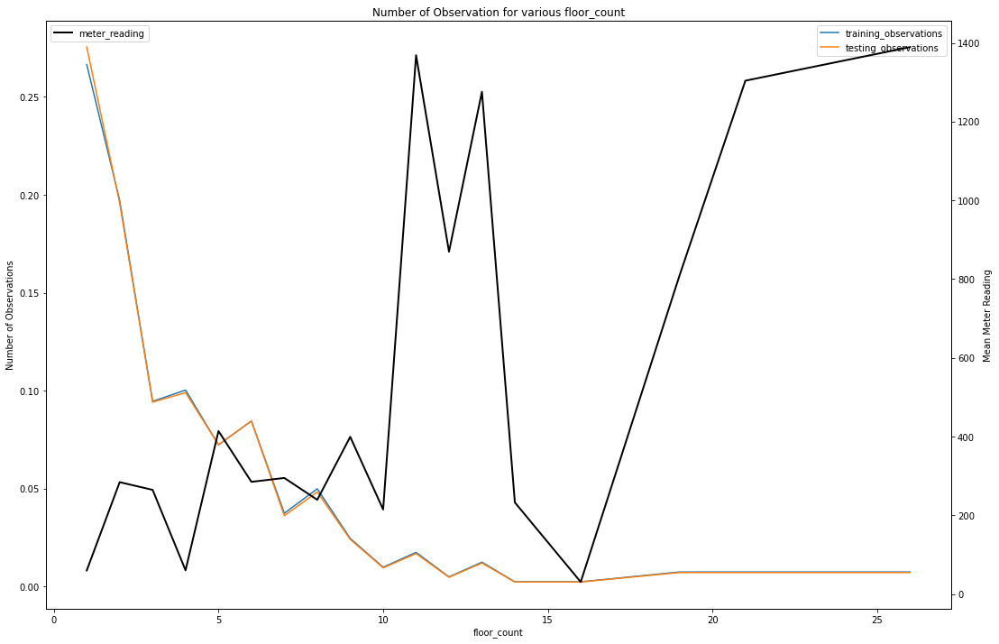

In [63]:
count_observations_modified(final_train_df,final_test_df,['year_built', 'floor_count'])

Observation: Not surprisingly, the number of normalized observations for training and testing datasets for floor_count and built_year are similar since they are from the same sample of buildings. There is not much trend in energy consumption VS year built, however, energy consumption generally is higher for buildings with more floors. Most buildings have <5 number of floors and are built before 1980. However, we must also note that these 2 parameters have the most number of NaNs (year_built has 59.99% of the data as NaNs, while floor_count has 82.65% of the data), as such this might affect the average meter readings.

#### Seaonality: Feature Engineering Months, Weeks, Days and Hours for our Train and Test Datasets 

In [64]:
# we will also like to investigate the number of observations for the different months/weeks/days/hours for both train and test datasets and observe for any energy consumption trend.
final_train_df['year'] = final_train_df['timestamp'].dt.year
final_train_df['month'] = final_train_df['timestamp'].dt.month
final_train_df['week'] = final_train_df['timestamp'].dt.isocalendar().week
final_train_df['day'] = final_train_df['timestamp'].dt.day
final_train_df['hour'] = final_train_df['timestamp'].dt.hour

In [65]:
final_test_df['year'] = final_test_df['timestamp'].dt.year
final_test_df['month'] = final_test_df['timestamp'].dt.month
final_test_df['week'] = final_test_df['timestamp'].dt.isocalendar().week
final_test_df['day'] = final_test_df['timestamp'].dt.day
final_test_df['hour'] = final_test_df['timestamp'].dt.hour

In [66]:
# Let's define a function to count the number of observations in our train and test datasets for different months/weeks/days/hours

def count_seasonality_observations(df_train, df_test, cols):

    for col in cols:
        
        df1 = df_train.groupby(col)['meter_reading'].mean().reset_index().rename(columns={'hour':'index', 'month':'index', 'week':'index', 'day':'index'})
        df2 = df_train[col].value_counts(normalize=True).reset_index().rename(columns={'hour':'training_observations', 'month':'training_observations', 'week':'training_observations', 'day':'training_observations'})
        df3 = df_test[col].value_counts(normalize=True).reset_index().rename(columns={'hour':'testing_observations', 'month':'testing_observations', 'week':'testing_observations', 'day':'testing_observations'})
        merged_df = df1.merge(df2,on='index').merge(df3,on='index')
        merged_df.set_index('index',inplace=True)
        
        # plot visualizations
        fig, ax1 = plt.subplots(figsize=(18,12))

        merged_df[['training_observations','testing_observations']].plot(kind='bar', title = f'Normalized Number of Observation for various {col}', ax= ax1)
        plt.legend(loc = "upper right")
        plt.ylabel('Normalized Number of Observations (%)')
        plt.xlabel(col)
        plt.ticklabel_format(style='plain', useOffset=False, axis='y')

        ax2 = ax1.twinx()
        merged_df['meter_reading'].plot(color="k", linewidth=2,secondary_y=True, ax=ax2)
        plt.legend(loc = "upper left")
        plt.ylabel('Mean Meter Reading')
        ax2.tick_params(axis='x', labelrotation=90)
        plt.show();
        
    return

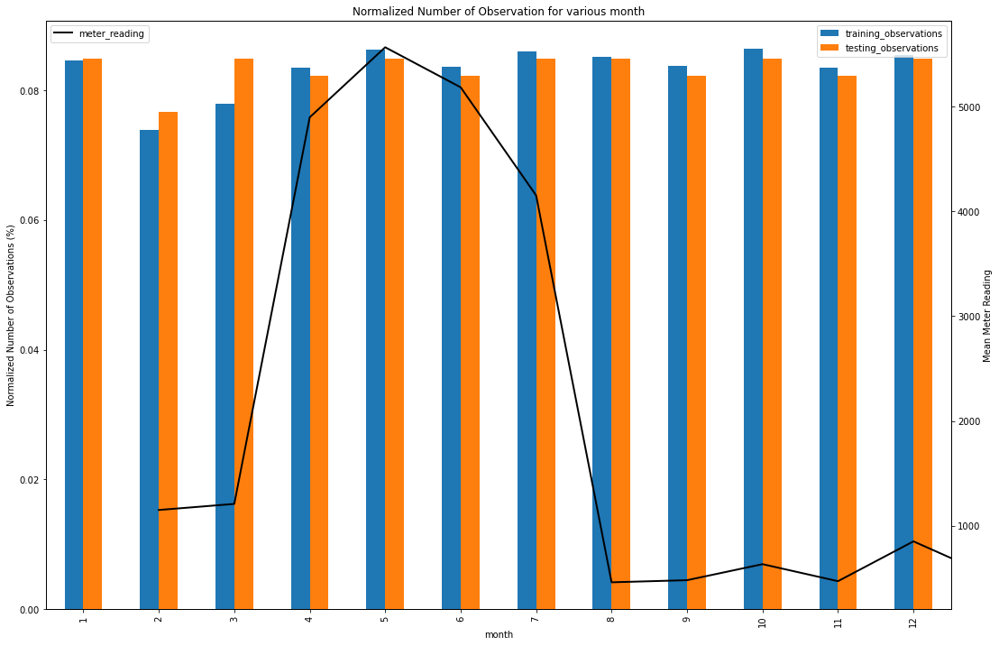

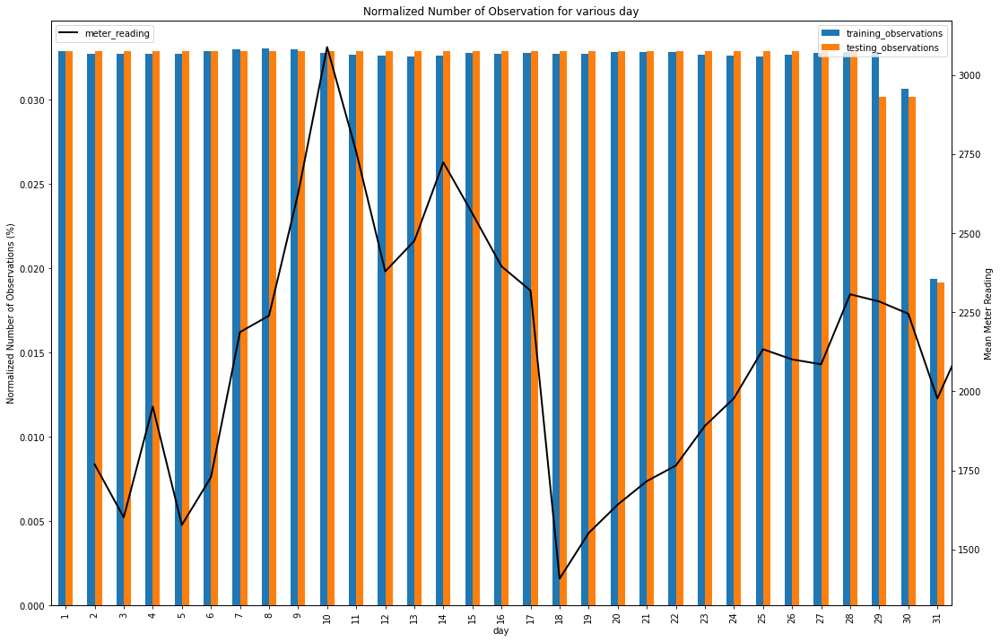

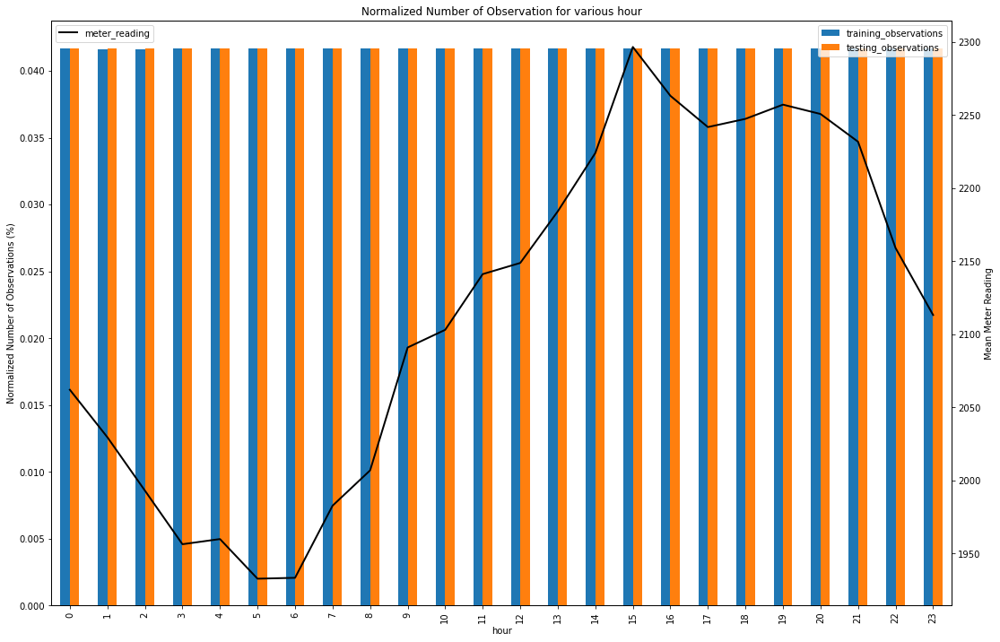

In [67]:
count_seasonality_observations(final_train_df,final_test_df,['month', 'day', 'hour'])

Observations: Both train and datasets have consistent number of normalized observations for the different month/day/hour. There are several interesting tendencies; energy use rises as we approach April, then falls sharply in August. Majority of energy use also occurs during the day, gradually increasing from 06:00 to 15:00 before gradually reducing.

#### Data Exploration for Weather Parameters

Since weather can be classified as geospatial data, we can expect 16 sites (assumed to be clustered in different locations around the globe) to have some differences in weather records. Let's start off by exploring the average readings of the different weather parameters across the train and test timeframes.

In [68]:
weather_ls = ['air_temperature', 'cloud_coverage', 'dew_temperature',
       'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction',
       'wind_speed']

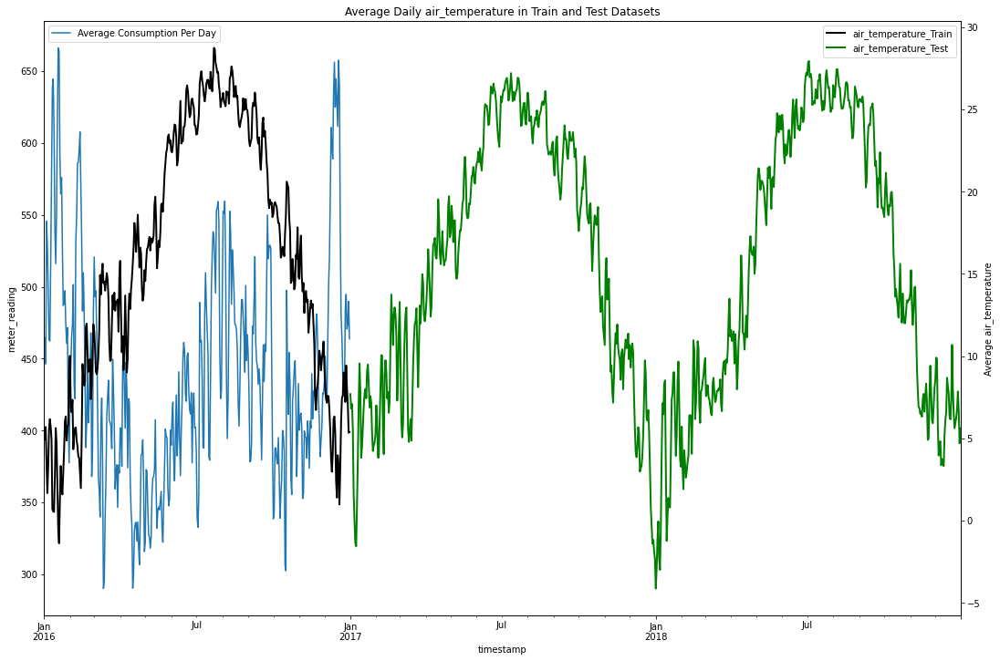

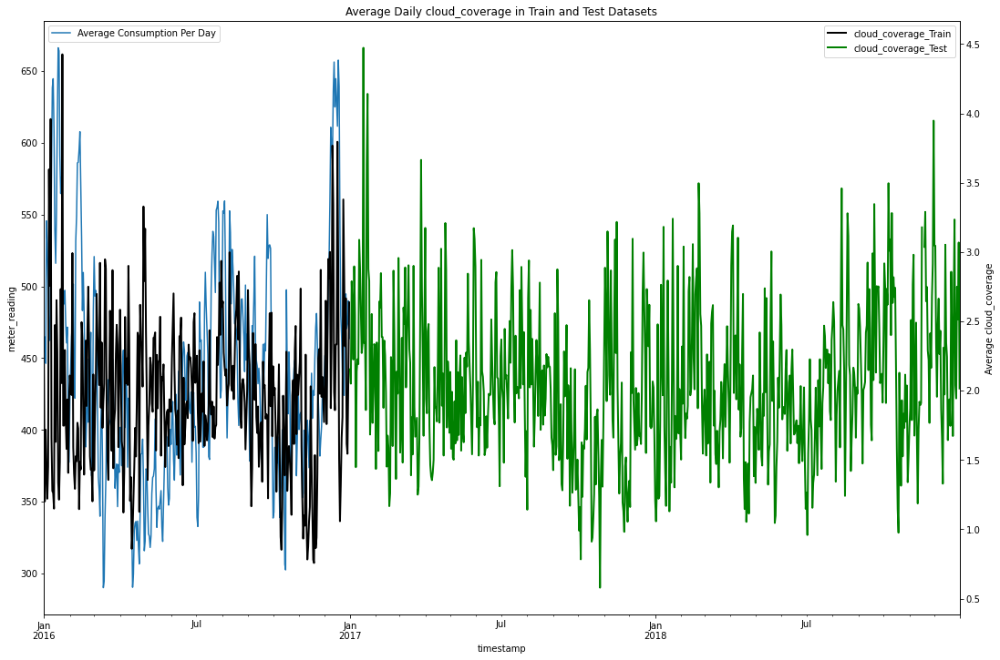

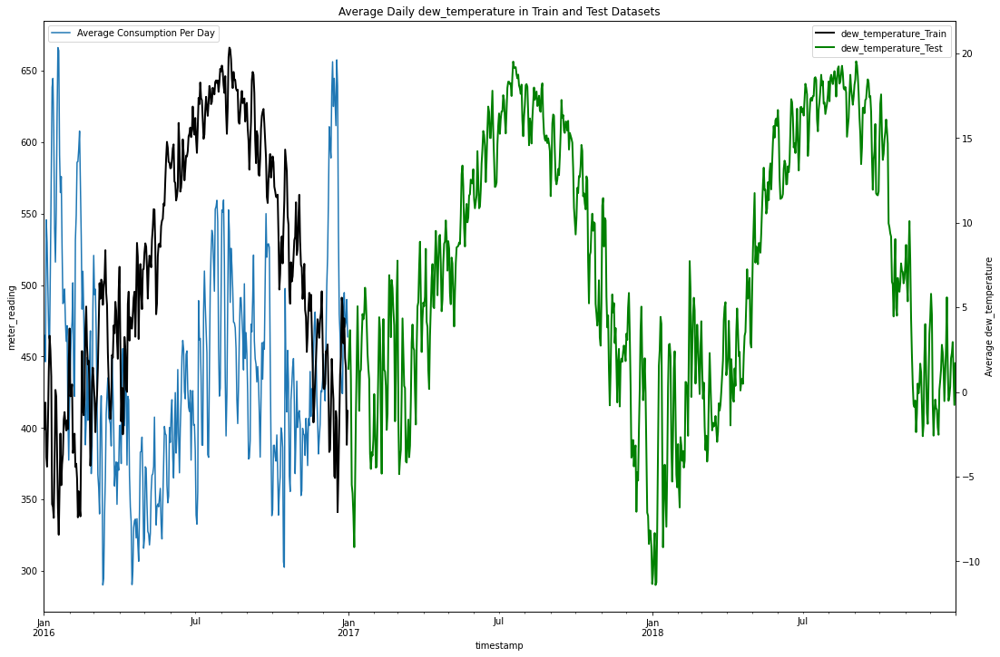

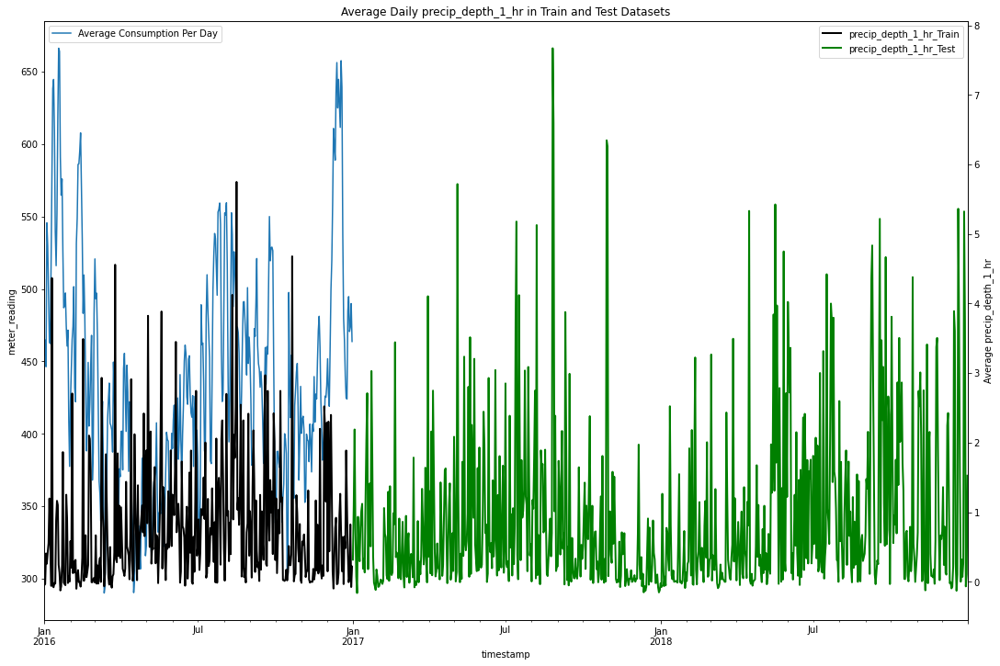

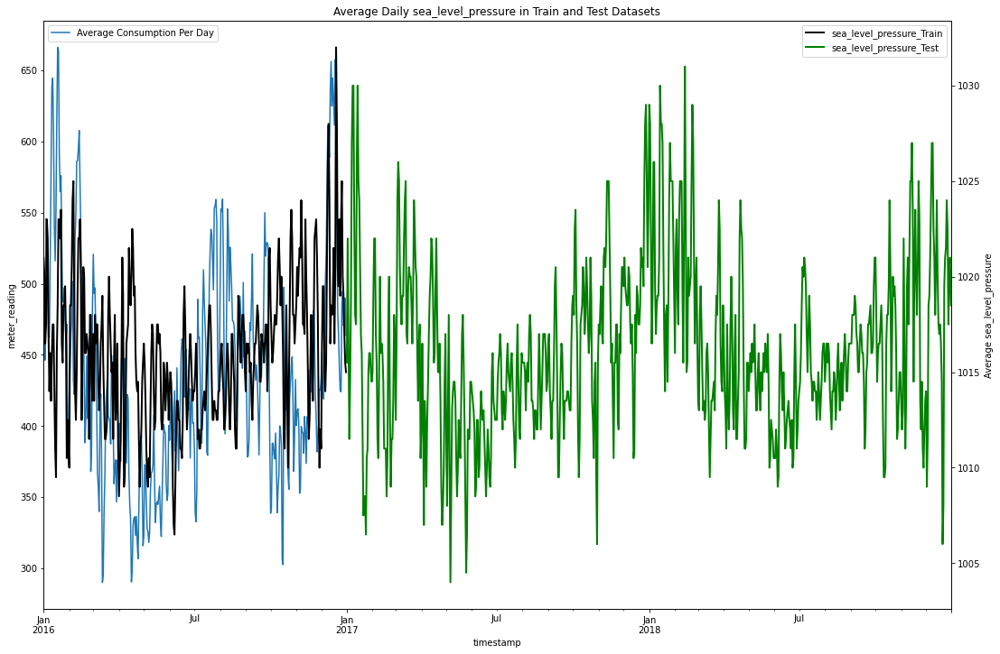

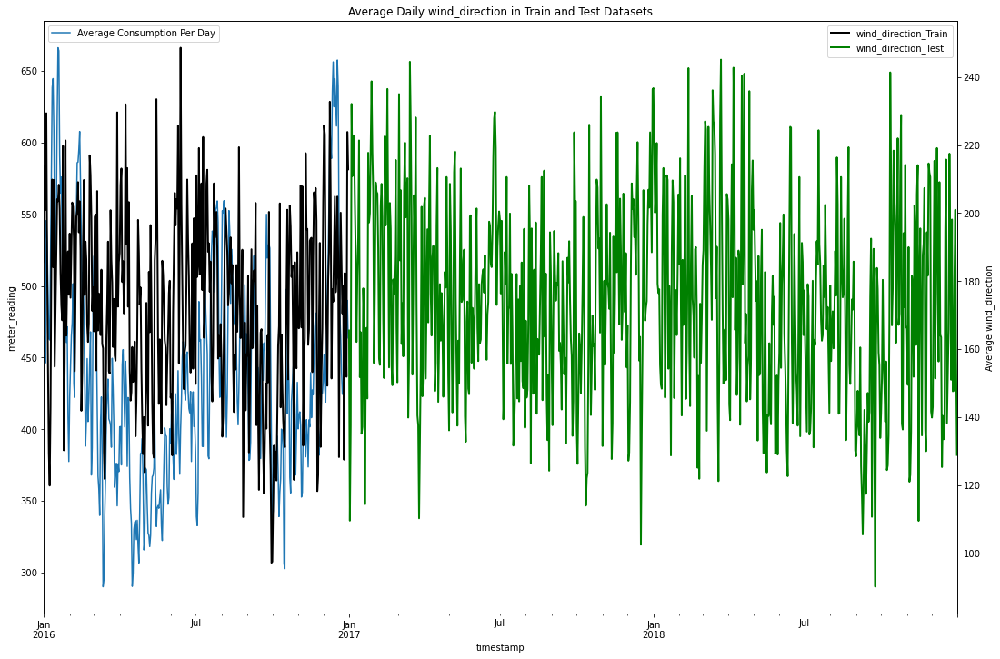

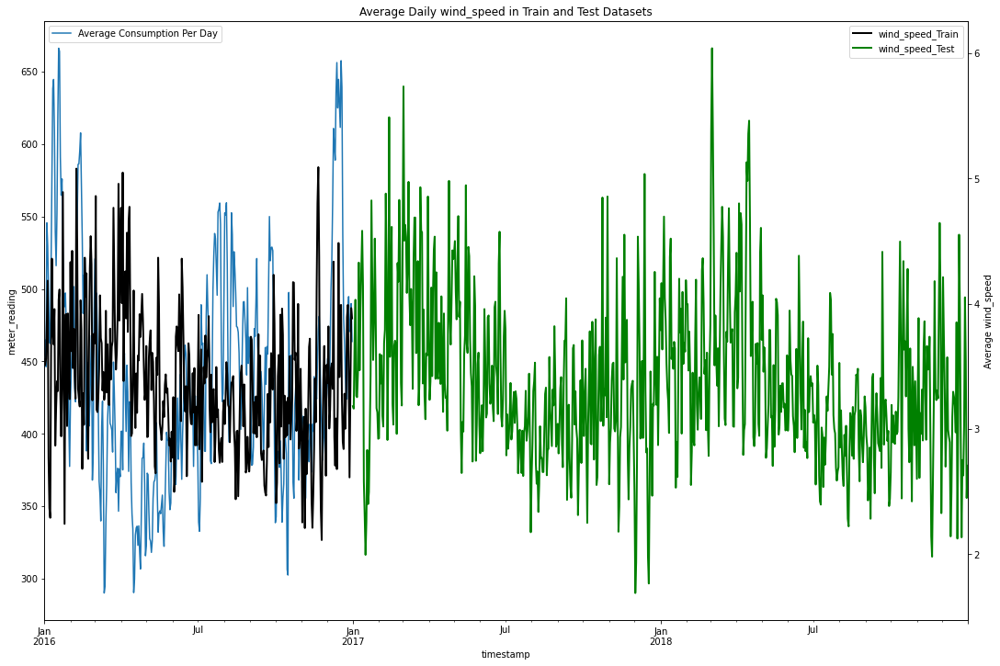

In [70]:
for weather_param in weather_ls:
    
    #plot energy consumption trendline 
    fig, ax1 = plt.subplots(figsize=(18,12))
    sns.lineplot(x = 'timestamp', y = 'meter_reading', data=final_train_df[(final_train_df['building_id'] != 778) & (final_train_df['building_id'] != 1099)][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = "Average Consumption Per Day", ax=ax1)
    ax1.legend(loc = 'upper left')
    
    #plot trendline for weather parameters of train and test datasets
    ax2 = ax1.twinx()
    plt1 = final_train_df.set_index('timestamp').resample('D')[weather_param].mean().plot(color="k", linewidth=2,ax=ax2, title = f'Average Daily {weather_param} in Train and Test Datasets', label=f'{weather_param}_Train')
    plt2 = final_test_df.set_index('timestamp').resample('D')[weather_param].mean().plot(color="g", linewidth=2,ax=ax2, label=f'{weather_param}_Test')
    plt.ylabel(f'Average {weather_param}')
    plt.ticklabel_format(style='plain', useOffset=False, axis='y')
    plt.legend(loc = "upper right")
    plt.show();

Observations: Seasonal trends may be seen in the average temperature, dew temperature, and sea level pressure observations from the train and test datasets. Average meter readings are higher when temperature is very low or very high. This pattern can be explained by the fact that heaters are normally used when temperatures are cold and air conditioners are utilized when temperatures are hot. Both of these variables lead to higher energy use.

In [75]:
# plot time series of avearge readings (per hour / per day) for temp and pressure acorss the different sites 
def plot_weather_readings(df_train, df_test,weather_params):
   
    for site in range(16):

        fig, ax1 = plt.subplots(figsize=(18,12))
        sns.lineplot(x = 'timestamp',y = weather_params, color='blue', data=df_train[df_train['site_id'] == site][['timestamp', weather_params]].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = f"Train {weather_params} Reading Per Hour", ax = ax1)
        sns.lineplot(x = 'timestamp',y = weather_params, color='orange', data=df_train[df_train['site_id'] == site][['timestamp', weather_params]].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = f"Test {weather_params} Reading Per Day", ax = ax1)
        sns.lineplot(x = 'timestamp',y = weather_params, color='green', data=df_test[df_test['site_id'] == site][['timestamp', weather_params]].set_index('timestamp').resample('h').mean().reset_index(), ci = None, label = f"Test {weather_params} Reading Per Hour", ax = ax1)
        sns.lineplot(x = 'timestamp',y = weather_params, color='red', data=df_test[df_test['site_id'] == site][['timestamp', weather_params]].set_index('timestamp').resample('D').mean().reset_index(), ci = None, label = f"Test {weather_params} Reading Per Day", ax = ax1)            
        plt.title(f'Average {weather_params} Reading Per Hour / Per Day at Site {site}')
        plt.ticklabel_format(style='plain', useOffset=False, axis='y')
        plt.legend(loc = "upper right")
        plt.xlabel('Timestamp')
        plt.ylabel(f'Average {weather_params} Reading')

    return

#### Average Temperature across all sites (Degrees Celsius)

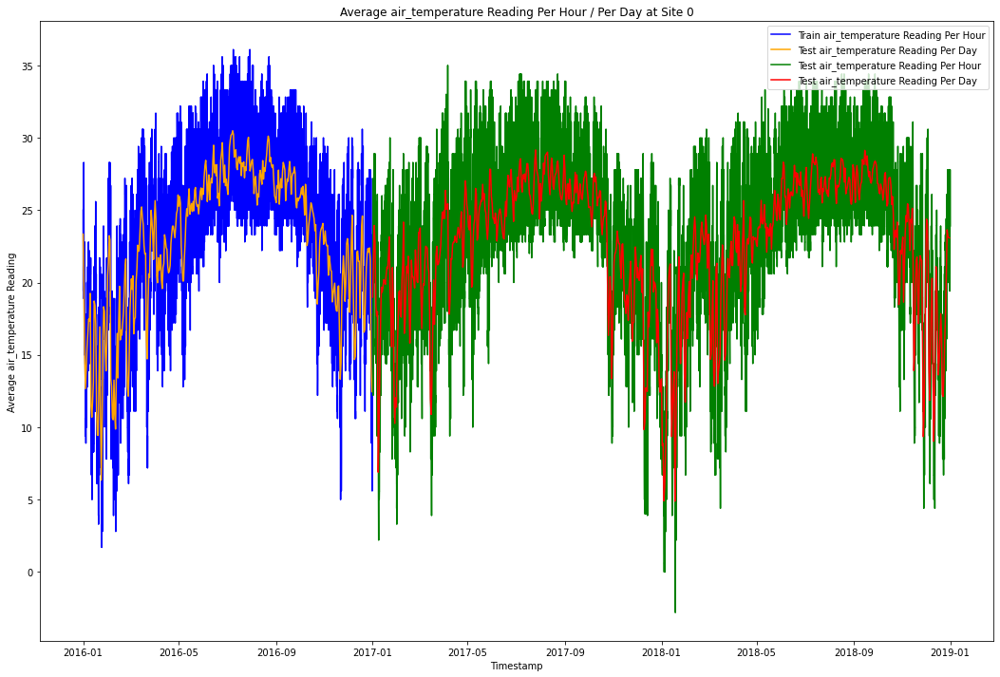

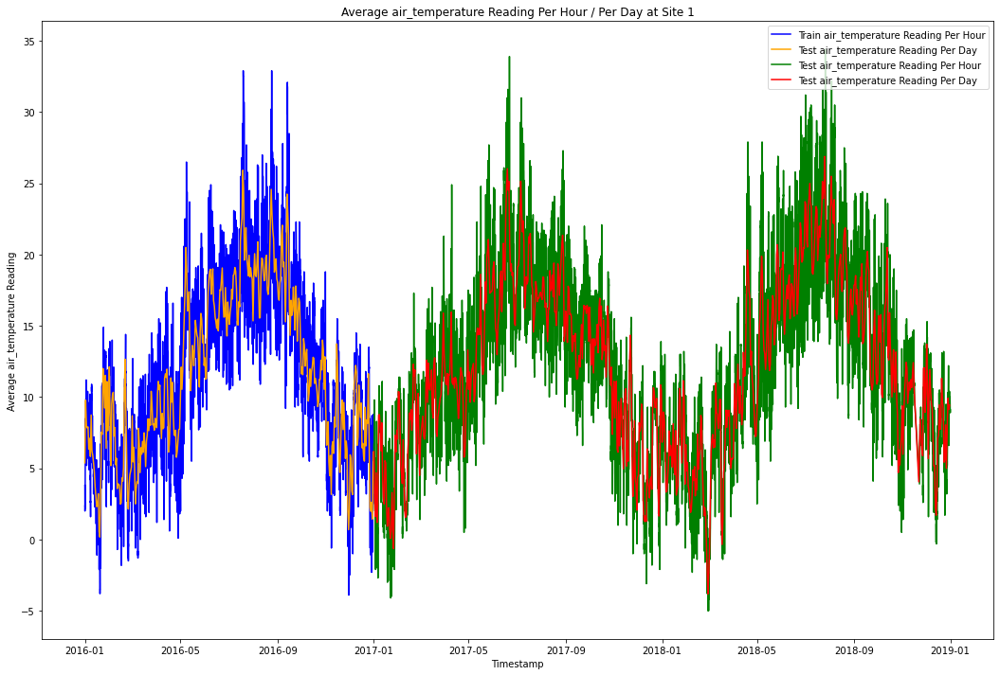

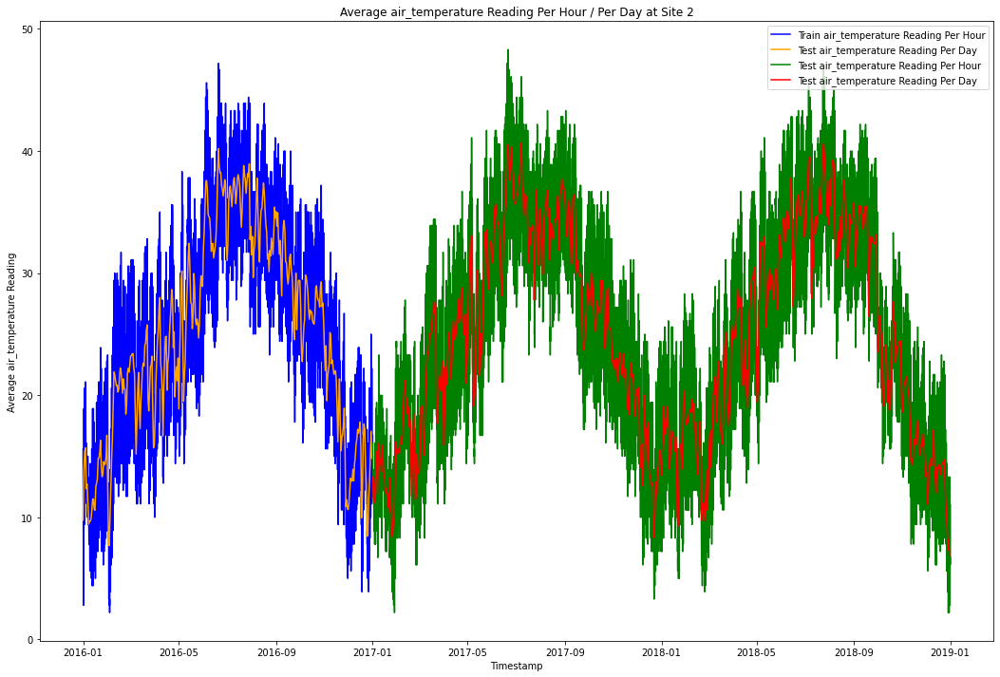

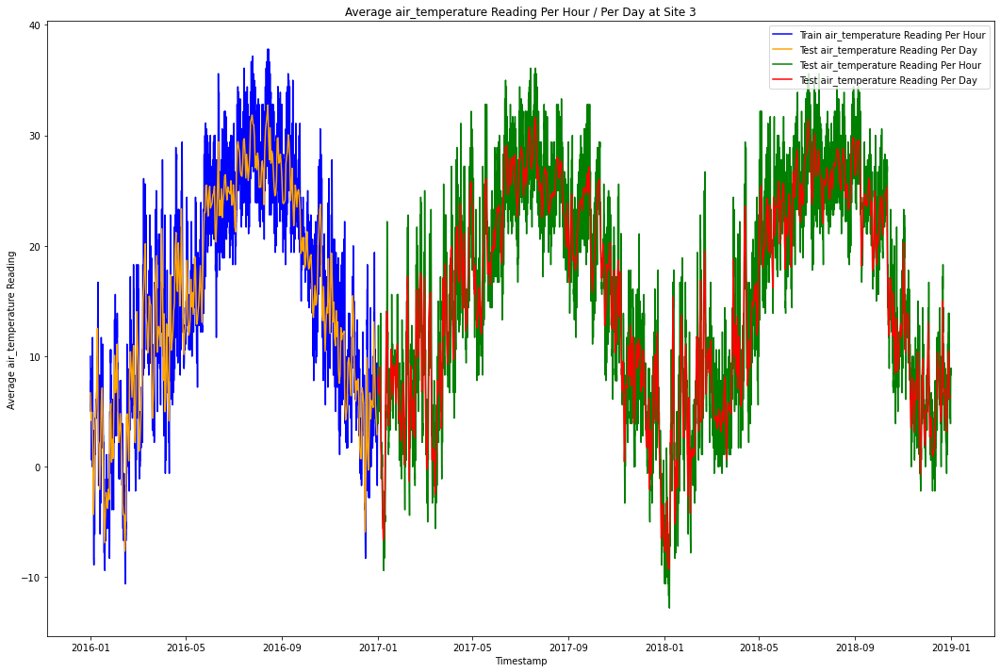

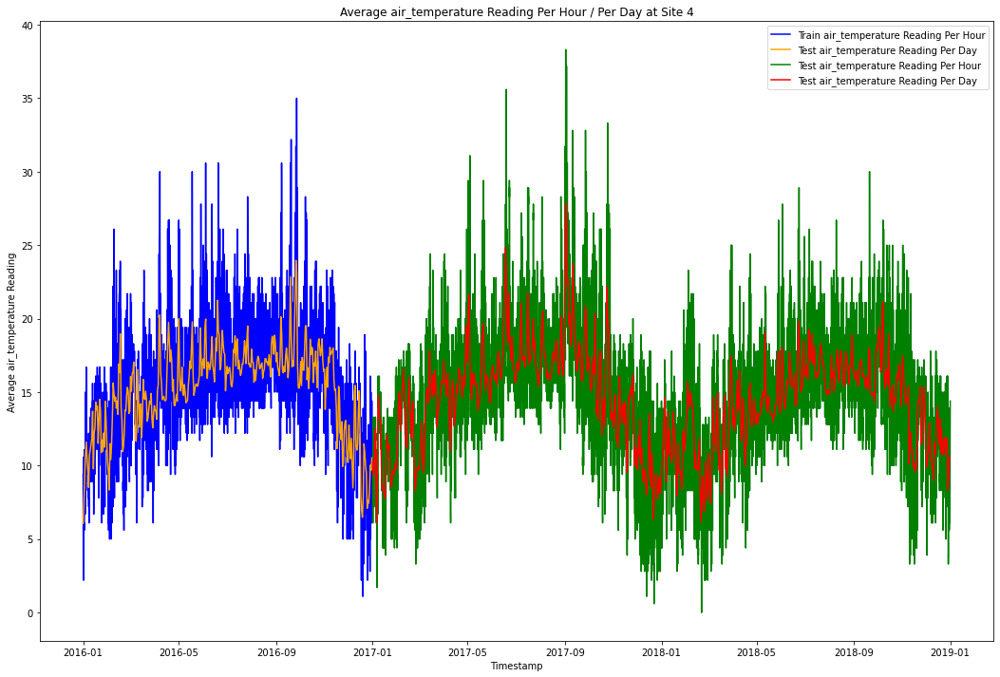

...

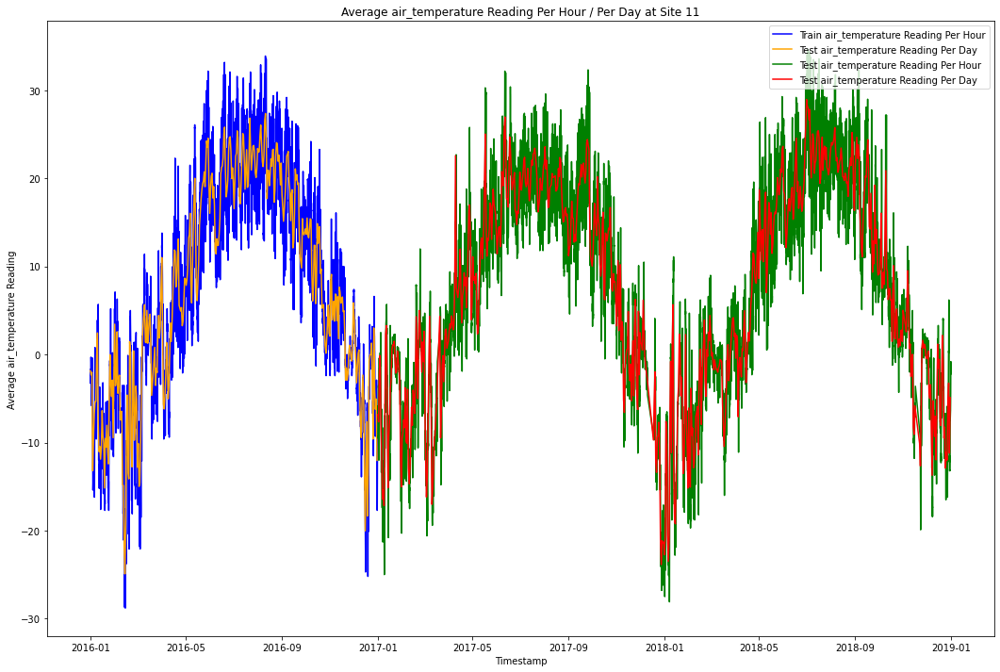

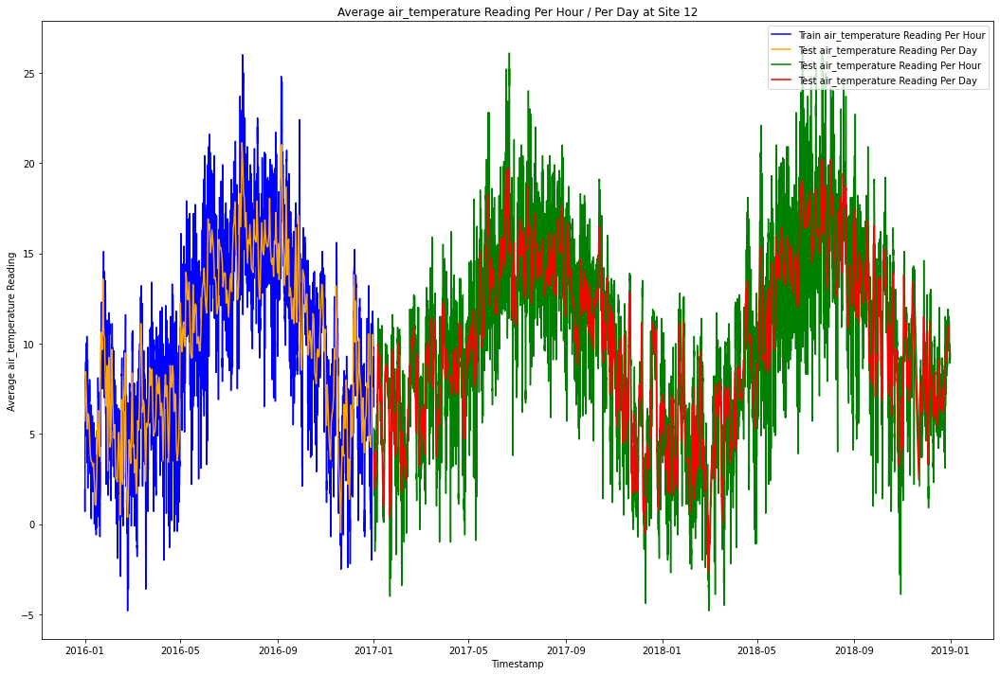

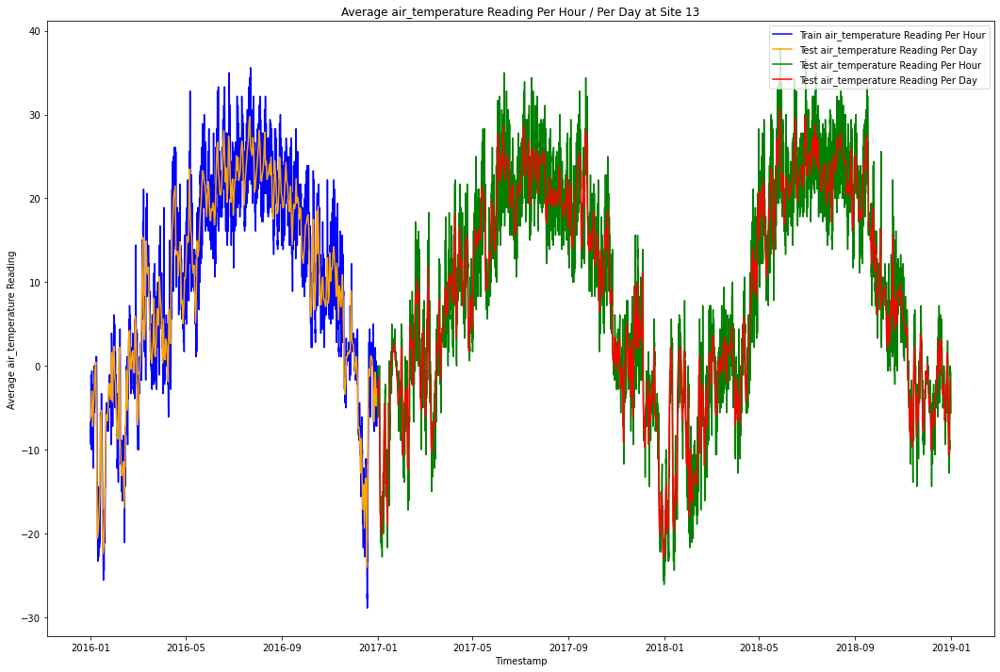

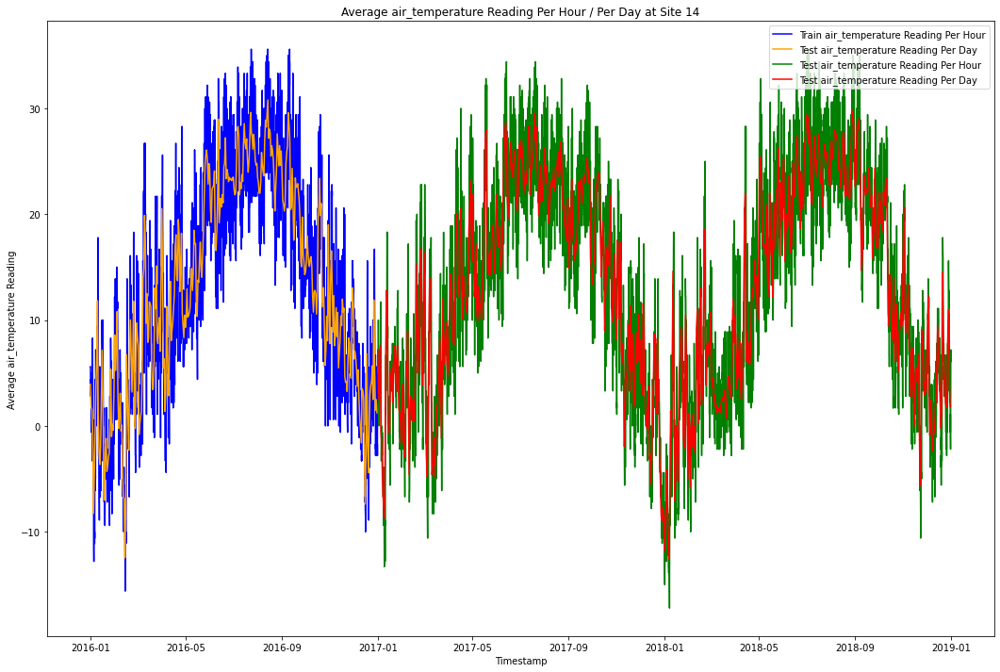

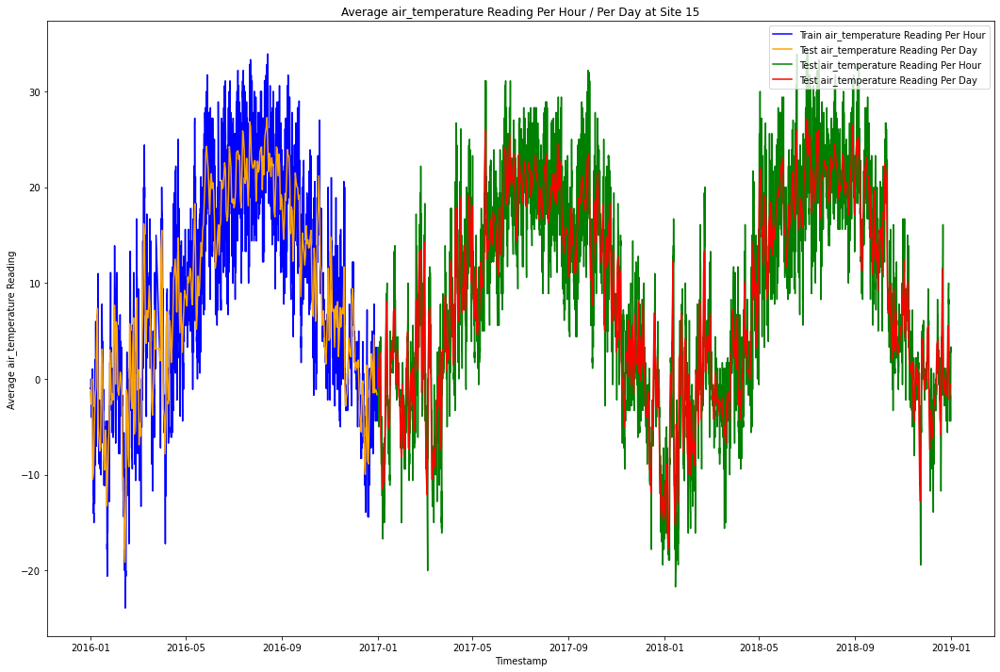

In [73]:
plot_weather_readings(final_train_df,final_test_df,'air_temperature')

#### Sea level pressure across all sites (Millibar/hectopascals)

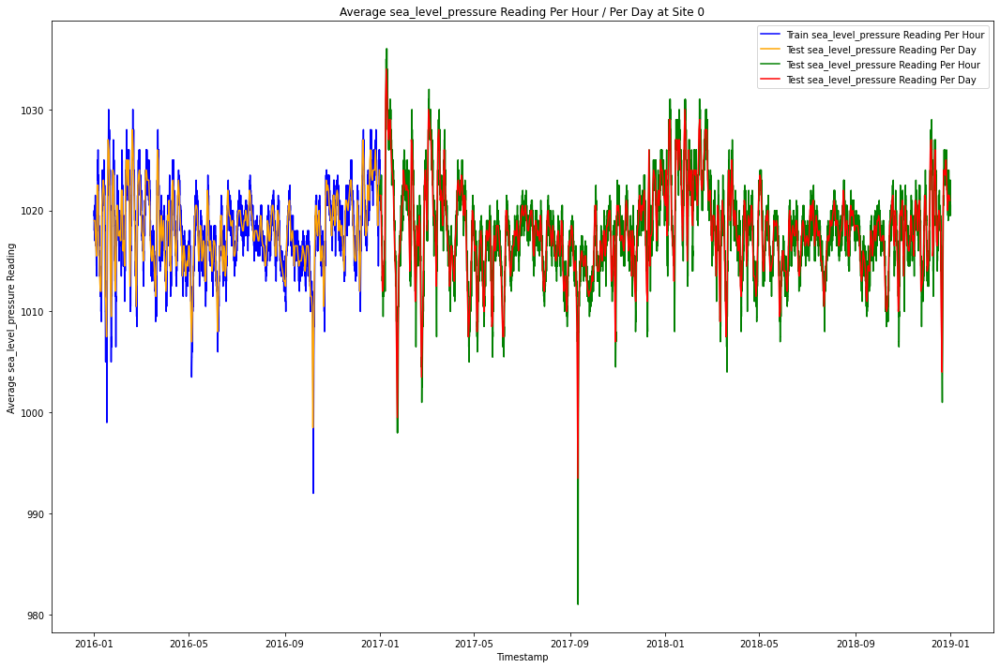

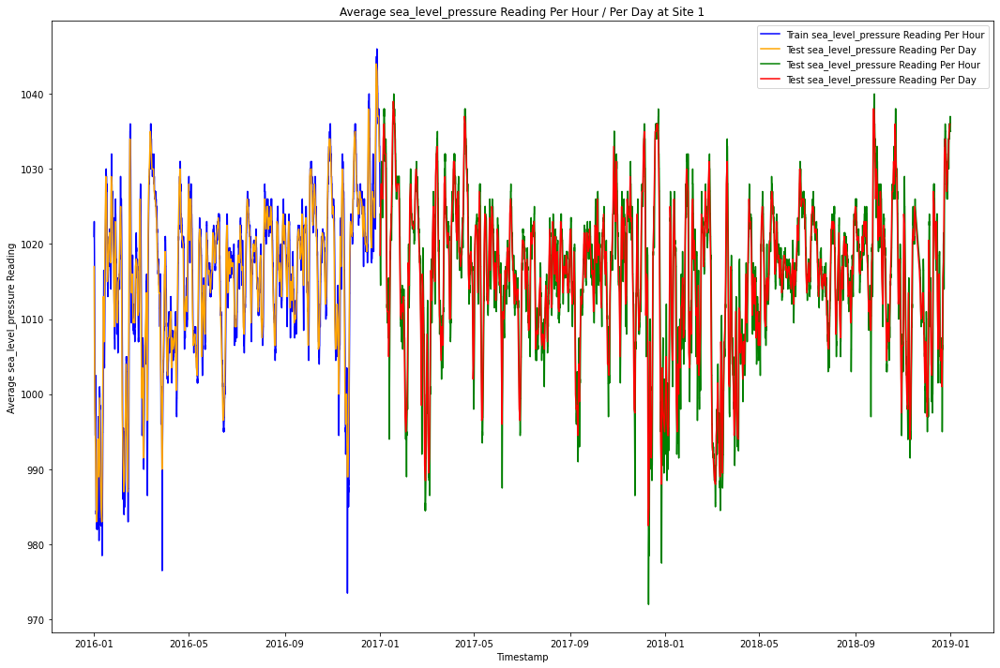

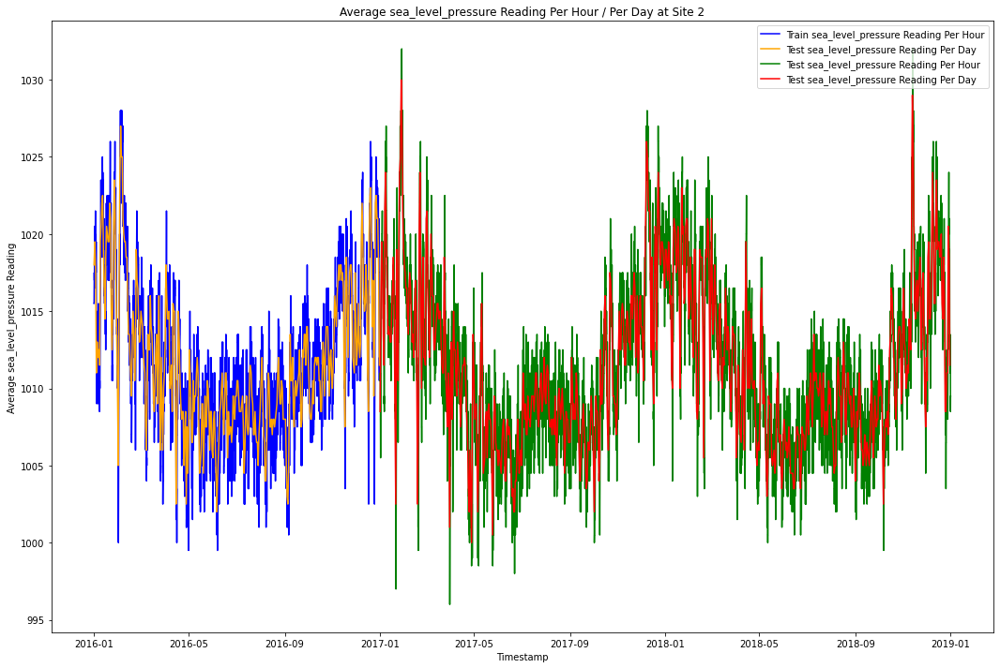

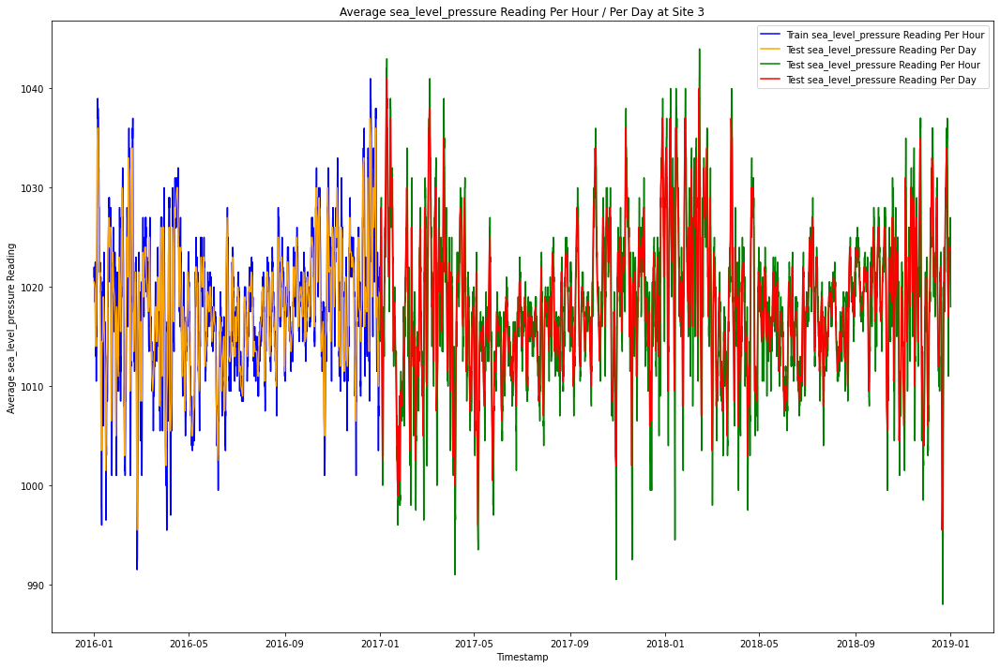

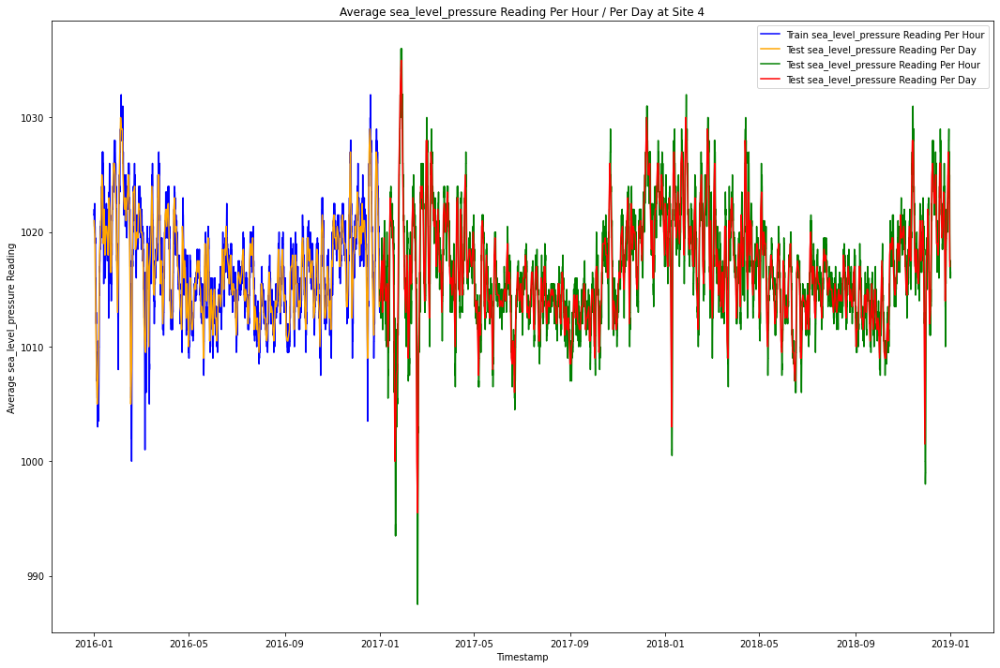

...

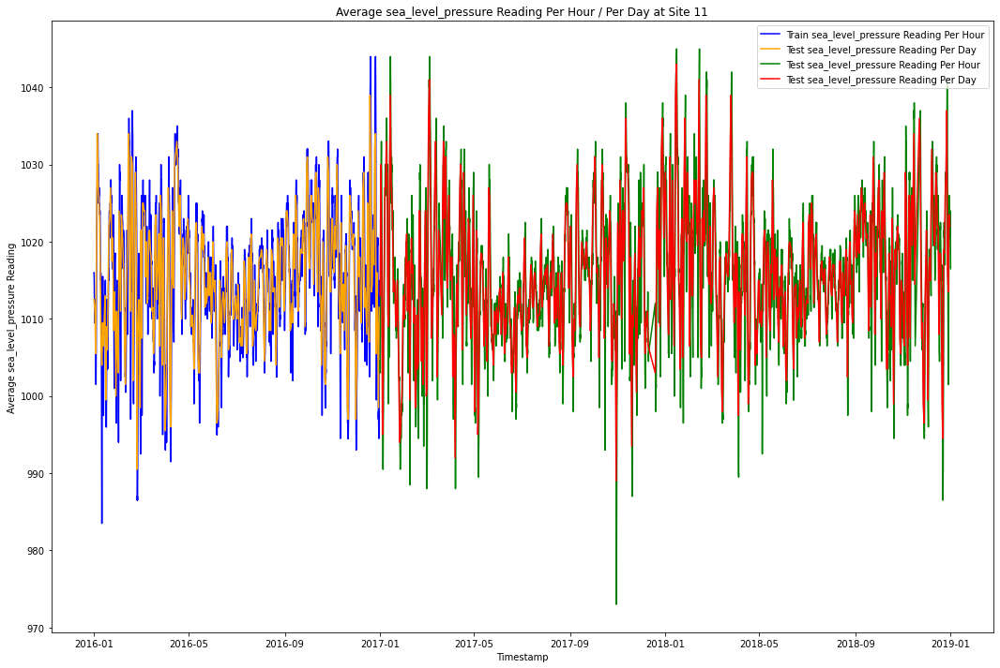

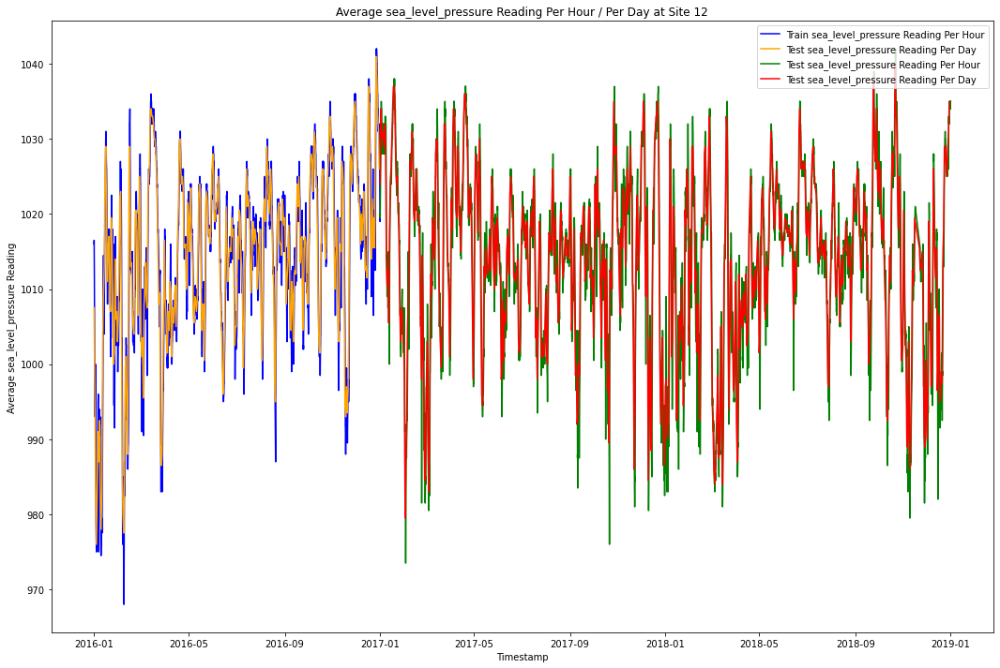

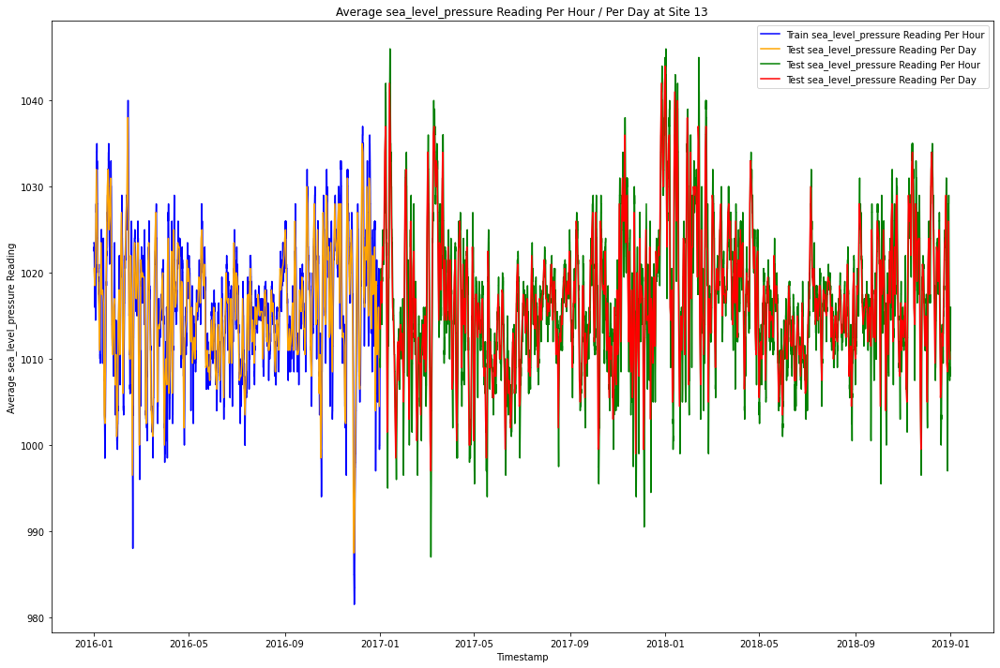

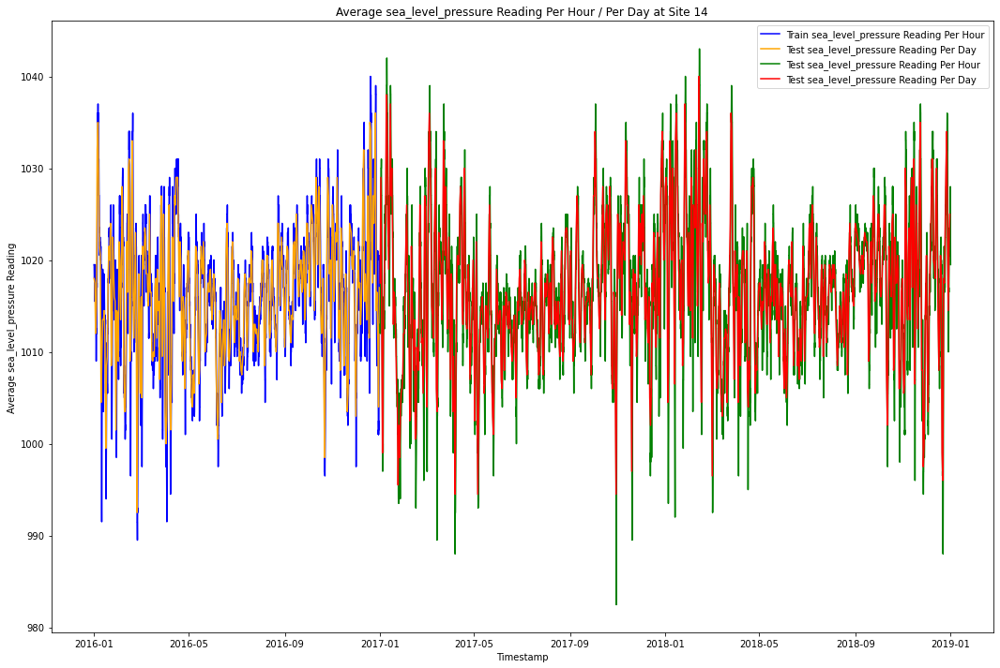

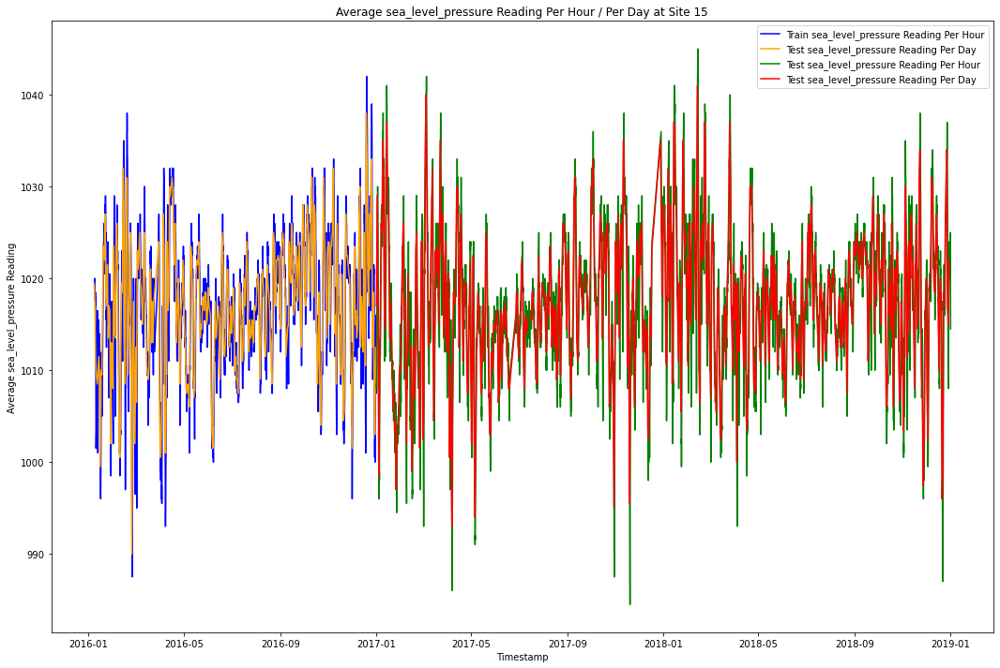

In [77]:
plot_weather_readings(final_train_df,final_test_df,'sea_level_pressure')

In [94]:
final_train_df.groupby('site_id')['air_temperature'].mean().reset_index().sort_values(by='air_temperature',ascending=False)

,site_id,air_temperature
2,2,24.953125
0,0,23.062500
8,8,22.734375
9,9,21.375000
3,3,15.523438
6,6,15.406250
4,4,15.234375
14,14,13.273438
1,1,11.710938
10,10,11.539062


Observations:

- We observed different sites have different average temperatures, and they are most likely spread across various geographic locations.
- Temperature varies per site, with site 2 and 0 being the warmest and sites 7 and 11 being the coldest.
- At site 5, there is no sea level pressure data, indicating that no sensor was installed.

#### Plotting Heatmap and Examining Parameters for Collinearity

In [86]:
#Checking for collinearity between parameters in train dataset
corr_df = pd.DataFrame((final_train_df).corr().abs().unstack().sort_values(ascending=False),columns=['corr'])
corr_df = corr_df[corr_df['corr'] != 1].iloc[::2]
corr_df.head(5)

,,corr
building_id,site_id,0.980975
week,month,0.949883
air_temperature,dew_temperature,0.750636
floor_count,square_feet,0.584495
wind_speed,wind_direction,0.427731


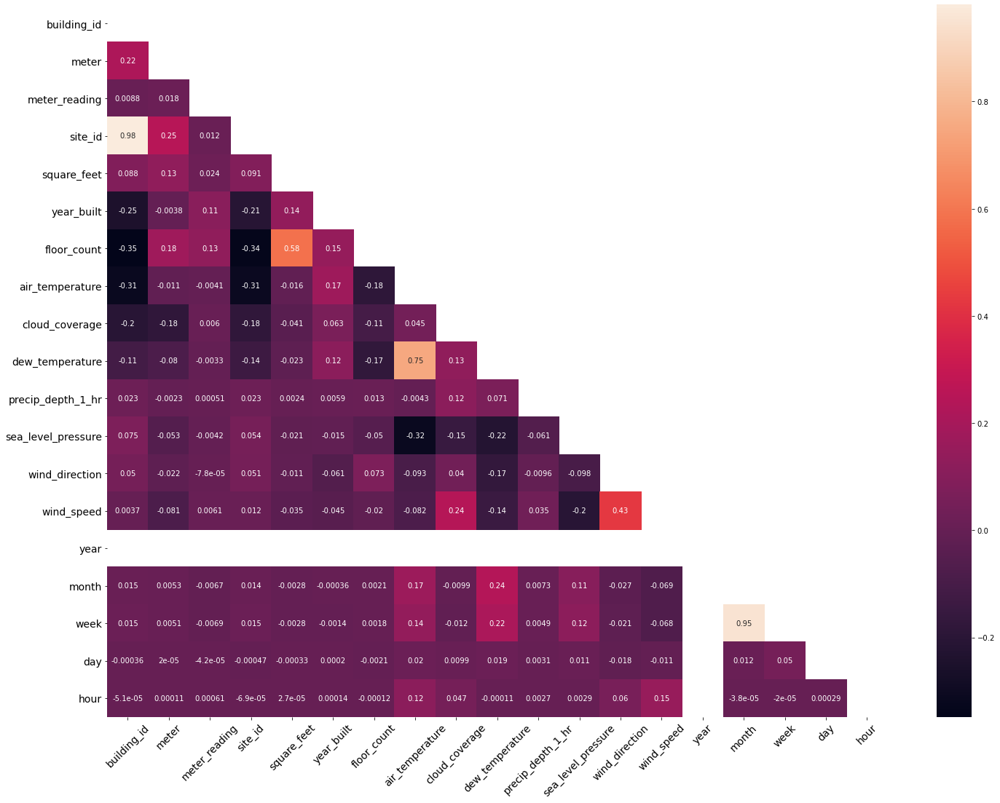

In [87]:
# Generate a mask for the upper triangle (taken from Seaborn example gallery).
mask = np.zeros_like(final_train_df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True       

fig, ax = plt.subplots(figsize=(24,18))

# Plot the heat map with Seaborn.
ax = sns.heatmap(final_train_df.corr(), mask=mask, annot=True)

# Resize the labels.
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14, rotation=45)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14, rotation=0)

plt.show()

Observation: Because there is little correlation between the meter readings and any of the specified parameters, data transformation may be necessary. Building id is highly related to our site id in terms of collinearity attributes, as are air temperature and dew temperature, windspeed and wind direction.

In [95]:
#save merged train and test datasets 
final_train_df.to_csv('../datasets/raw/final_train_df.csv',index=False)
final_test_df.to_csv('../datasets/raw/final_test_df.csv',index=False)

2316357       15 2016-02-12 03:00:00
2324621       15 2016-02-12 07:00:00
2421813       15 2016-02-14 06:00:00
2438385       15 2016-02-14 14:00:00
2554294       15 2016-02-16 22:00:00

In [14]:
weather_train_df[(weather_train_df['timestamp']=='2016-02-12 03:00:00') & (weather_train_df['site_id']==15) ]

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
